In [2]:
import pandas as pd
# for plots
import matplotlib
#%matplotlib qt
%matplotlib inline
import matplotlib.pyplot as plt
matplotlib.rcParams['figure.figsize'] = (20.0, 10.0) # bigger figure!
import seaborn as sns
sns.set()
sns.set_palette(sns.color_palette("husl", 5))
sns.set(style="whitegrid",font_scale=3)
import numpy as np

# Actions

In [2]:
action_log_df = pd.read_csv('action_logger.csv', names=['user_id','session_number','action_id','validation_timestamp','validation_state_id',\
	'action','style','duration','validation','trigger_timestamp','trigger_state_id'])

action_log_df['validation'].value_counts()

STYLE_UPDATE        64180
UNPROMPTED           6850
REFUSED              4691
PASSIVE_ACCEPTED     2150
CONTROL              1952
VALIDATED            1119
Name: validation, dtype: int64

In [3]:
action_log_df[(action_log_df['validation']=='UNPROMPTED') & (action_log_df['user_id']=='DB')]

,user_id,session_number,action_id,validation_timestamp,validation_state_id,action,style,duration,validation,trigger_timestamp,trigger_state_id
1645,DB,1,5823d982-00ed-4275-960c-7ee4f49bccf6,1.561135e+09,072ca5ad-7612-4f37-8f96-6a07e9cc634e,HUMOUR,POSITIVE,0,UNPROMPTED,1.561135e+09,072ca5ad-7612-4f37-8f96-6a07e9cc634e
1648,DB,1,7043e628-c202-4dac-8c30-2281fc09b094,1.561135e+09,eec77c7e-6d14-4bbc-9284-5737f006c011,MAINTAIN,POSITIVE,0,UNPROMPTED,1.561135e+09,eec77c7e-6d14-4bbc-9284-5737f006c011
1650,DB,1,4f688300-f87c-445f-9e4c-e572ed469c2d,1.561136e+09,e121a5cd-e68f-457d-800e-3403732823fb,SPEEDDOWN,SYMPATHETIC,0,UNPROMPTED,1.561136e+09,e121a5cd-e68f-457d-800e-3403732823fb
1657,DB,1,a077a034-8762-4408-bfc3-282f79159abc,1.561136e+09,dfef5e06-31d3-484c-abf8-393f0b7503ba,CHALLENGE,CHALLENGING,0,UNPROMPTED,1.561136e+09,dfef5e06-31d3-484c-abf8-393f0b7503ba
1662,DB,1,a9ae3b08-ec88-4235-af05-87604eac2e76,1.561136e+09,b840e399-b619-4907-a3f8-704dc429ae30,PRAISE,POSITIVE,0,UNPROMPTED,1.561136e+09,b840e399-b619-4907-a3f8-704dc429ae30
...,...,...,...,...,...,...,...,...,...,...,...
69632,DB,17,cc0583bf-1b68-4a8d-960a-687b7037384d,1.566407e+09,95ac126c-ffe9-4fbd-9fac-c6328cfc7da9,PRAISE,POSITIVE,0,UNPROMPTED,1.566407e+09,95ac126c-ffe9-4fbd-9fac-c6328cfc7da9
69635,DB,17,8d4e8a3d-b3b9-4654-8129-4841c8ac9e34,1.566408e+09,5f91d841-7627-4728-8b26-b51308bb2f83,TIME,CHALLENGING,0,UNPROMPTED,1.566408e+09,5f91d841-7627-4728-8b26-b51308bb2f83
69636,DB,17,959efe11-3a71-461e-946e-c2e75acb561c,1.566408e+09,8ef43a3a-2604-462d-8559-f521d61eee62,GET_CLOSER,CHALLENGING,0,UNPROMPTED,1.566408e+09,8ef43a3a-2604-462d-8559-f521d61eee62
69644,DB,17,329b4b3c-4d43-44ca-a2f4-f71a710147c2,1.566408e+09,515f3f95-6376-4b94-b031-ec85757e4aed,PRAISE,SYMPATHETIC,0,UNPROMPTED,1.566408e+09,515f3f95-6376-4b94-b031-ec85757e4aed


In [5]:
pd.set_option('display.max_rows', 10)

# all training actions (actions from supervised sessions)
LB_training_action_log_df=action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']<23) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
FB_training_action_log_df=action_log_df[(action_log_df['user_id']=='FB') & (action_log_df['session_number']<22) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DB_training_action_log_df=action_log_df[(action_log_df['user_id']=='DB') & (action_log_df['session_number']<18) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JF_training_action_log_df=action_log_df[(action_log_df['user_id']=='JF') & (action_log_df['session_number']<23) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
MR_training_action_log_df=action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']<19) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DP_training_action_log_df=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']<22) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JW_training_action_log_df=action_log_df[(action_log_df['user_id']=='JW') & (action_log_df['session_number']<23) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
GB_training_action_log_df=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']<22) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
MB_training_action_log_df=action_log_df[(action_log_df['user_id']=='MB') & (action_log_df['session_number']<15) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
PT_training_action_log_df=action_log_df[(action_log_df['user_id']=='PT') & (action_log_df['session_number']<19) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()

frames = [LB_training_action_log_df,FB_training_action_log_df,DB_training_action_log_df,JF_training_action_log_df,MR_training_action_log_df,DP_training_action_log_df,JW_training_action_log_df,GB_training_action_log_df,MB_training_action_log_df,PT_training_action_log_df]
training_action_log_df = pd.concat(frames)

training_action_log_df.sort_values(by=['validation_timestamp'])

# training_action_log_df

# for generating an ordered list of supervised sessions (for progress of the learner against chronological session execution)
# training_action_log_df.drop_duplicates(subset=['user_id','session_number'], inplace=True)

# training_action_log_df.sort_index(inplace=True)

# training_action_log_df.to_csv('supervised_session_list', index = False)

# #training_action_log_df['user_id','session_number']

,user_id,session_number,action_id,validation_timestamp,validation_state_id,action,style,duration,validation,trigger_timestamp,trigger_state_id
32,FB,1,24d07b60-2e95-4022-ad3e-c0061b87b002,1.560772e+09,a37aedc8-5126-4fba-a70f-4c7c362d0a14,CHECKPRE,SYMPATHETIC,0,UNPROMPTED,1.560772e+09,a37aedc8-5126-4fba-a70f-4c7c362d0a14
29,FB,1,f3d53b0f-e3cd-45b3-bd99-defcb8048f99,1.560772e+09,a85601e6-f0e0-40b8-8de7-9a61f55d83cd,CHALLENGE,CHALLENGING,0,UNPROMPTED,1.560772e+09,a85601e6-f0e0-40b8-8de7-9a61f55d83cd
33,FB,1,2604ef57-5a94-4197-a893-b806ab6c08de,1.560772e+09,444ca494-bad9-496f-8fd9-aeb2c12f585e,PRAISE,SYMPATHETIC,0,UNPROMPTED,1.560772e+09,444ca494-bad9-496f-8fd9-aeb2c12f585e
42,FB,1,32d22246-8298-4bbc-bc88-88a2831b5151,1.560772e+09,1abec283-13cb-4cc9-9a90-10e6fcaa02a7,MAINTAIN,POSITIVE,0,UNPROMPTED,1.560772e+09,1abec283-13cb-4cc9-9a90-10e6fcaa02a7
48,FB,1,31754d52-dce6-4158-b9cd-edc418821dc7,1.560772e+09,fd602057-c549-45bf-8f45-845f990f3548,CHALLENGE,CHALLENGING,0,UNPROMPTED,1.560772e+09,fd602057-c549-45bf-8f45-845f990f3548
...,...,...,...,...,...,...,...,...,...,...,...
71785,MR,18,e257cd69-cfff-45cc-8587-144de4029f30,1.566553e+09,d3b9654b-e384-4bf7-ab8e-1a9e90a150bc,ANIMATION,POSITIVE,0,REFUSED,1.566553e+09,f0e32471-3712-4ef7-a149-b6b6036d27a5
71788,MR,18,2530519c-f529-4cba-a3de-899f47744d5d,1.566553e+09,46001831-4f7b-4fb0-a8f5-2af213378418,ANIMATION,POSITIVE,0,REFUSED,1.566553e+09,5340bc34-0af0-4cfa-97cf-80c1991ab967
71789,MR,18,553ee7ab-8c77-4da0-94fa-917e990f1260,1.566553e+09,f64db8cd-2112-4305-954d-1c5a9ff4854a,SYMPATHISE,SYMPATHETIC,0,UNPROMPTED,1.566553e+09,f64db8cd-2112-4305-954d-1c5a9ff4854a
71791,MR,18,95c420fb-23ca-4af8-87d7-c29a72a7a0a8,1.566553e+09,1da6ef91-794b-4ebf-ad6c-b9bbf01310e2,CHALLENGE,SYMPATHETIC,0,REFUSED,1.566553e+09,332a88a8-45c5-406e-87be-c8b67acdfbba


# CHAPTER 4: CREATING AN AUTONOMOUS SAR 

# Utilisation of System (RQ1)

## Usability & appropriate action policies

Text(0.5, 1.0, 'Supervised Action Execution(as per Interface)')

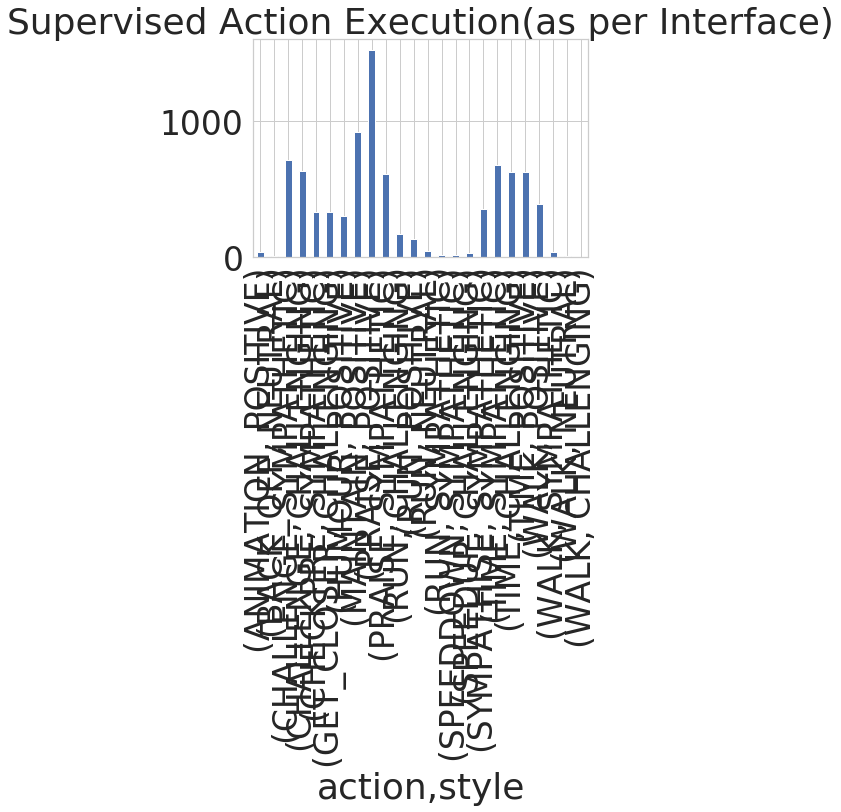

In [6]:
# drop refuseds
executed_training_action_log_df = training_action_log_df[training_action_log_df['validation'] != 'REFUSED'].copy()
plt=executed_training_action_log_df.groupby("action")["style"].value_counts(normalize=False).plot.bar(stacked=False)
plt.set_title("Supervised Action Execution(as per Interface)")

Text(0.5, 1.0, 'Supervised Action Execution (as {action-type, style})')

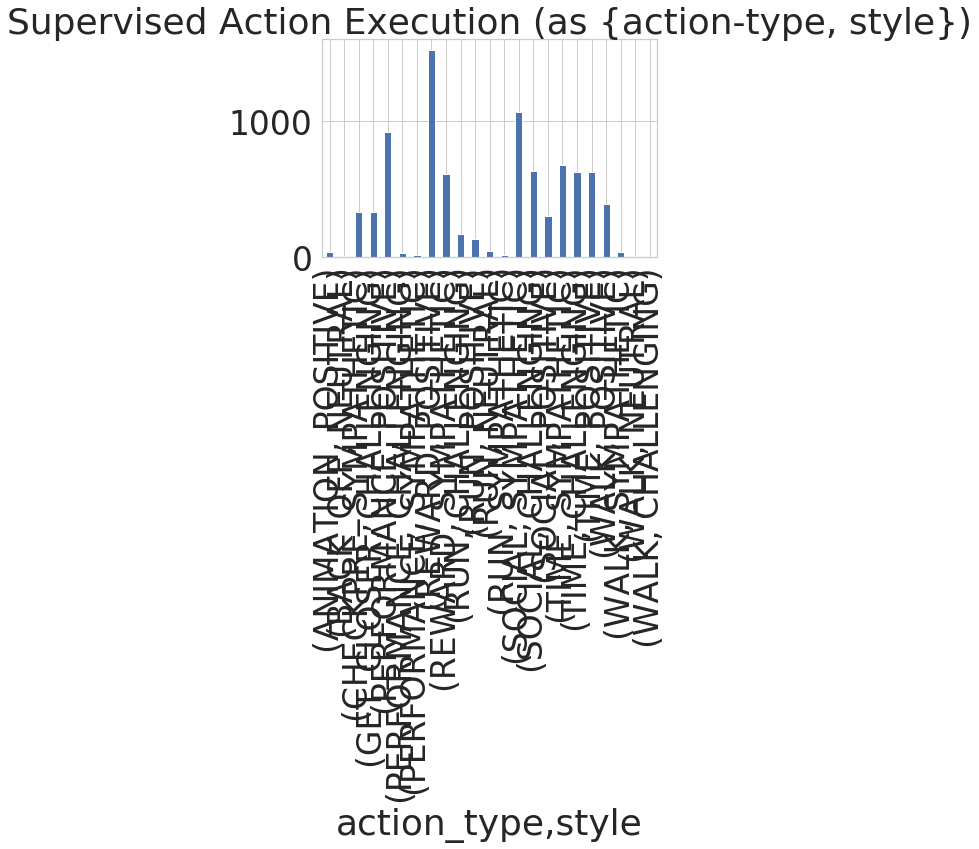

In [7]:
# as above but for {action-type,style} pairings
executed_training_action_log_df['action_type']=executed_training_action_log_df['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))
plt=executed_training_action_log_df.groupby("action_type")["style"].value_counts(normalize=False).plot.bar(stacked=False)
plt.set_title("Supervised Action Execution (as {action-type, style})")

[Text(0, 0, 'TIME'),
 Text(0, 0, 'PRAISE'),
 Text(0, 0, 'CHALLENGE'),
 Text(0, 0, 'MAINTAIN'),
 Text(0, 0, 'HUMOUR'),
 Text(0, 0, 'CHECKPRE'),
 Text(0, 0, 'GET_CLOSER'),
 Text(0, 0, 'SPEEDDOWN'),
 Text(0, 0, 'SYMPATHISE'),
 Text(0, 0, 'ANIMATION'),
 Text(0, 0, 'SPEEDUP'),
 Text(0, 0, 'BACK_OFF')]

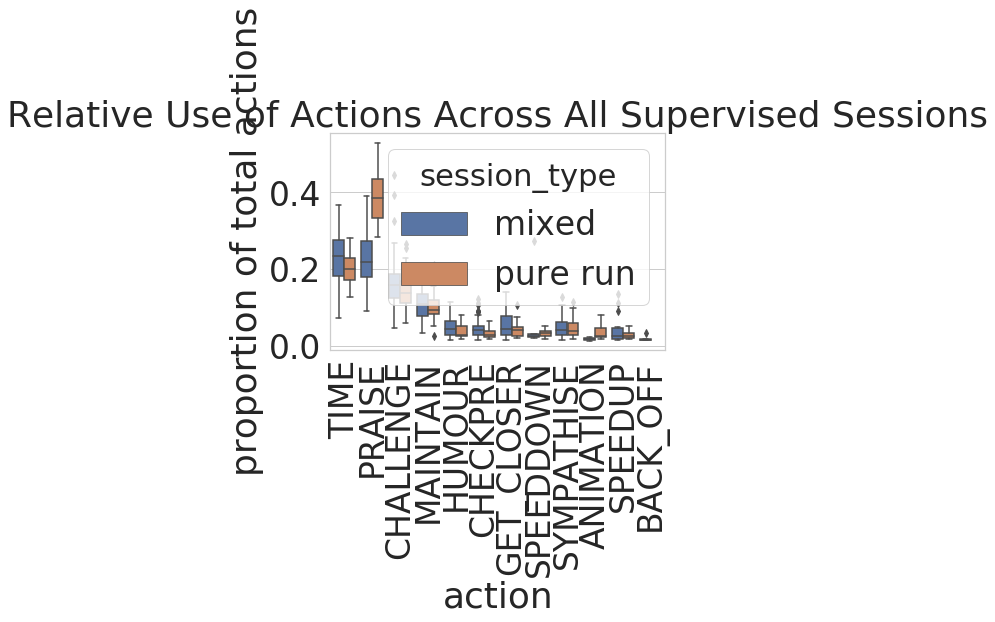

In [8]:
# add session type to training_action_log_df
# sessions <=17, except 15, are all mixed
mixed_executed_action_log_df=executed_training_action_log_df[(executed_training_action_log_df['session_number']<=17)].copy()

indexNames = mixed_executed_action_log_df[mixed_executed_action_log_df['session_number'] == 15].index
mixed_executed_action_log_df.drop(indexNames , inplace=True)

# sessions 18+ and 15 are pure runs
run_executed_action_log_df=executed_training_action_log_df[(executed_training_action_log_df['session_number']>=18)].copy()
run_15 = executed_training_action_log_df[(executed_training_action_log_df['session_number']==15)].copy()
run_executed_action_log_df = run_executed_action_log_df.append(run_15)

# try without dropping run and walk first for style comparisons

mixed_executed_action_log_df['session_type']='mixed'
run_executed_action_log_df['session_type']='pure run'

all_spvd_executed_actions_df=pd.concat([mixed_executed_action_log_df, run_executed_action_log_df])

value_count = all_spvd_executed_actions_df.groupby(['user_id','session_number','session_type'])['action'].value_counts(normalize=True)
value_count = value_count.reset_index(name='proportion of total actions')

indexNames = value_count[value_count['action'] == 'RUN'].index
value_count.drop(indexNames , inplace=True)

indexNames = value_count[value_count['action'] == 'WALK'].index
value_count.drop(indexNames , inplace=True)

# value_count

#print(type(value_count))

#value_count_df.action.unique()


# for differences in supervised, executed actions for the two types of exercise session (across all users) use hue = 'session_type')
#value_count['action']=value_count['action'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CU" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))
ax = sns.boxplot(x="action", y='proportion of total actions', hue='session_type', data=value_count)
ax.set_title("Relative Use of Actions Across All Supervised Sessions")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


Text(0.5, 1.0, 'Relative Use of Styles Across All Supervised Sessions')

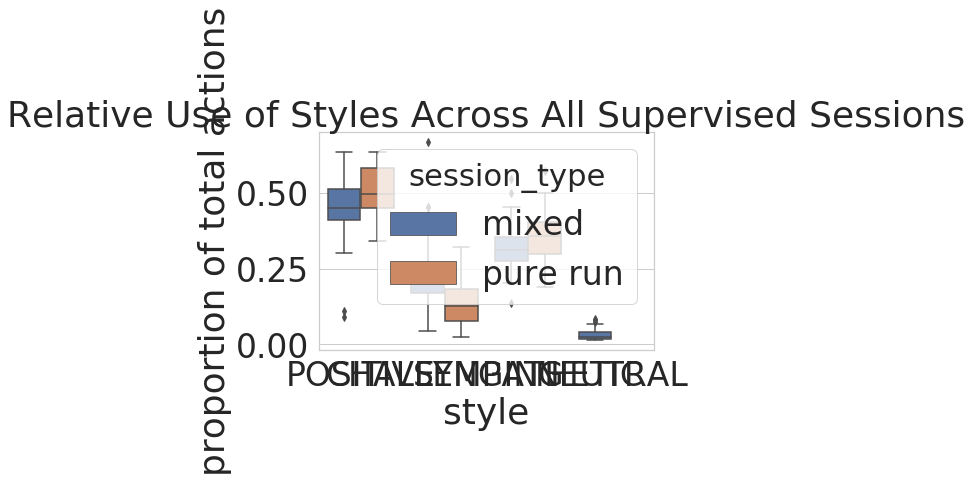

In [9]:
value_count = all_spvd_executed_actions_df.groupby(['user_id','session_number','session_type'])['style'].value_counts(normalize=True)
value_count = value_count.reset_index(name='proportion of total actions')

# value_count

#print(type(value_count))

#value_count_df.action.unique()


# for differences in supervised, executed actions for the two types of exercise session (across all users) use hue = 'session_type')
#value_count['action']=value_count['action'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CU" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))
ax = sns.boxplot(x="style", y='proportion of total actions', hue='session_type', data=value_count)
ax.set_title("Relative Use of Styles Across All Supervised Sessions")
#ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

Text(0.5, 1.0, 'Number of Actions Across All Supervised Sessions')

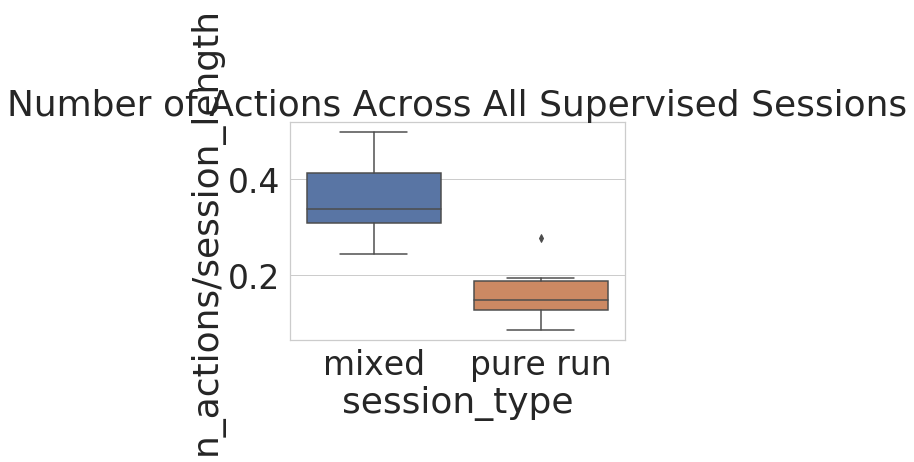

In [10]:
# session type number of actions

action_count=all_spvd_executed_actions_df.drop(columns=['validation_timestamp','validation_state_id','action','style','duration','validation','trigger_timestamp','trigger_state_id'])

# this contains total number of actions per session 
value_count = action_count[['session_number','session_type','action_id']].groupby(['session_number','session_type']).count().reset_index()

# need (probably?) to now also add a column of session lengths to normalise against
value_count['session_length'] = value_count['session_number'].apply(lambda x: 1200 if x == 1 else (1200 if x == 2 else (1200 if x == 3 else (1260 if x == 4 else 1260 if x == 5 else (1260 if x == 6 else (1080 if x == 7 else (1080 if x == 8 else (1080 if x == 9 else (1290 if x == 10 else (1290 if x == 11 else (1290 if x == 12 else 1260 if x == 13 else (1260 if x == 14 else (1200 if x == 15 else (1440 if x == 16 else (1380 if x == 17 else (1500 if x == 18 else (1500 if x == 19 else 1500 if x == 20 else (1500 if x == 21 else (1680 if x == 22 else (1680 if x == 22 else (1680 if x == 23 else 1800))))))))) )))))) ))))))
                                                                                                   
value_count['n_actions'] = value_count['action_id']
value_count=value_count.drop(columns=['action_id'])
value_count['n_actions/session_length'] = value_count['n_actions'] / value_count['session_length']
                                                                                                   
ax = sns.boxplot(x="session_type", y="n_actions/session_length", data=value_count)

ax.set_title("Number of Actions Across All Supervised Sessions")
# my_palette = ["#00C5D0","#FBDE25"]
# ax = sns.swarmplot(x="session_type", y="n_actions/session_length", data=value_count, palette=my_palette, dodge=True)

# ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# this also shows how few training examples the learner got for the pure run sessions (for some people)



In [11]:
# need to add something in here for importing and plotting session/robot as fitness instructor ratings for 
# supervised sessions

phase1_df = action_log_df[(action_log_df['validation']!='REFUSED' & action_log_df['session_number']<=8)].copy()
phase1_df.groupby(['user_id','session_number']).value_counts()
                          


TypeError: cannot compare a dtyped [int64] array with a scalar of type [bool]

## Personalisation

Text(0.5, 1.0, 'Relative Use of Styles Across Participants in Supervised Sessions')

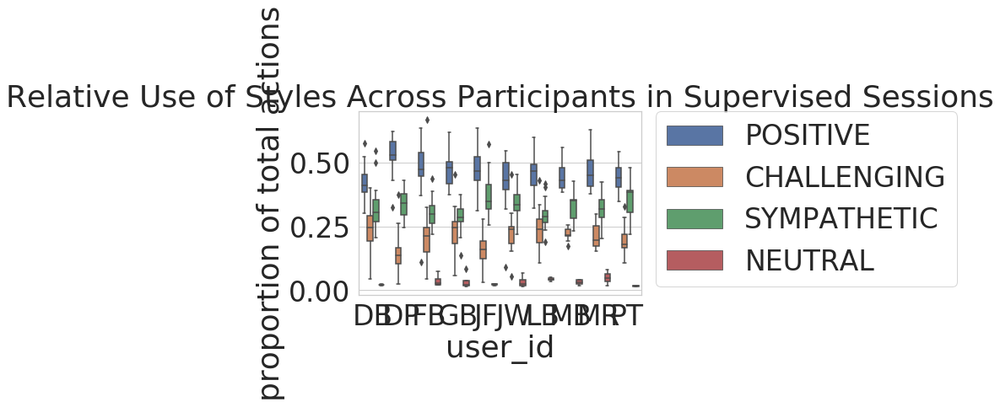

In [11]:
# personalisation of action styles across participants
# not sure whether (i) this boxplot (like this) or stacked bar shows it better?
# (ii) whether to show over all supervised sessions or just one, same session for *all* participants (to minimise)
# differences coming from session programme/task difference and to remove need to normalise... see below

value_count = all_spvd_executed_actions_df.groupby(['user_id','session_number'])['style'].value_counts(normalize=True)
value_count = value_count.reset_index(name='proportion of total actions')

ax = sns.boxplot(x="user_id", y="proportion of total actions", hue='style', data=value_count)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_title("Relative Use of Styles Across Participants in Supervised Sessions")

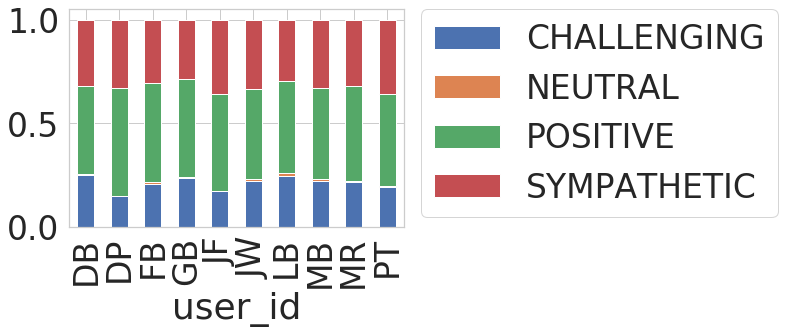

In [12]:
plt = all_spvd_executed_actions_df.groupby(["user_id"])["style"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Text(0.5, 1.0, 'Style of Actions Executed in (Supervised) Session 17')

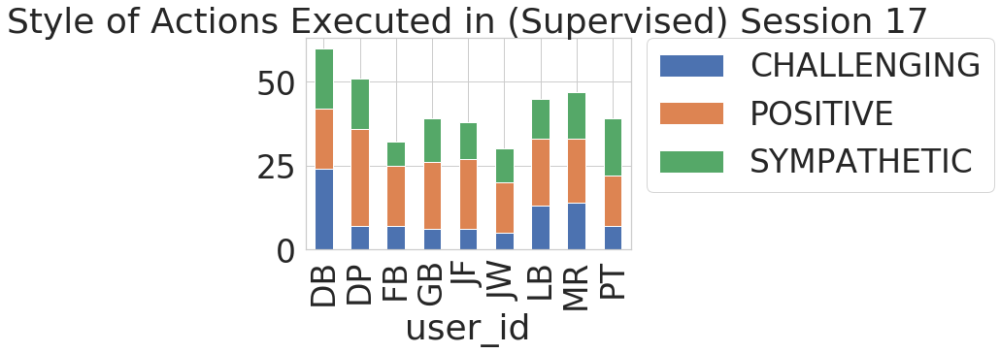

In [13]:
# last supervised session that *all participants* completed = session 17
# variation in styles
all17_executed_action_log_df=executed_training_action_log_df[(executed_training_action_log_df['session_number']==17)].copy()

plt = all17_executed_action_log_df.groupby(["user_id"])["style"].value_counts(normalize=False).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Style of Actions Executed in (Supervised) Session 17")

Text(0.5, 1.0, 'Style of Actions Executed in (Supervised) Session 17 - Normalised')

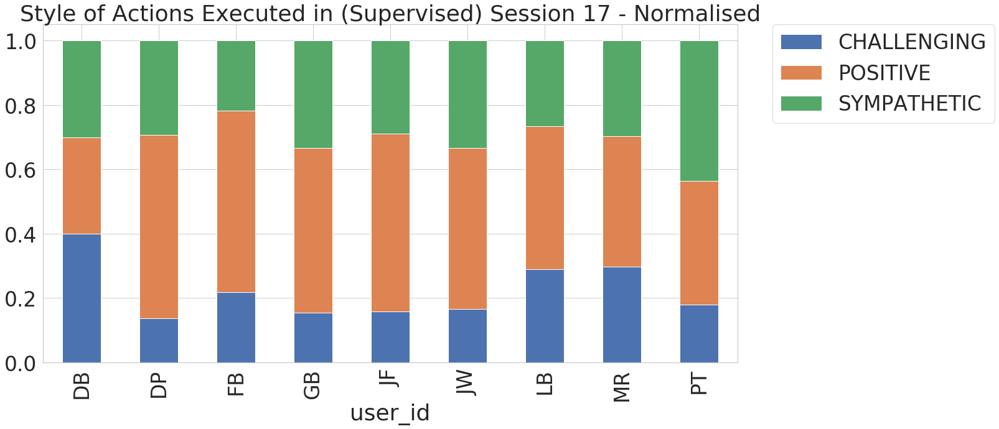

In [458]:
plt = all17_executed_action_log_df.groupby(["user_id"])["style"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Style of Actions Executed in (Supervised) Session 17 - Normalised")

Text(0.5, 1.0, 'Action Types Executed in (Supervised) Session 17')

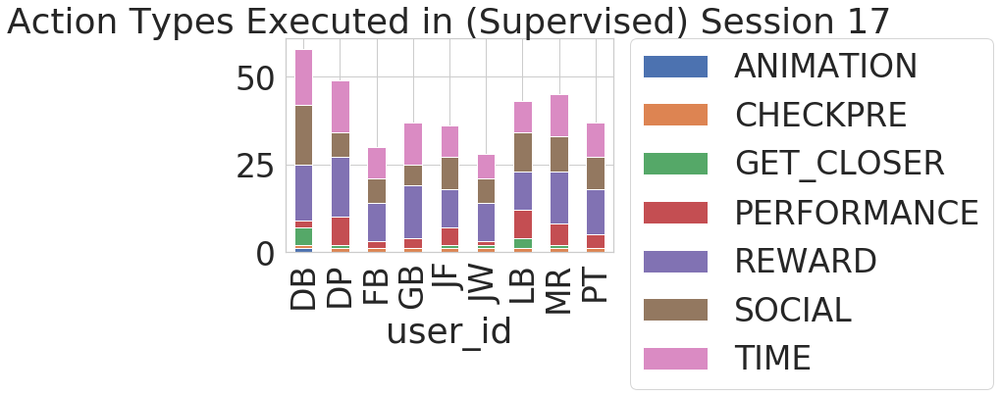

In [14]:
# variation in (social supporting) actions (drop walk/run first)
# not sure if best to plot per participant (as above, and first two plots or instead show how each participant's
# cumulative count of each action/style type added to the whole..? maybe ask for advice)
# second way allows showing of action + style spread on single graph

indexNames = all17_executed_action_log_df[all17_executed_action_log_df['action'] == 'RUN'].index
all17_executed_action_log_df.drop(indexNames , inplace=True)

indexNames = all17_executed_action_log_df[all17_executed_action_log_df['action'] == 'WALK'].index
all17_executed_action_log_df.drop(indexNames , inplace=True)

plt = all17_executed_action_log_df.groupby(["user_id"])["action_type"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Action Types Executed in (Supervised) Session 17")

Text(0.5, 1.0, 'Action Types Executed in (Supervised) Session 17 - Normalised')

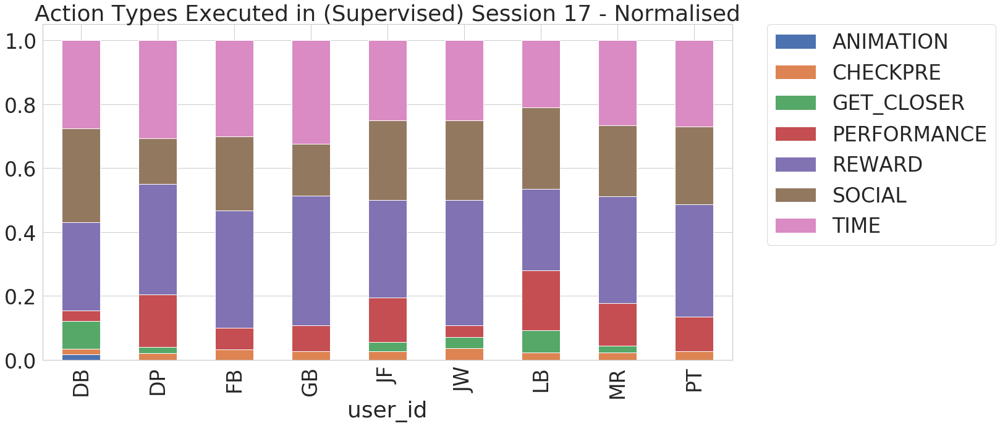

In [460]:
plt = all17_executed_action_log_df.groupby(["user_id"])["action_type"].value_counts(normalize=True).unstack().plot.bar(stacked=True)# , color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Action Types Executed in (Supervised) Session 17 - Normalised")

Text(0.5, 1.0, 'Total Actions Executed Across All C25K Session-17 Sessions')

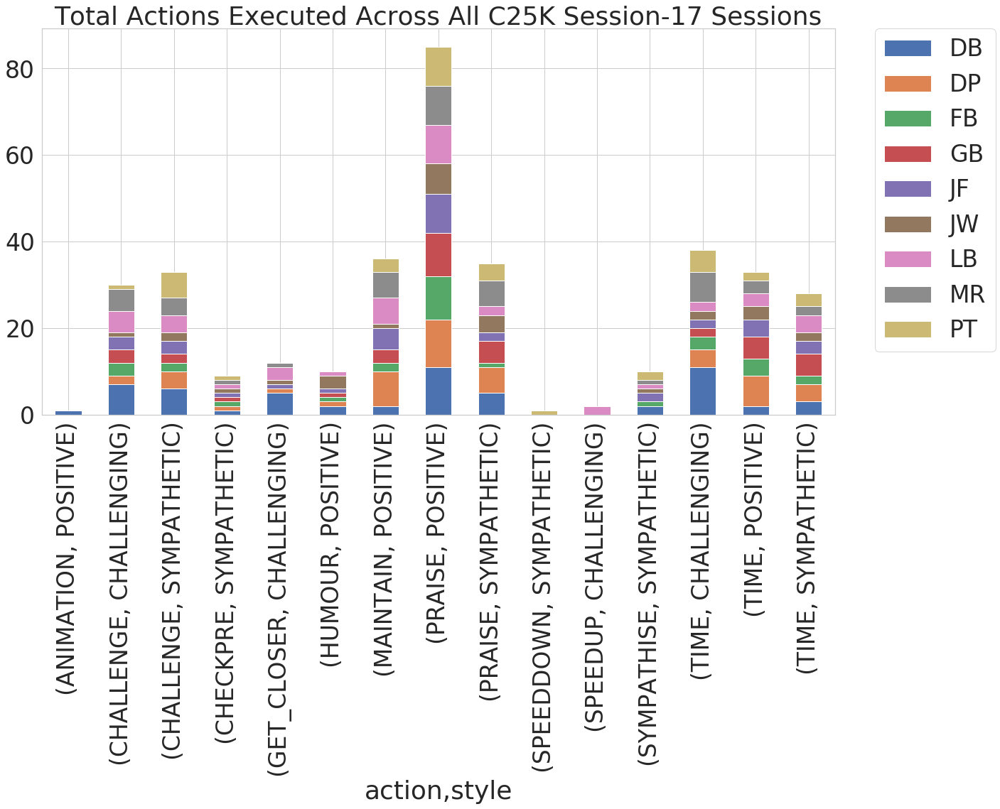

In [128]:
plt = all17_executed_action_log_df.groupby(["action","style"])["user_id"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed Across All C25K Session-17 Sessions")

Text(0.5, 1.0, 'Total Actions Executed Across All C25K Session-17 Sessions - Normalised')

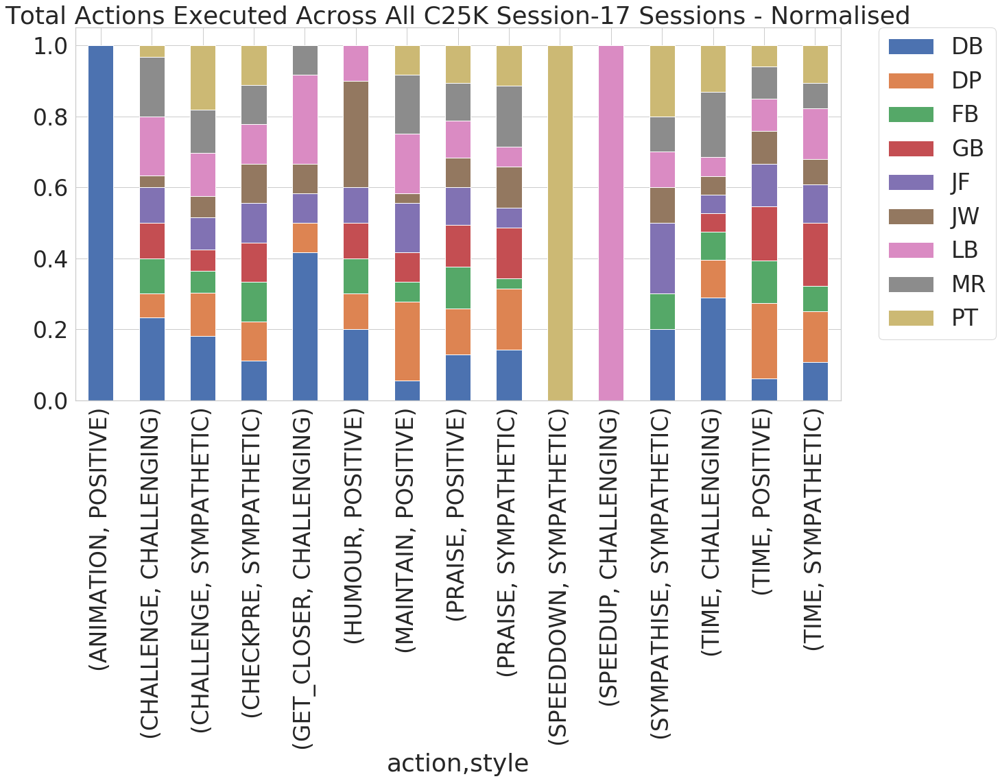

In [129]:
#if all participants were the same then would expect each to provide 1/9 of each bar...

plt = all17_executed_action_log_df.groupby(["action","style"])["user_id"].value_counts(normalize=True).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed Across All C25K Session-17 Sessions - Normalised")

In [16]:
indexNames = all17_executed_action_log_df[all17_executed_action_log_df['action'] == 'RUN'].index
all17_executed_action_log_df.drop(indexNames , inplace=True)

indexNames = all17_executed_action_log_df[all17_executed_action_log_df['action'] == 'WALK'].index
all17_executed_action_log_df.drop(indexNames , inplace=True)

all17_executed_action_log_df.groupby(["action","style"])["user_id"].value_counts(normalize=False)


action     style        user_id
ANIMATION  POSITIVE     DB         1
CHALLENGE  CHALLENGING  DB         7
                        LB         5
                        MR         5
                        FB         3
                                  ..
TIME       SYMPATHETIC  JF         3
                        PT         3
                        FB         2
                        JW         2
                        MR         2
Name: user_id, Length: 104, dtype: int64

In [17]:
# cumulative sum of action type/styles in a session to show timing differences
# comparing LB to MR as a pair that instructor highlighted as needing different approaches
# not sure this one really tells the story/is worth including - maybe try acion type?

LB_17 = all17_executed_action_log_df[(all17_executed_action_log_df['user_id']=='LB')].copy()

positive_count = 0
challenging_count = 0
sympathetic_count = 0

for index, row in  LB_17.iterrows():
    if LB_17.loc[index,'style'] == "POSITIVE":
        positive_count += 1
        LB_17.loc[index,'positive_count'] = positive_count
        LB_17.loc[index,'challenging_count'] = challenging_count
        LB_17.loc[index,'sympathetic_count'] = sympathetic_count
    elif LB_17.loc[index,'style'] == "CHALLENGING":
        challenging_count += 1
        LB_17.loc[index,'positive_count'] = positive_count
        LB_17.loc[index,'challenging_count'] = challenging_count
        LB_17.loc[index,'sympathetic_count'] = sympathetic_count
    elif LB_17.loc[index,'style'] == "SYMPATHETIC":
        sympathetic_count += 1
        LB_17.loc[index,'positive_count'] = positive_count
        LB_17.loc[index,'challenging_count'] = challenging_count
        LB_17.loc[index,'sympathetic_count'] = sympathetic_count
        
LB_17.reset_index(drop=True,inplace=True)

#extend lists to match length of MR
positive_list_LB = LB_17['positive_count'].tolist()
positive_list_LB.append(positive_list_LB[44])
positive_list_LB.append(positive_list_LB[44])
challenging_list_LB = LB_17['challenging_count'].tolist()
challenging_list_LB.append(challenging_list_LB[44])
challenging_list_LB.append(challenging_list_LB[44])
sympathetic_list_LB = LB_17['sympathetic_count'].tolist()
sympathetic_list_LB.append(sympathetic_list_LB[44])
sympathetic_list_LB.append(sympathetic_list_LB[44])

MR_17 = all17_executed_action_log_df[(all17_executed_action_log_df['user_id']=='MR')].copy()

positive_count = 0
challenging_count = 0
sympathetic_count = 0

for index, row in  MR_17.iterrows():
    if MR_17.loc[index,'style'] == "POSITIVE":
        positive_count += 1
        MR_17.loc[index,'positive_count'] = positive_count
        MR_17.loc[index,'challenging_count'] = challenging_count
        MR_17.loc[index,'sympathetic_count'] = sympathetic_count
    elif MR_17.loc[index,'style'] == "CHALLENGING":
        challenging_count += 1
        MR_17.loc[index,'positive_count'] = positive_count
        MR_17.loc[index,'challenging_count'] = challenging_count
        MR_17.loc[index,'sympathetic_count'] = sympathetic_count
    elif MR_17.loc[index,'style'] == "SYMPATHETIC":
        sympathetic_count += 1
        MR_17.loc[index,'positive_count'] = positive_count
        MR_17.loc[index,'challenging_count'] = challenging_count
        MR_17.loc[index,'sympathetic_count'] = sympathetic_count
        
MR_17.reset_index(drop=True,inplace=True)

positive_list_MR = MR_17['positive_count'].tolist()
challenging_list_MR = MR_17['challenging_count'].tolist()
sympathetic_list_MR = MR_17['sympathetic_count'].tolist()

#positive_list_LB

plotting_df = pd.DataFrame({
        'LB Positive Actions' : positive_list_LB,
        'LB Challenging Actions' : challenging_list_LB,
        'LB Sympathetic Actions' : sympathetic_list_LB,
        'MR Positive Actions' : positive_list_MR,
        'MR Challenging Actions' : challenging_list_MR,
        'MR Sympathetic Actions' : sympathetic_list_MR
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Action Styles: LB vs MR Session 17")        


IndexError: list index out of range

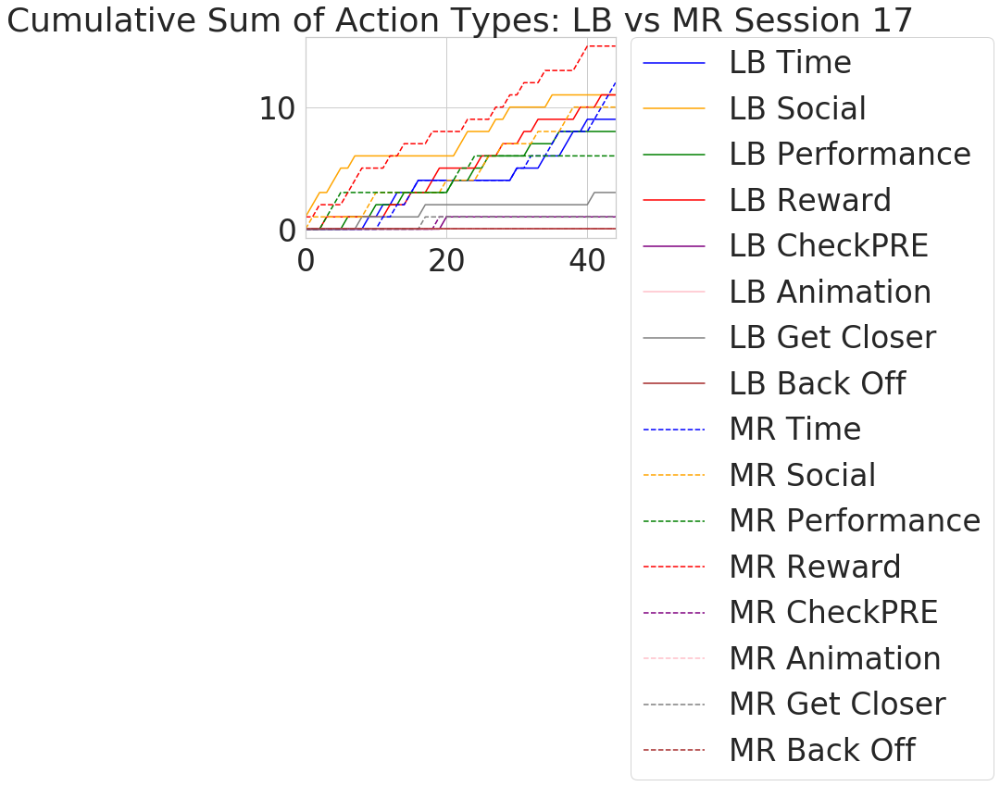

In [18]:
LB_17 = all17_executed_action_log_df[(all17_executed_action_log_df['user_id']=='LB') & (all17_executed_action_log_df['action_type']!='RUN') & (all17_executed_action_log_df['action_type']!='WALK')].copy()

LB_17['action_type']

time_count = 0
social_count = 0
performance_count = 0
reward_count = 0
checkpre_count = 0
animation_count = 0
getcloser_count = 0
backoff_count = 0

for index, row in  LB_17.iterrows():
    if LB_17.loc[index,'action_type'] == "TIME":
        time_count += 1
        LB_17.loc[index,'time_count'] = time_count
        LB_17.loc[index,'social_count'] = social_count
        LB_17.loc[index,'performance_count'] = performance_count
        LB_17.loc[index,'reward_count'] = reward_count
        LB_17.loc[index,'checkpre_count'] = checkpre_count
        LB_17.loc[index,'animation_count'] = animation_count
        LB_17.loc[index,'getcloser_count'] = getcloser_count
        LB_17.loc[index,'backoff_count'] = backoff_count
    elif LB_17.loc[index,'action_type'] == "SOCIAL":
        social_count += 1
        LB_17.loc[index,'time_count'] = time_count
        LB_17.loc[index,'social_count'] = social_count
        LB_17.loc[index,'performance_count'] = performance_count
        LB_17.loc[index,'reward_count'] = reward_count
        LB_17.loc[index,'checkpre_count'] = checkpre_count
        LB_17.loc[index,'animation_count'] = animation_count
        LB_17.loc[index,'getcloser_count'] = getcloser_count
        LB_17.loc[index,'backoff_count'] = backoff_count
    elif LB_17.loc[index,'action_type'] == "PERFORMANCE":
        performance_count += 1
        LB_17.loc[index,'time_count'] = time_count
        LB_17.loc[index,'social_count'] = social_count
        LB_17.loc[index,'performance_count'] = performance_count
        LB_17.loc[index,'reward_count'] = reward_count
        LB_17.loc[index,'checkpre_count'] = checkpre_count
        LB_17.loc[index,'animation_count'] = animation_count
        LB_17.loc[index,'getcloser_count'] = getcloser_count
        LB_17.loc[index,'backoff_count'] = backoff_count
    elif LB_17.loc[index,'action_type'] == "REWARD":
        reward_count += 1
        LB_17.loc[index,'time_count'] = time_count
        LB_17.loc[index,'social_count'] = social_count
        LB_17.loc[index,'performance_count'] = performance_count
        LB_17.loc[index,'reward_count'] = reward_count
        LB_17.loc[index,'checkpre_count'] = checkpre_count
        LB_17.loc[index,'animation_count'] = animation_count
        LB_17.loc[index,'getcloser_count'] = getcloser_count
        LB_17.loc[index,'backoff_count'] = backoff_count
    elif LB_17.loc[index,'action_type'] == "CHECKPRE":
        checkpre_count += 1
        LB_17.loc[index,'time_count'] = time_count
        LB_17.loc[index,'social_count'] = social_count
        LB_17.loc[index,'performance_count'] = performance_count
        LB_17.loc[index,'reward_count'] = reward_count
        LB_17.loc[index,'checkpre_count'] = checkpre_count
        LB_17.loc[index,'animation_count'] = animation_count
        LB_17.loc[index,'getcloser_count'] = getcloser_count
        LB_17.loc[index,'backoff_count'] = backoff_count        
    elif LB_17.loc[index,'action_type'] == "ANIMATION":
        animation_count += 1
        LB_17.loc[index,'time_count'] = time_count
        LB_17.loc[index,'social_count'] = social_count
        LB_17.loc[index,'performance_count'] = performance_count
        LB_17.loc[index,'reward_count'] = reward_count
        LB_17.loc[index,'checkpre_count'] = checkpre_count
        LB_17.loc[index,'animation_count'] = animation_count
        LB_17.loc[index,'getcloser_count'] = getcloser_count
        LB_17.loc[index,'backoff_count'] = backoff_count  
    elif LB_17.loc[index,'action_type'] == "GET_CLOSER":
        getcloser_count += 1
        LB_17.loc[index,'time_count'] = time_count
        LB_17.loc[index,'social_count'] = social_count
        LB_17.loc[index,'performance_count'] = performance_count
        LB_17.loc[index,'reward_count'] = reward_count
        LB_17.loc[index,'checkpre_count'] = checkpre_count
        LB_17.loc[index,'animation_count'] = animation_count
        LB_17.loc[index,'getcloser_count'] = getcloser_count
        LB_17.loc[index,'backoff_count'] = backoff_count
    elif LB_17.loc[index,'action_type'] == "BACK_OFF":
        backoff_count += 1
        LB_17.loc[index,'time_count'] = time_count
        LB_17.loc[index,'social_count'] = social_count
        LB_17.loc[index,'performance_count'] = performance_count
        LB_17.loc[index,'reward_count'] = reward_count
        LB_17.loc[index,'checkpre_count'] = checkpre_count
        LB_17.loc[index,'animation_count'] = animation_count
        LB_17.loc[index,'getcloser_count'] = getcloser_count
        LB_17.loc[index,'backoff_count'] = backoff_count          
        
LB_17.reset_index(drop=True,inplace=True)

time_list_LB = LB_17['time_count'].tolist()
time_list_LB.append(time_list_LB[42])
time_list_LB.append(time_list_LB[42])
social_list_LB = LB_17['social_count'].tolist()
social_list_LB.append(social_list_LB[42])
social_list_LB.append(social_list_LB[42])
performance_list_LB = LB_17['performance_count'].tolist()
performance_list_LB.append(performance_list_LB[42])
performance_list_LB.append(performance_list_LB[42])
reward_list_LB = LB_17['reward_count'].tolist()
reward_list_LB.append(reward_list_LB[42])
reward_list_LB.append(reward_list_LB[42])
checkpre_list_LB = LB_17['checkpre_count'].tolist()
checkpre_list_LB.append(checkpre_list_LB[42])
checkpre_list_LB.append(checkpre_list_LB[42])
animation_list_LB = LB_17['animation_count'].tolist()
animation_list_LB.append(animation_list_LB[42])
animation_list_LB.append(animation_list_LB[42])
getcloser_list_LB = LB_17['getcloser_count'].tolist()
getcloser_list_LB.append(getcloser_list_LB[42])
getcloser_list_LB.append(getcloser_list_LB[42])
backoff_list_LB = LB_17['backoff_count'].tolist()
backoff_list_LB.append(backoff_list_LB[42])
backoff_list_LB.append(backoff_list_LB[42])

MR_17 = all17_executed_action_log_df[(all17_executed_action_log_df['user_id']=='MR')& (all17_executed_action_log_df['action_type']!='RUN') & (all17_executed_action_log_df['action_type']!='WALK')].copy()

time_count = 0
social_count = 0
performance_count = 0
reward_count = 0
checkpre_count = 0
animation_count = 0
getcloser_count = 0
backoff_count = 0

for index, row in  MR_17.iterrows():
    if MR_17.loc[index,'action_type'] == "TIME":
        time_count += 1
        MR_17.loc[index,'time_count'] = time_count
        MR_17.loc[index,'social_count'] = social_count
        MR_17.loc[index,'performance_count'] = performance_count
        MR_17.loc[index,'reward_count'] = reward_count
        MR_17.loc[index,'checkpre_count'] = checkpre_count
        MR_17.loc[index,'animation_count'] = animation_count
        MR_17.loc[index,'getcloser_count'] = getcloser_count
        MR_17.loc[index,'backoff_count'] = backoff_count
    elif MR_17.loc[index,'action_type'] == "SOCIAL":
        social_count += 1
        MR_17.loc[index,'time_count'] = time_count
        MR_17.loc[index,'social_count'] = social_count
        MR_17.loc[index,'performance_count'] = performance_count
        MR_17.loc[index,'reward_count'] = reward_count
        MR_17.loc[index,'checkpre_count'] = checkpre_count
        MR_17.loc[index,'animation_count'] = animation_count
        MR_17.loc[index,'getcloser_count'] = getcloser_count
        MR_17.loc[index,'backoff_count'] = backoff_count
    elif MR_17.loc[index,'action_type'] == "PERFORMANCE":
        performance_count += 1
        MR_17.loc[index,'time_count'] = time_count
        MR_17.loc[index,'social_count'] = social_count
        MR_17.loc[index,'performance_count'] = performance_count
        MR_17.loc[index,'reward_count'] = reward_count
        MR_17.loc[index,'checkpre_count'] = checkpre_count
        MR_17.loc[index,'animation_count'] = animation_count
        MR_17.loc[index,'getcloser_count'] = getcloser_count
        MR_17.loc[index,'backoff_count'] = backoff_count
    elif MR_17.loc[index,'action_type'] == "REWARD":
        reward_count += 1
        MR_17.loc[index,'time_count'] = time_count
        MR_17.loc[index,'social_count'] = social_count
        MR_17.loc[index,'performance_count'] = performance_count
        MR_17.loc[index,'reward_count'] = reward_count
        MR_17.loc[index,'checkpre_count'] = checkpre_count
        MR_17.loc[index,'animation_count'] = animation_count
        MR_17.loc[index,'getcloser_count'] = getcloser_count
        MR_17.loc[index,'backoff_count'] = backoff_count
    elif MR_17.loc[index,'action_type'] == "CHECKPRE":
        checkpre_count += 1
        MR_17.loc[index,'time_count'] = time_count
        MR_17.loc[index,'social_count'] = social_count
        MR_17.loc[index,'performance_count'] = performance_count
        MR_17.loc[index,'reward_count'] = reward_count
        MR_17.loc[index,'checkpre_count'] = checkpre_count
        MR_17.loc[index,'animation_count'] = animation_count
        MR_17.loc[index,'getcloser_count'] = getcloser_count
        MR_17.loc[index,'backoff_count'] = backoff_count        
    elif MR_17.loc[index,'action_type'] == "ANIMATION":
        animation_count += 1
        MR_17.loc[index,'time_count'] = time_count
        MR_17.loc[index,'social_count'] = social_count
        MR_17.loc[index,'performance_count'] = performance_count
        MR_17.loc[index,'reward_count'] = reward_count
        MR_17.loc[index,'checkpre_count'] = checkpre_count
        MR_17.loc[index,'animation_count'] = animation_count
        MR_17.loc[index,'getcloser_count'] = getcloser_count
        MR_17.loc[index,'backoff_count'] = backoff_count  
    elif MR_17.loc[index,'action_type'] == "GET_CLOSER":
        getcloser_count += 1
        MR_17.loc[index,'time_count'] = time_count
        MR_17.loc[index,'social_count'] = social_count
        MR_17.loc[index,'performance_count'] = performance_count
        MR_17.loc[index,'reward_count'] = reward_count
        MR_17.loc[index,'checkpre_count'] = checkpre_count
        MR_17.loc[index,'animation_count'] = animation_count
        MR_17.loc[index,'getcloser_count'] = getcloser_count
        MR_17.loc[index,'backoff_count'] = backoff_count
    elif MR_17.loc[index,'action_type'] == "BACK_OFF":
        backoff_count += 1
        MR_17.loc[index,'time_count'] = time_count
        MR_17.loc[index,'social_count'] = social_count
        MR_17.loc[index,'performance_count'] = performance_count
        MR_17.loc[index,'reward_count'] = reward_count
        MR_17.loc[index,'checkpre_count'] = checkpre_count
        MR_17.loc[index,'animation_count'] = animation_count
        MR_17.loc[index,'getcloser_count'] = getcloser_count
        MR_17.loc[index,'backoff_count'] = backoff_count          
        
MR_17.reset_index(drop=True,inplace=True)

time_list_MR = MR_17['time_count'].tolist()
social_list_MR = MR_17['social_count'].tolist()
performance_list_MR = MR_17['performance_count'].tolist()
reward_list_MR = MR_17['reward_count'].tolist()
checkpre_list_MR = MR_17['checkpre_count'].tolist()
animation_list_MR = MR_17['animation_count'].tolist()
getcloser_list_MR = MR_17['getcloser_count'].tolist()
backoff_list_MR = MR_17['backoff_count'].tolist()

plotting_df = pd.DataFrame({
        'LB Time' : time_list_LB,
        'LB Social' : social_list_LB,
        'LB Performance' : performance_list_LB,
        'LB Reward' : reward_list_LB,
        'LB CheckPRE' : checkpre_list_LB,
        'LB Animation' : animation_list_LB,
        'LB Get Closer' : getcloser_list_LB,
        'LB Back Off' : backoff_list_LB,
        'MR Time' : time_list_MR,
        'MR Social' : social_list_MR,
        'MR Performance' : performance_list_MR,
        'MR Reward' : reward_list_MR,
        'MR CheckPRE' : checkpre_list_MR,
        'MR Animation' : animation_list_MR,
        'MR Get Closer' : getcloser_list_MR,
        'MR Back Off' : backoff_list_MR
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Action Types: LB vs MR Session 17", color=["blue","orange","green","red","purple","pink","grey","brown","blue","orange","green","red","purple","pink","grey","brown"], style=["-","-","-","-","-","-","-","-","--","--","--","--","--","--","--","--"])     
l=lines.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

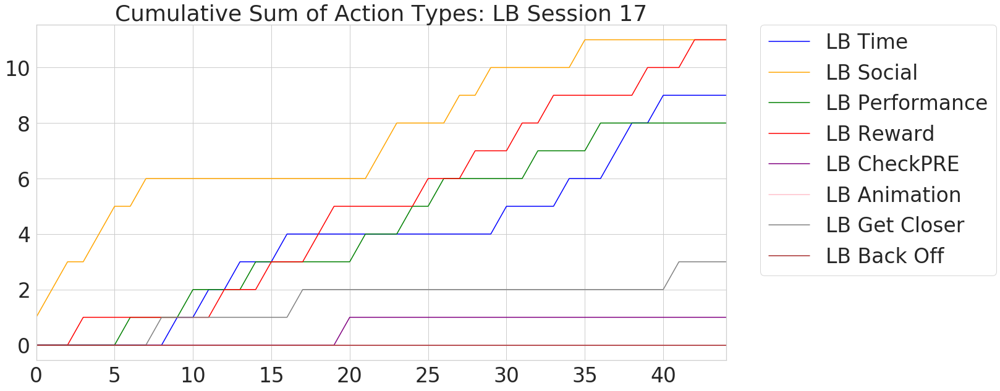

In [21]:
plotting_df = pd.DataFrame({
        'LB Time' : time_list_LB,
        'LB Social' : social_list_LB,
        'LB Performance' : performance_list_LB,
        'LB Reward' : reward_list_LB,
        'LB CheckPRE' : checkpre_list_LB,
        'LB Animation' : animation_list_LB,
        'LB Get Closer' : getcloser_list_LB,
        'LB Back Off' : backoff_list_LB,
#         'MR Time' : time_list_MR,
#         'MR Social' : social_list_MR,
#         'MR Performance' : performance_list_MR,
#         'MR Reward' : reward_list_MR,
#         'MR CheckPRE' : checkpre_list_MR,
#         'MR Animation' : animation_list_MR,
#         'MR Get Closer' : getcloser_list_MR,
#         'MR Back Off' : backoff_list_MR
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Action Types: LB Session 17", color=["blue","orange","green","red","purple","pink","grey","brown","blue","orange","green","red","purple","pink","grey","brown"], style=["-","-","-","-","-","-","-","-"]) #,"--","--","--","--","--","--","--","--"])     
l=lines.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

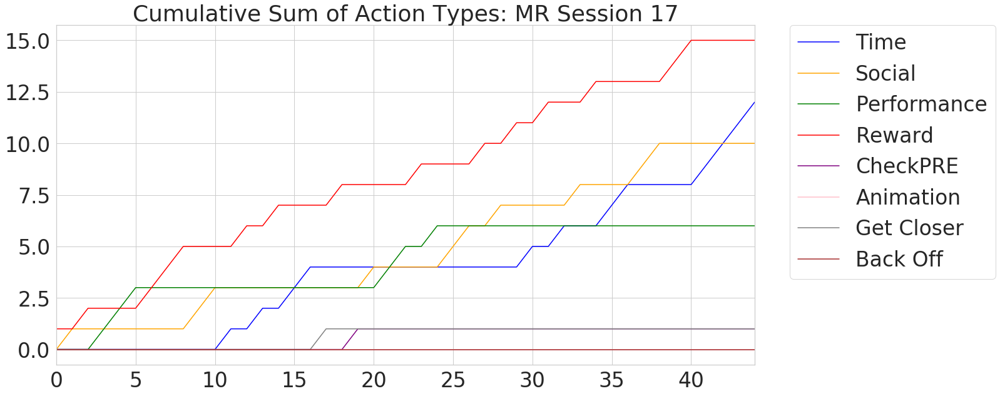

In [22]:
plotting_df = pd.DataFrame({
#         'LB Time' : time_list_LB,
#         'LB Social' : social_list_LB,
#         'LB Performance' : performance_list_LB,
#         'LB Reward' : reward_list_LB,
#         'LB CheckPRE' : checkpre_list_LB,
#         'LB Animation' : animation_list_LB,
#         'LB Get Closer' : getcloser_list_LB,
#         'LB Back Off' : backoff_list_LB,
        'Time' : time_list_MR,
        'Social' : social_list_MR,
        'Performance' : performance_list_MR,
        'Reward' : reward_list_MR,
        'CheckPRE' : checkpre_list_MR,
        'Animation' : animation_list_MR,
        'Get Closer' : getcloser_list_MR,
        'Back Off' : backoff_list_MR
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Action Types: MR Session 17", color=["blue","orange","green","red","purple","pink","grey","brown","blue","orange","green","red","purple","pink","grey","brown"], style=["-","-","-","-","-","-","-","-"]) #,"--","--","--","--","--","--","--","--"])     
l=lines.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [472]:
## NEED TO CREATE ACTION COUNTS FOR THE COMPARED IML-S SESSION 17 AND RUN FISHER'S TESTS FOR ALL PARTICIPANT COMPARISONS

#all17_executed_action_log_df.groupby(['user_id','action_type'])['style'].value_counts()

S17_actionstyle_counts = pd.read_csv('s17_actions.csv', skiprows = 1, names=['user_id','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','run-challenging','run-positive'])
S17_actionstyle_counts.set_index("user_id", inplace=True)

# User LB

m = np.array([S17_actionstyle_counts.loc['LB'].tolist(),S17_actionstyle_counts.loc['FB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['LB'].tolist(),S17_actionstyle_counts.loc['DB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['LB'].tolist(),S17_actionstyle_counts.loc['JF'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['LB'].tolist(),S17_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['LB'].tolist(),S17_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['LB'].tolist(),S17_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['LB'].tolist(),S17_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['LB'].tolist(),S17_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.9185255567552125
p-value: 0.37148298800137447
p-value: 0.9961578061706677
p-value: 0.7595491870961175
p-value: 0.8281296433365656
p-value: 0.7562384667271458
p-value: 0.7757631769251537
p-value: 0.4750555414112065


In [473]:
# User FB

m = np.array([S17_actionstyle_counts.loc['FB'].tolist(),S17_actionstyle_counts.loc['DB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['FB'].tolist(),S17_actionstyle_counts.loc['JF'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['FB'].tolist(),S17_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['FB'].tolist(),S17_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['FB'].tolist(),S17_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['FB'].tolist(),S17_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['FB'].tolist(),S17_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.4866684839209912
p-value: 0.9952519464762256
p-value: 0.8176070249490687
p-value: 0.826732878844356
p-value: 0.9516215433678556
p-value: 0.9719998186199503
p-value: 0.6932935969837327


In [474]:
# User DB

m = np.array([S17_actionstyle_counts.loc['DB'].tolist(),S17_actionstyle_counts.loc['JF'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['DB'].tolist(),S17_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['DB'].tolist(),S17_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['DB'].tolist(),S17_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['DB'].tolist(),S17_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['DB'].tolist(),S17_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.3606332444417518
p-value: 0.7638977928688356
p-value: 0.10360981611302776
p-value: 0.5650063104122476
p-value: 0.1285598465896484
p-value: 0.47388259385549714


In [475]:
# User JF

m = np.array([S17_actionstyle_counts.loc['JF'].tolist(),S17_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['JF'].tolist(),S17_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['JF'].tolist(),S17_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['JF'].tolist(),S17_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['JF'].tolist(),S17_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.9019167841273115
p-value: 0.9955564373704758
p-value: 0.9142234499395696
p-value: 0.9629264893080658
p-value: 0.779299845406759


In [476]:
# User MR

m = np.array([S17_actionstyle_counts.loc['MR'].tolist(),S17_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['MR'].tolist(),S17_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['MR'].tolist(),S17_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['MR'].tolist(),S17_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.8886725432628904
p-value: 0.5957216902574969
p-value: 0.7371718924864845
p-value: 0.8726782422441022


In [477]:
# User DP 

m = np.array([S17_actionstyle_counts.loc['DP'].tolist(),S17_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['DP'].tolist(),S17_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['DP'].tolist(),S17_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.8581872891285833
p-value: 0.9635821689304077
p-value: 0.49396648621107825


In [478]:
# User JW

m = np.array([S17_actionstyle_counts.loc['JW'].tolist(),S17_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([S17_actionstyle_counts.loc['JW'].tolist(),S17_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.9622602979024651
p-value: 0.7068924663668905


In [479]:
# User GB

m = np.array([S17_actionstyle_counts.loc['GB'].tolist(),S17_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.475999601144512


In [ ]:
# just out of interest, if extend supervised personalisation comparison
# to include more/all supervised sessions, would we get positive proof
# of personalisation then...?
# see below for this analysis of the spvd sessions compared to the auto ones

## Workload

In [322]:
training_action_log_df['accepted_count'] = 0
training_action_log_df['refused_count'] = 0
training_action_log_df['unprompted_count'] = 0

accepted_count = 0
refused_count = 0
unprompted_count = 0

for index, row in  training_action_log_df.iterrows():
    if training_action_log_df.loc[index,'validation'] == "PASSIVE_ACCEPTED" or training_action_log_df.loc[index,'validation'] == "VALIDATED":
        accepted_count += 1
        training_action_log_df.loc[index,'accepted_count'] = accepted_count
        training_action_log_df.loc[index,'refused_count'] = refused_count
        training_action_log_df.loc[index,'unprompted_count'] = unprompted_count
    elif training_action_log_df.loc[index,'validation'] == "UNPROMPTED":
        unprompted_count += 1
        training_action_log_df.loc[index,'accepted_count'] = accepted_count
        training_action_log_df.loc[index,'refused_count'] = refused_count
        training_action_log_df.loc[index,'unprompted_count'] = unprompted_count
    elif training_action_log_df.loc[index,'validation'] == "REFUSED":
        refused_count += 1
        training_action_log_df.loc[index,'accepted_count'] = accepted_count
        training_action_log_df.loc[index,'refused_count'] = refused_count
        training_action_log_df.loc[index,'unprompted_count'] = unprompted_count        

training_action_log_df

,user_id,session_number,action_id,validation_timestamp,validation_state_id,action,style,duration,validation,trigger_timestamp,trigger_state_id,accepted_count,refused_count,unprompted_count
29,FB,1,f3d53b0f-e3cd-45b3-bd99-defcb8048f99,1.560772e+09,a85601e6-f0e0-40b8-8de7-9a61f55d83cd,CHALLENGE,CHALLENGING,0,UNPROMPTED,1.560772e+09,a85601e6-f0e0-40b8-8de7-9a61f55d83cd,0,0,1
67,JW,1,5d1d67e4-e472-4fa2-a2f7-bfe1b6c9e79b,1.560784e+09,6c8ca1fa-d926-4b20-bd7f-b7049a678f6d,CHALLENGE,CHALLENGING,0,UNPROMPTED,1.560784e+09,6c8ca1fa-d926-4b20-bd7f-b7049a678f6d,0,0,2
100,GB,1,90c4ebf1-46d5-4172-bdac-6737f14a7064,1.560787e+09,0f4d82d3-c52f-4824-bb4d-bcaa56dc36a6,CHALLENGE,CHALLENGING,0,UNPROMPTED,1.560787e+09,0f4d82d3-c52f-4824-bb4d-bcaa56dc36a6,0,0,3
157,FB,2,bf661c21-d150-4970-953d-19609d6010ff,1.560859e+09,bebd6c12-5ba8-4c55-8bd2-b782ff559010,HUMOUR,POSITIVE,0,UNPROMPTED,1.560859e+09,bebd6c12-5ba8-4c55-8bd2-b782ff559010,0,0,4
270,DP,1,8c72fa38-b080-4b2e-afc2-e48b2a95348c,1.560864e+09,74af61fb-1f95-4803-a70b-6341e20fede7,HUMOUR,POSITIVE,0,UNPROMPTED,1.560864e+09,74af61fb-1f95-4803-a70b-6341e20fede7,0,0,5
410,LB,2,dc5657f6-7ea4-4d9c-ac67-1dd1108722e7,1.560939e+09,34f806a6-5e3e-483b-81e8-d21224ddf75d,HUMOUR,POSITIVE,0,UNPROMPTED,1.560939e+09,34f806a6-5e3e-483b-81e8-d21224ddf75d,0,0,6
528,DP,2,d664c427-aa7d-4142-b99a-1371223cfe26,1.560943e+09,598f24d6-08eb-4a35-9cd7-0ee89d21725b,HUMOUR,POSITIVE,0,UNPROMPTED,1.560943e+09,598f24d6-08eb-4a35-9cd7-0ee89d21725b,0,0,7
599,JF,1,6251ac13-eb4d-4519-a3ad-538b6c6fac49,1.560948e+09,82ed25a8-226f-410e-bb21-4498414f5598,MAINTAIN,POSITIVE,0,UNPROMPTED,1.560948e+09,82ed25a8-226f-410e-bb21-4498414f5598,0,0,8
723,JW,2,07e6ec63-e23c-4f40-934d-b21cc56ea604,1.560957e+09,d9483f2a-dc19-4522-8b66-22c9889c311f,HUMOUR,POSITIVE,0,UNPROMPTED,1.560957e+09,d9483f2a-dc19-4522-8b66-22c9889c311f,0,0,9
799,GB,2,e0d2a4b2-43b9-485b-877e-66f979e1ba3a,1.560959e+09,d63e1306-7053-44ce-829b-98032088606f,CHALLENGE,CHALLENGING,0,UNPROMPTED,1.560959e+09,d63e1306-7053-44ce-829b-98032088606f,0,0,10


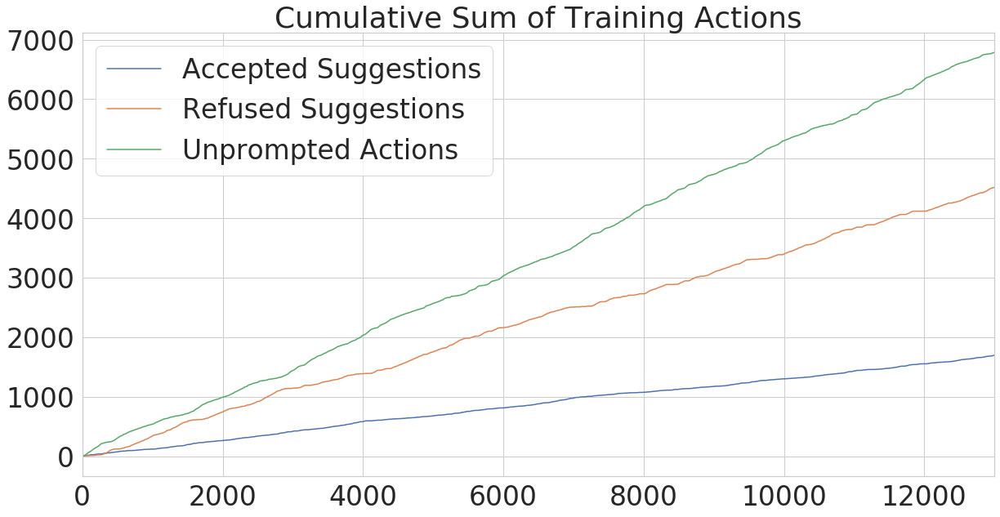

In [191]:
# show any change in rate of acceptance, refusal and unprompted generation of actions
# collection of action examples (by validation type) with time
training_action_log_df.reset_index(drop=True,inplace=True)

accepted_list = training_action_log_df['accepted_count'].tolist()
refused_list = training_action_log_df['refused_count'].tolist()
unprompted_list = training_action_log_df['unprompted_count'].tolist()

plotting_df = pd.DataFrame({
        'Accepted Suggestions' : accepted_list,
        'Refused Suggestions' : refused_list,
        'Unprompted Actions' : unprompted_list
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Training Actions")

Text(0.5, 1.0, 'Instructor Response to Learner Suggested Task Action Styling')

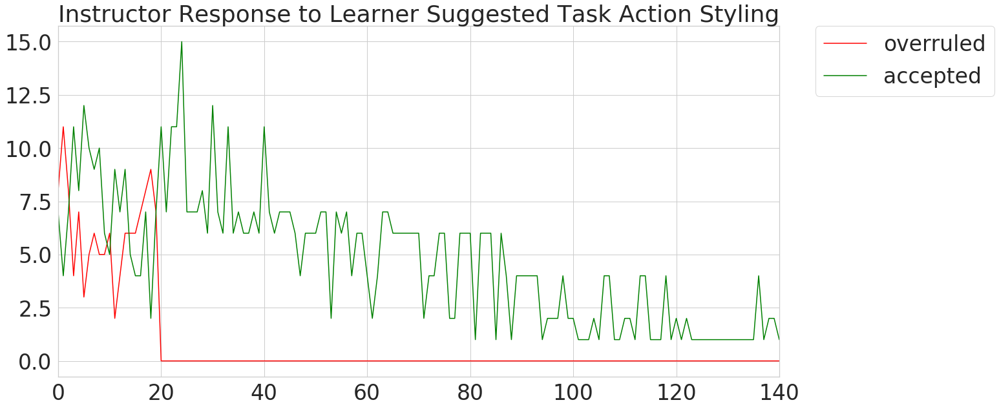

In [340]:
# looking at styles on run/walk *only*
walks = training_action_log_df[training_action_log_df['action'] == 'WALK'].copy()
runs = training_action_log_df[training_action_log_df['action'] == 'RUN'].copy()

prog_actions = pd.concat([walks,runs])
prog_actions.sort_values(by=['validation_timestamp'])

# prog_actions.drop_duplicates(subset=['user_id','session_number'], inplace=True)
# prog_actions.sort_index(inplace=True)
# prog_actions.to_csv('progactions_session_list', index = False)
# prog_actions.groupby(['user_id','session_number'])['validation'].value_counts()

prog_actions_df = pd.read_csv('progactions_session_list.csv', names=['user_id','participant_n','accepted','overruled'])
prog_actions_df['overrules'] = prog_actions_df['overruled'].astype(int)
prog_actions_df['accepted'] = prog_actions_df['accepted'].astype(int)

plt = prog_actions_df.plot.line(y='overruled', color='red', label = 'overruled')
prog_actions_df.plot.line(y='accepted', color='green', label = 'accepted', ax=plt)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Instructor Response to Learner Suggested Task Action Styling")




Text(0.5, 1.0, 'Instructor Response to Learner Suggested Task Action Styling - Normalised')

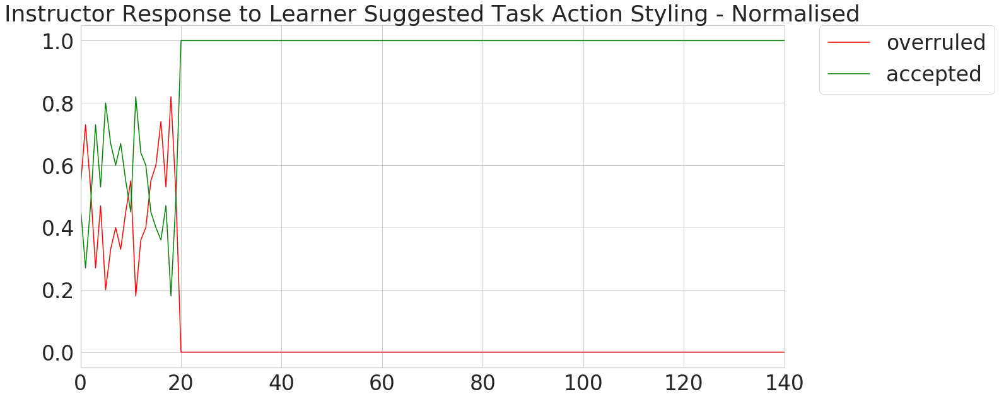

In [341]:
prog_actions_df = pd.read_csv('progactions_session_list_norm.csv', names=['user_id','participant_n','accepted','overruled'])
prog_actions_df['overrules'] = prog_actions_df['overruled'].astype(float)
prog_actions_df['accepted'] = prog_actions_df['accepted'].astype(float)

plt = prog_actions_df.plot.line(y='overruled', color='red', label = 'overruled')
prog_actions_df.plot.line(y='accepted', color='green', label = 'accepted', ax=plt)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Instructor Response to Learner Suggested Task Action Styling - Normalised")

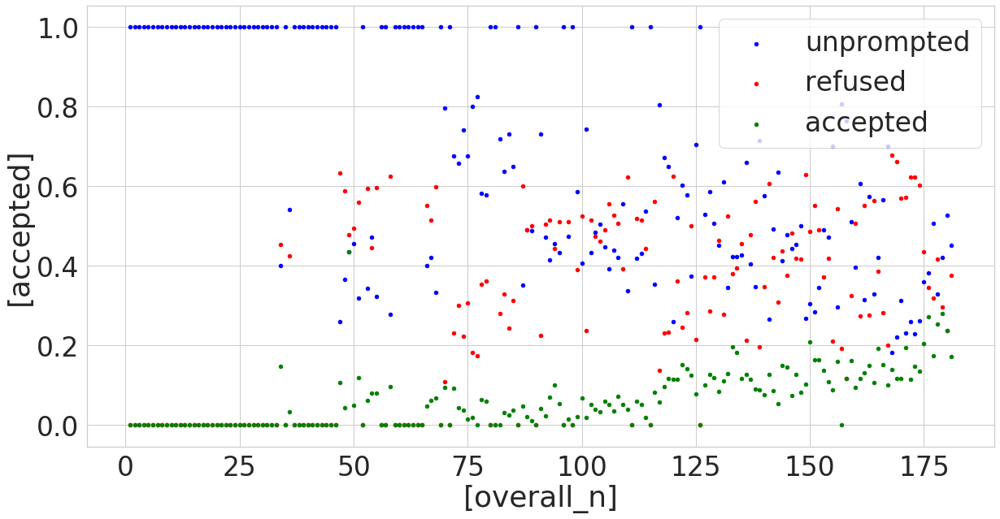

In [344]:
# attempt at a plot of above per successive session as per how Emmanuel presents his result
indexNames = training_action_log_df[training_action_log_df['action'] == 'WALK'].index
training_action_log_df.drop(indexNames , inplace=True)

indexNames = training_action_log_df[training_action_log_df['action'] == 'RUN'].index
training_action_log_df.drop(indexNames , inplace=True)

training_action_log_df['validation']=training_action_log_df['validation'].apply(lambda x: "ACCEPTED" if x == "VALIDATED" else ("ACCEPTED" if x == "PASSIVE_ACCEPTED" else x)) 

# plt = training_action_log_df.groupby(["session_number"])["validation"].value_counts(normalize=True).unstack().plot.line()

# pd.set_option('display.max_rows', None)
training_action_log_df.groupby(["user_id","session_number"])["validation"].value_counts(normalize=True)

learner_prog_df = pd.read_csv('overall_sessions_norm.csv', names=['overall_n','user_id','participant_n','unprompted','refused', 'accepted'])

learner_prog_df['overall_n'] = learner_prog_df['overall_n'].astype(float)
learner_prog_df['unprompted'] = learner_prog_df['unprompted'].astype(float)
learner_prog_df['refused'] = learner_prog_df['refused'].astype(float)
learner_prog_df['accepted'] = learner_prog_df['accepted'].astype(float)

plt = learner_prog_df.plot.scatter(x=['overall_n'], y=['unprompted'], color = "blue", label = 'unprompted')
learner_prog_df.plot.scatter(x=['overall_n'], y=['refused'], color='red', label = 'refused', ax=plt)
learner_prog_df.plot.scatter(x=['overall_n'], y=['accepted'], color='green', label = 'accepted', ax=plt)

Text(0.5, 1.0, 'Unprompted Actions & Response to Learner Suggestions - Normalised')

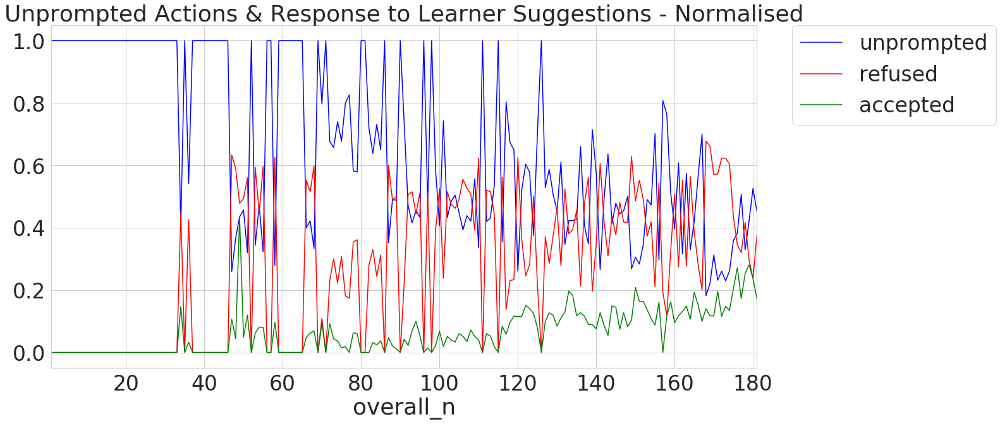

In [347]:
plt = learner_prog_df.plot.line(x='overall_n', y='unprompted', color = "blue", label = 'unprompted')
learner_prog_df.plot.line(x='overall_n', y='refused', color='red', label = 'refused', ax=plt)
learner_prog_df.plot.line(x='overall_n', y='accepted', color='green', label = 'accepted', ax=plt)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Unprompted Actions & Response to Learner Suggestions - Normalised")

# maybe need to create normalised version of this too? (to account for variation in where people where in programme - different session lengths etc)
# raw version is helpful because it gives tangible feel for number of actions

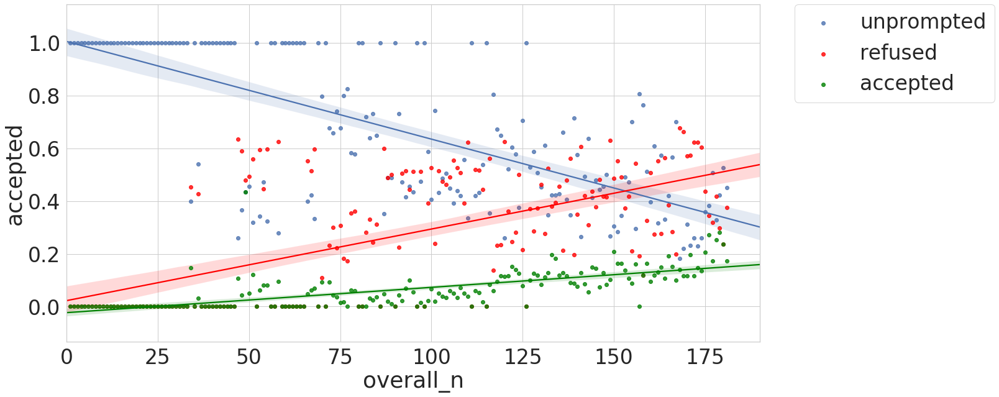

In [346]:
plt = sns.regplot(x='overall_n', y='unprompted', data=learner_prog_df, label='unprompted')
sns.regplot(x='overall_n', y='refused', data=learner_prog_df, label='refused', color='red', ax=plt)
sns.regplot(x='overall_n', y='accepted', data=learner_prog_df, label='accepted', color = 'green', ax=plt)
plt.legend()
plt.set_xlim(0,190)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# maybe need to plt = sns.regplot(x='overall_n', y='unprompted', data=learner_prog_df, label='unprompted')

sns.regplot(x='overall_n', y='refused', data=learner_prog_df, label='refused', color='red', ax=plt)

sns.regplot(x='overall_n', y='accepted', data=learner_prog_df, label='accepted', color = 'green', ax=plt)

plt.legend()

plt.set_xlim(0,190)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Unprompted Actions & Response to Learner Suggestions - Trends")

In [223]:
# acceptance in first vs last (common) supervised session (per participant)
# source of executed action in first vs last supervised session (per participant)
# shows a) increase in acceptance/usability of suggestions that b) was different across participants (or specific sessions)

# first supervised session of Phase 2 df (dropping MB as she has no session 17 to compare to)
LB_first_spvd=action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
FB_first_spvd=action_log_df[(action_log_df['user_id']=='FB') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
DB_first_spvd=action_log_df[(action_log_df['user_id']=='DB') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
JF_first_spvd=action_log_df[(action_log_df['user_id']=='JF') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
MR_first_spvd=action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
DP_first_spvd=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
JW_first_spvd=action_log_df[(action_log_df['user_id']=='JW') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
GB_first_spvd=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
PT_first_spvd=action_log_df[(action_log_df['user_id']=='PT') & (action_log_df['session_number']==9) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()


# last supervised session of Phase 2 df
LB_last_spvd=action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
FB_last_spvd=action_log_df[(action_log_df['user_id']=='FB') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
DB_last_spvd=action_log_df[(action_log_df['user_id']=='DB') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
JF_last_spvd=action_log_df[(action_log_df['user_id']=='JF') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
MR_last_spvd=action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
DP_last_spvd=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
JW_last_spvd=action_log_df[(action_log_df['user_id']=='JW') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
GB_last_spvd=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
PT_last_spvd=action_log_df[(action_log_df['user_id']=='PT') & (action_log_df['session_number']==17) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()

first=pd.concat([LB_first_spvd,FB_first_spvd,DB_first_spvd,JF_first_spvd,MR_first_spvd,DP_first_spvd,JW_first_spvd,GB_first_spvd,MB_first_spvd,PT_first_spvd])
first['validation']=first['validation'].apply(lambda x: "ACCEPTED" if x == "VALIDATED" else ("ACCEPTED" if x == "PASSIVE_ACCEPTED" else x)) 

last=pd.concat([LB_last_spvd,FB_last_spvd,DB_last_spvd,JF_last_spvd,MR_last_spvd,DP_last_spvd,JW_last_spvd,GB_last_spvd,MB_last_spvd,PT_last_spvd])
last['validation']=last['validation'].apply(lambda x: "ACCEPTED" if x == "VALIDATED" else ("ACCEPTED" if x == "PASSIVE_ACCEPTED" else x)) 

Text(0.5, 1.0, 'Overall Instructor Workload: Start vs End of Phase 2 - Normalised')

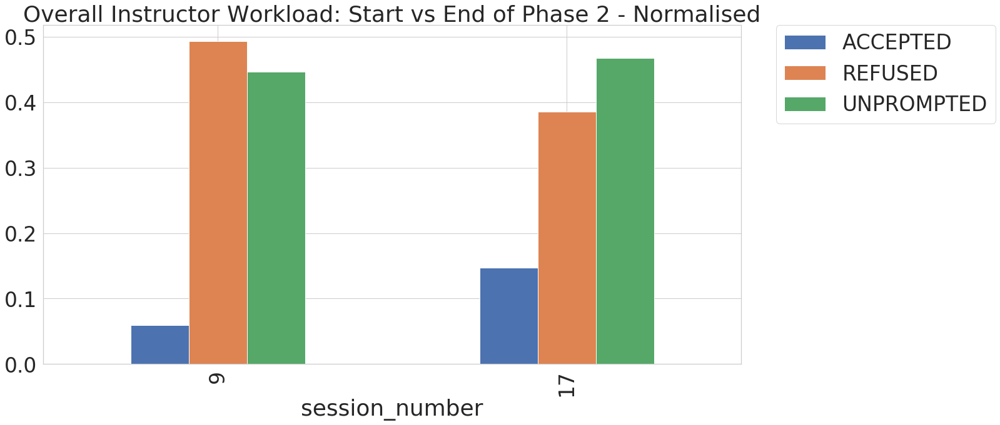

In [225]:
plt = combined.groupby(["session_number"])["validation"].value_counts(normalize=True).unstack().plot.bar(stacked=False) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Overall Instructor Workload: Start vs End of Phase 2 - Normalised")


Text(0.5, 1.0, 'Overall Instructor Workload: Start vs End of Phase 2')

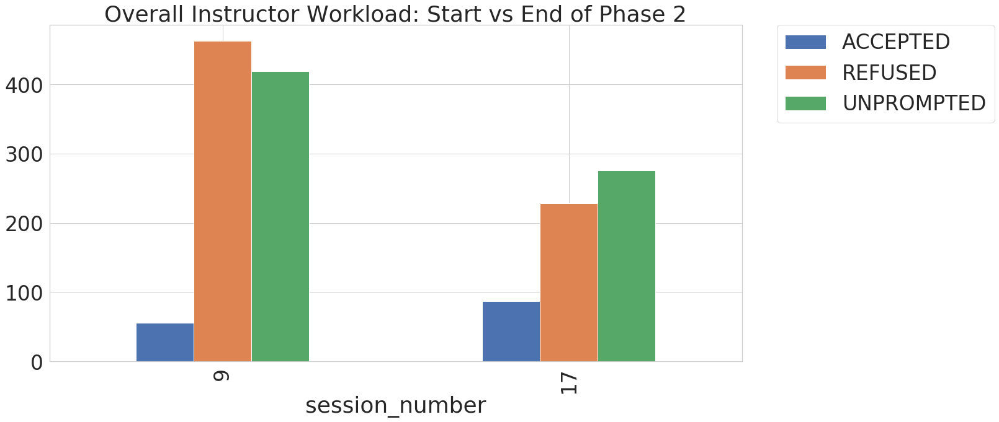

In [224]:
# plot all types to show overall workload/give an idea of amount of unprompteds
# maybe even simply sum (do stacked plot?) to show overall 'workload' i.e. actions needing to be taken/evaluated

combined=pd.concat([first,last])

plt = combined.groupby(["session_number"])["validation"].value_counts(normalize=False).unstack().plot.bar(stacked=False) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Overall Instructor Workload: Start vs End of Phase 2")


In [321]:
# percentages of actions accepted/refused, on average, in session 17 across all participants
last=last[last['validation']!= 'UNPROMPTED'].copy()
last['validation'].value_counts(normalize=True) #this is a bit of hack, probably ought to do mean + std

# percentage of actions coming from the robot, on average, in session 17 across all participants
last=pd.concat([LB_last_spvd,FB_last_spvd,DB_last_spvd,JF_last_spvd,MR_last_spvd,DP_last_spvd,JW_last_spvd,GB_last_spvd,MB_last_spvd,PT_last_spvd])
last['validation']=last['validation'].apply(lambda x: "ACCEPTED" if x == "VALIDATED" else ("ACCEPTED" if x == "PASSIVE_ACCEPTED" else x)) 

last=last[last['validation']!= 'REFUSED'].copy()
last['validation'].value_counts(normalize=True) 

UNPROMPTED    0.760331
ACCEPTED      0.239669
Name: validation, dtype: float64

# Autonomous Robot Behaviour (RQ2)

## Similarity to instructor supervised behaviour

In [23]:
# for purposes of comparing similarity, looking at last two supervised and first two autonomous across all participants

LB_auto_action_log_df=action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']>=23) & (action_log_df['session_number']<=24) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
FB_auto_action_log_df=action_log_df[(action_log_df['user_id']=='FB') & (action_log_df['session_number']>=22) & (action_log_df['session_number']<=23) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DB_auto_action_log_df=action_log_df[(action_log_df['user_id']=='DB') & (action_log_df['session_number']>=19) & (action_log_df['session_number']<=20) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JF_auto_action_log_df=action_log_df[(action_log_df['user_id']=='JF') & (action_log_df['session_number']>=23) & (action_log_df['session_number']<=24) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
MR_auto_action_log_df=action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']>=19) & (action_log_df['session_number']<=20) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DP_auto_action_log_df=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']>=25) & (action_log_df['session_number']<=26) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JW_auto_action_log_df=action_log_df[(action_log_df['user_id']=='JW') & (action_log_df['session_number']>=23) & (action_log_df['session_number']<=24) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
GB_auto_action_log_df=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']>=24) & (action_log_df['session_number']<=25) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
PT_auto_action_log_df=action_log_df[(action_log_df['user_id']=='PT') & (action_log_df['session_number']>=19) & (action_log_df['session_number']<=20) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()

auto_selection=pd.concat([LB_auto_action_log_df,FB_auto_action_log_df,DB_auto_action_log_df,JF_auto_action_log_df,MR_auto_action_log_df,DP_auto_action_log_df,JW_auto_action_log_df,GB_auto_action_log_df,PT_auto_action_log_df])

LB_spvd_action_log_df=action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']>=21) & (action_log_df['session_number']<=22) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
FB_spvd_action_log_df=action_log_df[(action_log_df['user_id']=='FB') & (action_log_df['session_number']>=20) & (action_log_df['session_number']<=21) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DB_spvd_action_log_df=action_log_df[(action_log_df['user_id']=='DB') & (action_log_df['session_number']>=16) & (action_log_df['session_number']<=17) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JF_spvd_action_log_df=action_log_df[(action_log_df['user_id']=='JF') & (action_log_df['session_number']>=21) & (action_log_df['session_number']<=22) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
MR_spvd_action_log_df=action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']>=17) & (action_log_df['session_number']<=18) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DP_spvd_action_log_df1=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']==21) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DP_spvd_action_log_df2=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']==24) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JW_spvd_action_log_df=action_log_df[(action_log_df['user_id']=='JW') & (action_log_df['session_number']>=21) & (action_log_df['session_number']<=22) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
GB_spvd_action_log_df1=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']==21) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
GB_spvd_action_log_df2=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']==23) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
PT_spvd_action_log_df=action_log_df[(action_log_df['user_id']=='PT') & (action_log_df['session_number']>=17) & (action_log_df['session_number']<=18) & (action_log_df['validation']!='REFUSED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()

spvd_selection=pd.concat([LB_spvd_action_log_df,FB_spvd_action_log_df,DB_spvd_action_log_df,JF_spvd_action_log_df,MR_spvd_action_log_df,DP_spvd_action_log_df1,DP_spvd_action_log_df2,JW_spvd_action_log_df,GB_spvd_action_log_df1,GB_spvd_action_log_df2,PT_spvd_action_log_df])

auto_selection['condition']='autonomous'
spvd_selection['condition']='supervised'

spvd_auto_comp = pd.concat([auto_selection,spvd_selection])

indexNames = spvd_auto_comp[spvd_auto_comp['action'] == 'RUN'].index
spvd_auto_comp.drop(indexNames , inplace=True)

indexNames = spvd_auto_comp[spvd_auto_comp['action'] == 'WALK'].index
spvd_auto_comp.drop(indexNames , inplace=True)

In [503]:
spvd_auto_comp.groupby('user_id')['session_number'].value_counts()

user_id  session_number
DB       17                58
         16                45
         19                45
         20                45
DP       24                56
         25                52
         26                52
         21                42
FB       22                49
         23                49
         20                46
         21                44
GB       23                53
         25                52
         24                49
         21                33
JF       22                53
         23                49
         24                49
         21                39
JW       23                49
         24                49
         22                44
         21                32
LB       21                52
         23                49
         24                49
         22                46
MR       18                58
         17                45
         19                45
         20                45
PT       19     

Text(0.5, 1.0, 'Total Actions Executed in Autonomous vs Supervised Sessions')

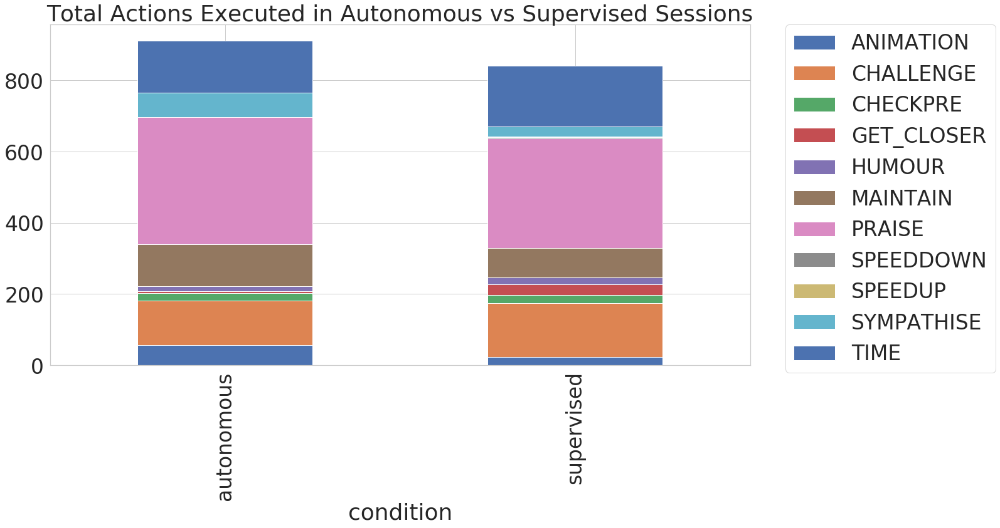

In [372]:
plt = spvd_auto_comp.groupby(["condition"])["action"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed in Autonomous vs Supervised Sessions")

[Text(0, 0, 'PRAISE'),
 Text(0, 0, 'TIME'),
 Text(0, 0, 'CHALLENGE'),
 Text(0, 0, 'HUMOUR'),
 Text(0, 0, 'MAINTAIN'),
 Text(0, 0, 'CHECKPRE'),
 Text(0, 0, 'GET_CLOSER'),
 Text(0, 0, 'SYMPATHISE'),
 Text(0, 0, 'ANIMATION'),
 Text(0, 0, 'SPEEDUP'),
 Text(0, 0, 'SPEEDDOWN')]

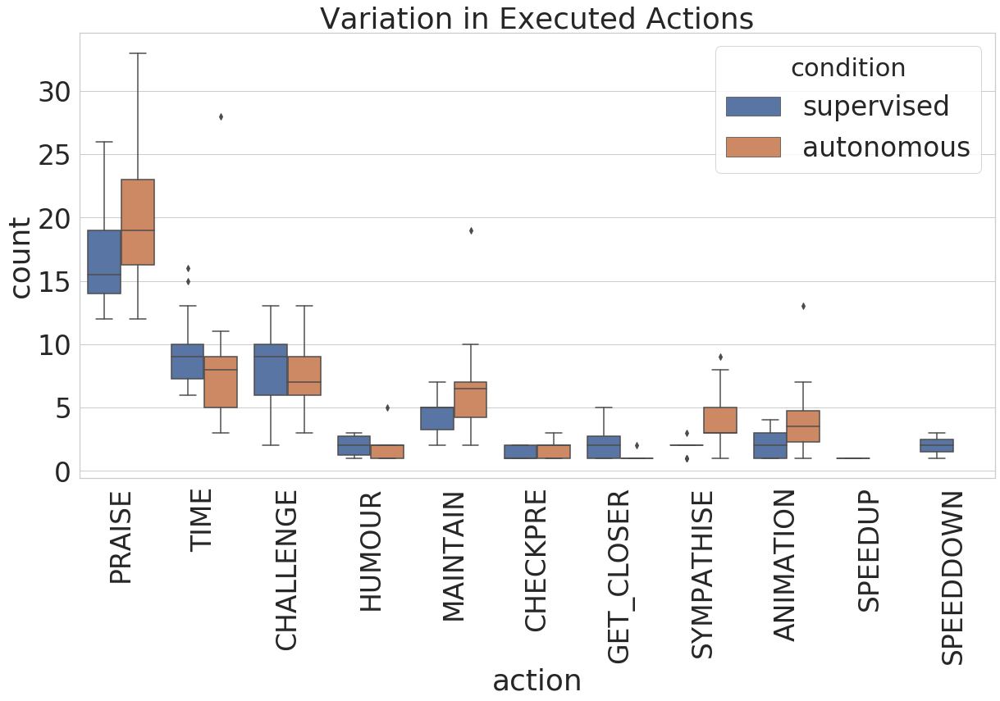

In [374]:
#not sure whether to normalise or not...?
value_count = spvd_auto_comp.groupby(['user_id','session_number','condition'])['action'].value_counts(normalize=False)
value_count = value_count.reset_index(name='count')

#value_count['action']=value_count['action'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CU" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))
ax = sns.boxplot(x="action", y='count', hue='condition', data=value_count)
ax.set_title("Variation in Executed Actions")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


Text(0.5, 1.0, 'Total Action Styles Executed in Autonomous vs Supervised Sessions')

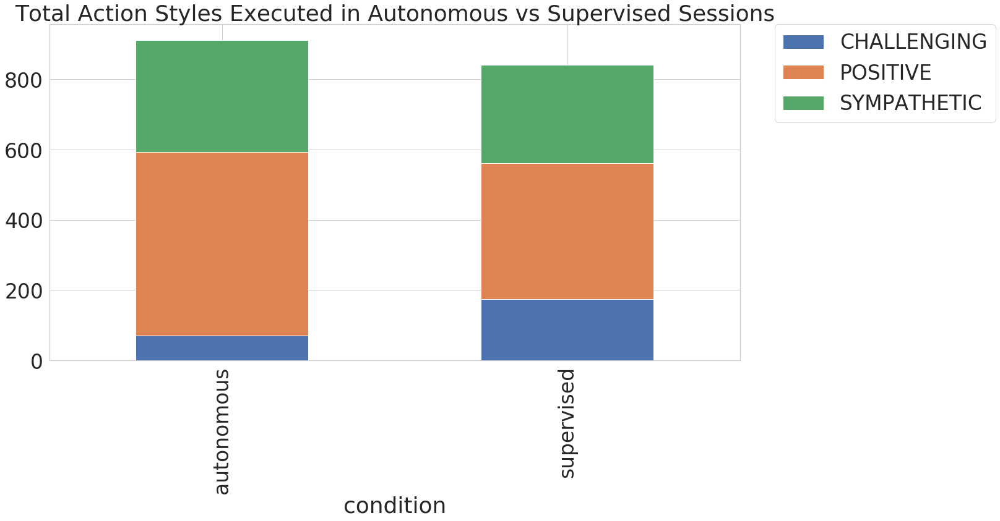

In [375]:
plt = spvd_auto_comp.groupby(["condition"])["style"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Action Styles Executed in Autonomous vs Supervised Sessions")

Text(0.5, 1.0, 'Variation in Executed Styles')

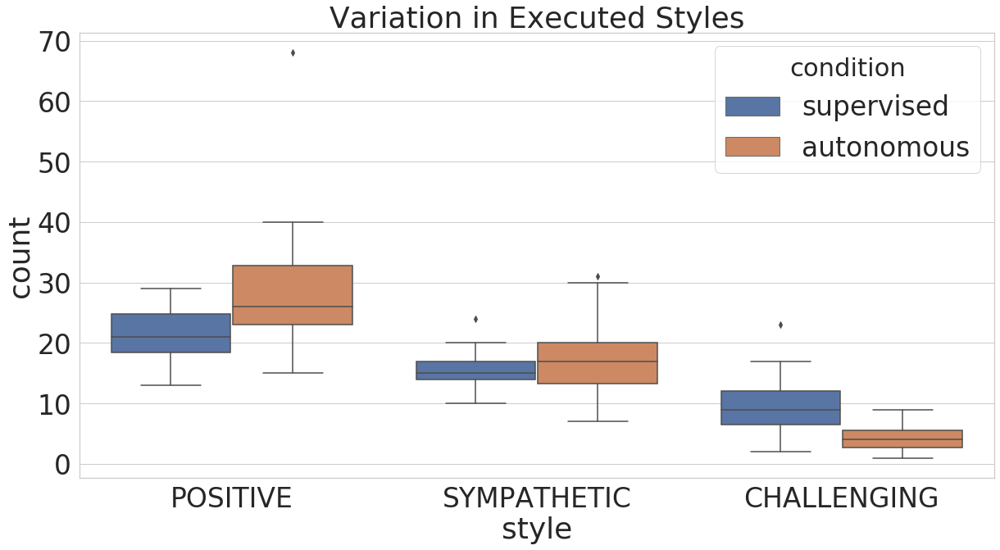

In [376]:
value_count = spvd_auto_comp.groupby(['user_id','session_number','condition'])['style'].value_counts(normalize=False)
value_count = value_count.reset_index(name='count')

ax = sns.boxplot(x="style", y='count', hue='condition', data=value_count)
ax.set_title("Variation in Executed Styles")

In [519]:
# Fiher's test for within-participant auto vs spvd

# auto_selection['action_type'] = auto_selection['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))
# auto_selection.groupby(["user_id","action_type"])["style"].value_counts(normalize=False)

# spvd_selection['action_type'] = spvd_selection['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))
# spvd_selection.groupby(["user_id","action_type"])["style"].value_counts(normalize=False)

spvd_actionstyle_counts = pd.read_csv('ch4_spvd_selection_actions.csv', skiprows = 1, names=['user_id','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
spvd_actionstyle_counts.set_index("user_id", inplace=True)

auto_actionstyle_counts = pd.read_csv('ch4_auto_selection_actions.csv', skiprows = 1, names=['user_id','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
auto_actionstyle_counts.set_index("user_id", inplace=True)

In [520]:
m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['LB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['FB'].tolist(),spvd_actionstyle_counts.loc['FB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DB'].tolist(),spvd_actionstyle_counts.loc['DB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['JF'].tolist(),spvd_actionstyle_counts.loc['JF'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)

print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['MR'].tolist(),spvd_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DP'].tolist(),spvd_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['JW'].tolist(),spvd_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['GB'].tolist(),spvd_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['PT'].tolist(),spvd_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.44980402190929053
p-value: 0.0003295711679810812
p-value: 0.00017039819444299395
p-value: 0.010723898370070137
p-value: 0.02878336958935695
p-value: 0.7268128408001582
p-value: 0.6938817165623231
p-value: 0.4707440572215742
p-value: 1.9688625140048935e-08


## Personalisation

Text(0.5, 1.0, 'Style of Actions Executed Across Two Autonomous Sessions')

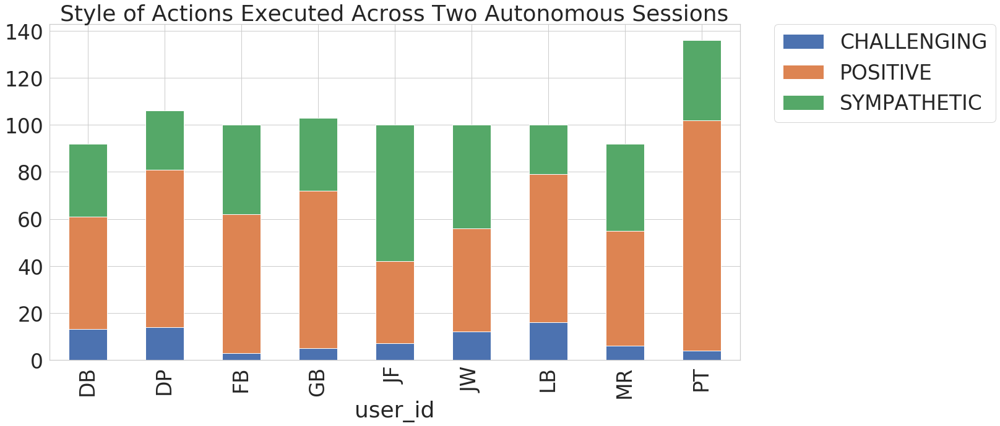

In [385]:
plt = auto_selection.groupby(["user_id"])["style"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Style of Actions Executed Across Two Autonomous Sessions")

Text(0.5, 1.0, 'Style of Actions Executed Across Two Autonomous Sessions - Normalised')

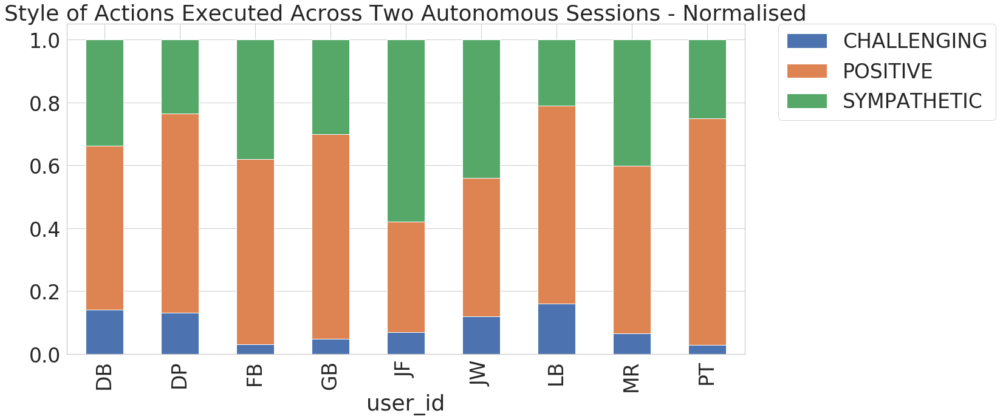

In [386]:
plt = auto_selection.groupby(["user_id"])["style"].value_counts(normalize=True).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Style of Actions Executed Across Two Autonomous Sessions - Normalised")

Text(0.5, 1.0, 'Total Action Types Executed Across Two Autonomous Sessions')

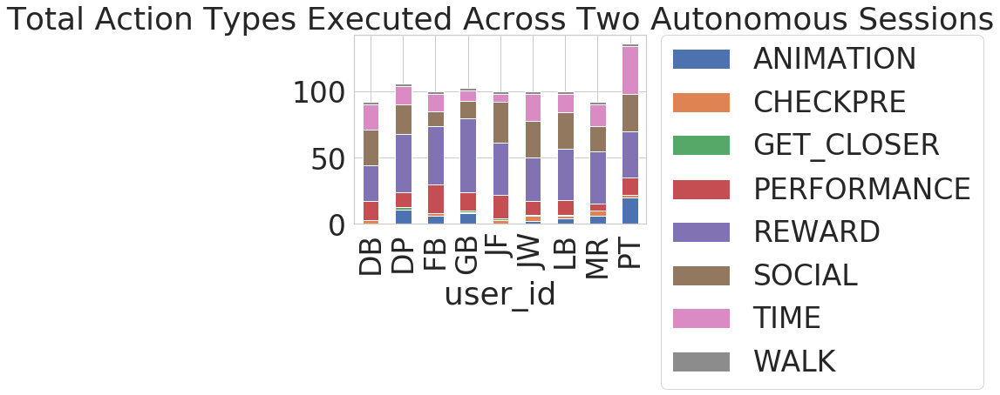

In [10]:
auto_selection['action_type']=auto_selection['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))

plt = auto_selection.groupby(["user_id"])["action_type"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Action Types Executed Across Two Autonomous Sessions")

Text(0.5, 1.0, 'Total Action Types Executed Across Two Autonomous Sessions - Normalised')

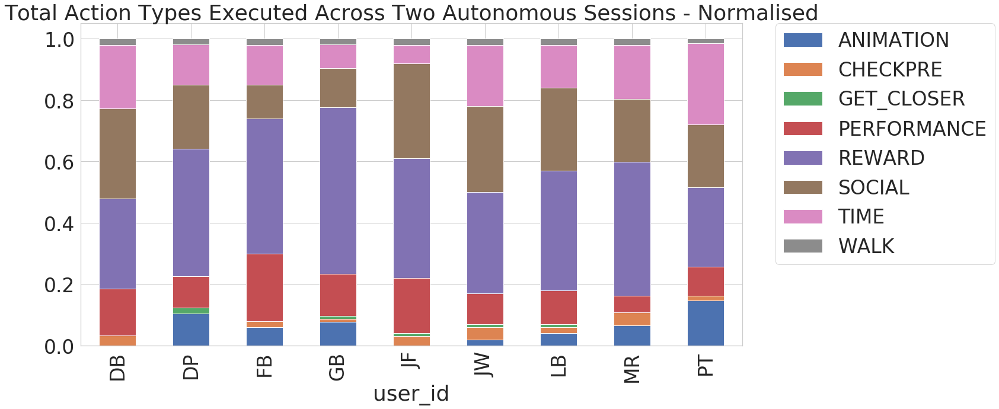

In [384]:
plt = auto_selection.groupby(["user_id"])["action_type"].value_counts(normalize=True).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Action Types Executed Across Two Autonomous Sessions - Normalised")

Text(0.5, 1.0, 'Total Actions Executed Across Selected Autonomous Sessions')

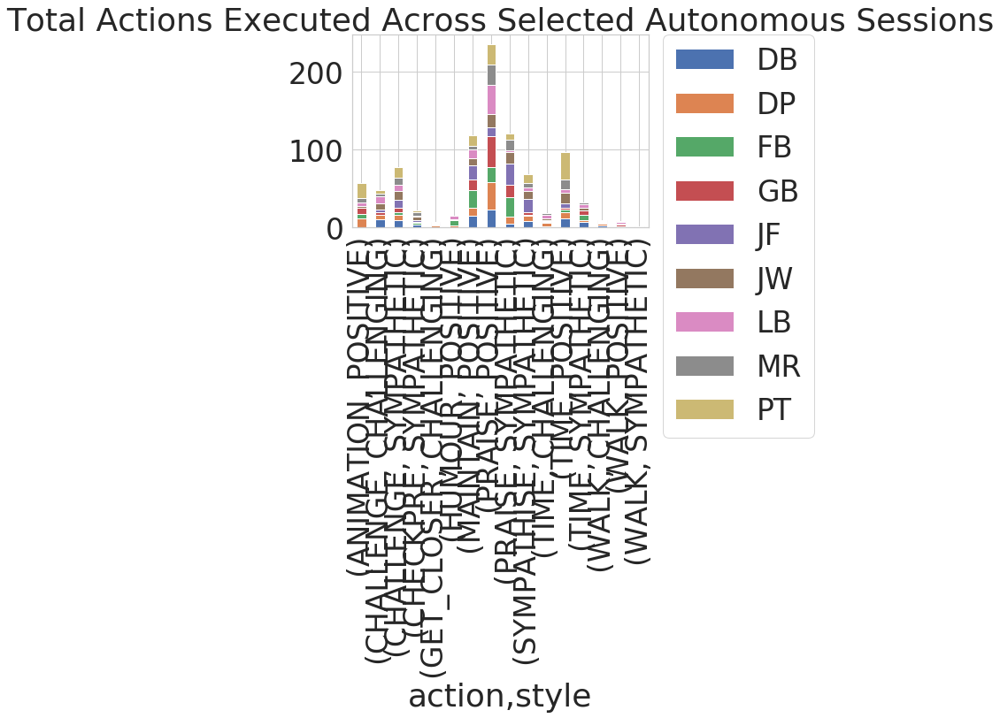

In [11]:
plt = auto_selection.groupby(["action","style"])["user_id"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed Across Selected Autonomous Sessions")

Text(0.5, 1.0, 'Total Actions Executed Across Selected Autonomous Sessions - Normalised')

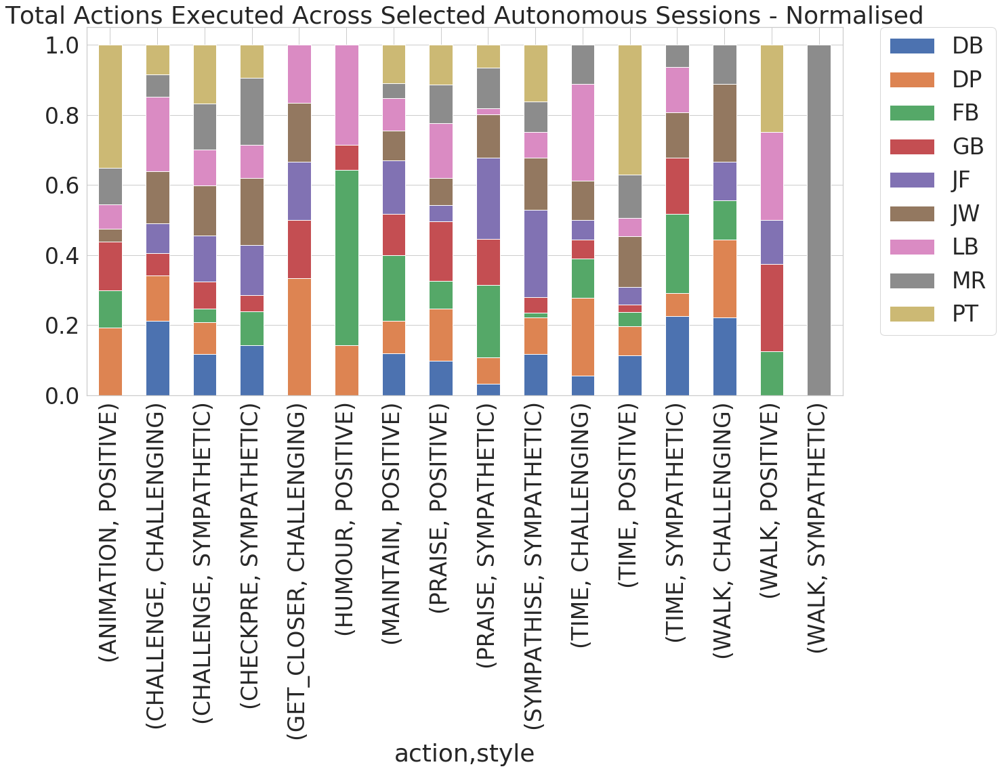

In [390]:
plt = auto_selection.groupby(["action","style"])["user_id"].value_counts(normalize=True).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed Across Selected Autonomous Sessions - Normalised")

In [501]:
pd.set_option('display.max_rows', None)
auto_selection.groupby(["user_id","action_type",])["style"].value_counts()

user_id  action_type  style      
DB       CHECKPRE     SYMPATHETIC     3
         PERFORMANCE  POSITIVE       14
         REWARD       POSITIVE       23
                      SYMPATHETIC     4
         SOCIAL       SYMPATHETIC    17
                      CHALLENGING    10
         TIME         POSITIVE       11
                      SYMPATHETIC     7
                      CHALLENGING     1
         WALK         CHALLENGING     2
DP       ANIMATION    POSITIVE       11
         GET_CLOSER   CHALLENGING     2
         PERFORMANCE  POSITIVE       11
         REWARD       POSITIVE       35
                      SYMPATHETIC     9
         SOCIAL       SYMPATHETIC    14
                      CHALLENGING     6
                      POSITIVE        2
         TIME         POSITIVE        8
                      CHALLENGING     4
                      SYMPATHETIC     2
         WALK         CHALLENGING     2
FB       ANIMATION    POSITIVE        6
         CHECKPRE     SYMPATHETIC     2
      

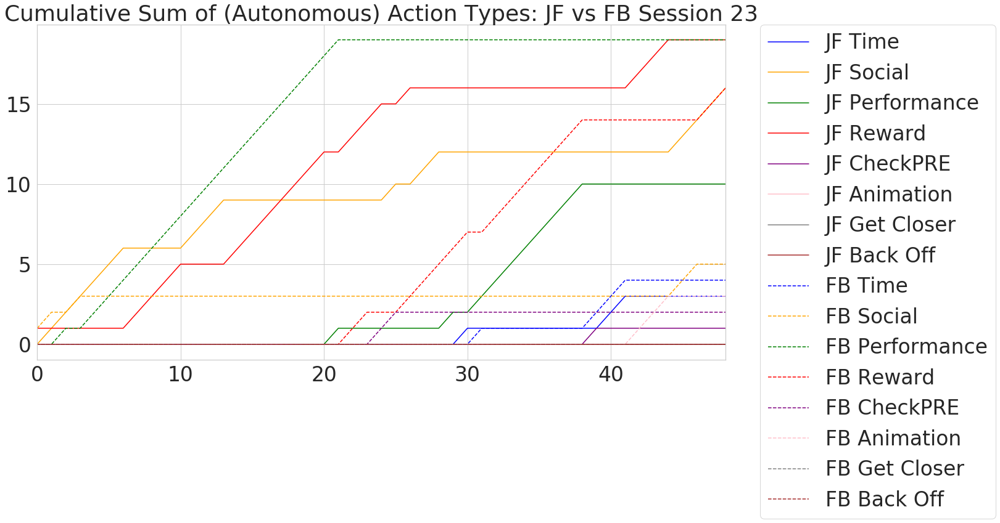

In [24]:
JF_23 = JF_auto_action_log_df[(JF_auto_action_log_df['session_number']==23) & (JF_auto_action_log_df['action']!='RUN') & (JF_auto_action_log_df['action']!='WALK')].copy()
FB_23 = FB_auto_action_log_df[(FB_auto_action_log_df['session_number']==23) & (FB_auto_action_log_df['action']!='RUN') & (FB_auto_action_log_df['action']!='WALK')].copy()


JF_23['action_type'] = JF_23['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))
FB_23['action_type'] = FB_23['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))


time_count = 0
social_count = 0
performance_count = 0
reward_count = 0
checkpre_count = 0
animation_count = 0
getcloser_count = 0
backoff_count = 0

for index, row in  JF_23.iterrows():
    if JF_23.loc[index,'action_type'] == "TIME":
        time_count += 1
        JF_23.loc[index,'time_count'] = time_count
        JF_23.loc[index,'social_count'] = social_count
        JF_23.loc[index,'performance_count'] = performance_count
        JF_23.loc[index,'reward_count'] = reward_count
        JF_23.loc[index,'checkpre_count'] = checkpre_count
        JF_23.loc[index,'animation_count'] = animation_count
        JF_23.loc[index,'getcloser_count'] = getcloser_count
        JF_23.loc[index,'backoff_count'] = backoff_count
    elif JF_23.loc[index,'action_type'] == "SOCIAL":
        social_count += 1
        JF_23.loc[index,'time_count'] = time_count
        JF_23.loc[index,'social_count'] = social_count
        JF_23.loc[index,'performance_count'] = performance_count
        JF_23.loc[index,'reward_count'] = reward_count
        JF_23.loc[index,'checkpre_count'] = checkpre_count
        JF_23.loc[index,'animation_count'] = animation_count
        JF_23.loc[index,'getcloser_count'] = getcloser_count
        JF_23.loc[index,'backoff_count'] = backoff_count
    elif JF_23.loc[index,'action_type'] == "PERFORMANCE":
        performance_count += 1
        JF_23.loc[index,'time_count'] = time_count
        JF_23.loc[index,'social_count'] = social_count
        JF_23.loc[index,'performance_count'] = performance_count
        JF_23.loc[index,'reward_count'] = reward_count
        JF_23.loc[index,'checkpre_count'] = checkpre_count
        JF_23.loc[index,'animation_count'] = animation_count
        JF_23.loc[index,'getcloser_count'] = getcloser_count
        JF_23.loc[index,'backoff_count'] = backoff_count
    elif JF_23.loc[index,'action_type'] == "REWARD":
        reward_count += 1
        JF_23.loc[index,'time_count'] = time_count
        JF_23.loc[index,'social_count'] = social_count
        JF_23.loc[index,'performance_count'] = performance_count
        JF_23.loc[index,'reward_count'] = reward_count
        JF_23.loc[index,'checkpre_count'] = checkpre_count
        JF_23.loc[index,'animation_count'] = animation_count
        JF_23.loc[index,'getcloser_count'] = getcloser_count
        JF_23.loc[index,'backoff_count'] = backoff_count
    elif JF_23.loc[index,'action_type'] == "CHECKPRE":
        checkpre_count += 1
        JF_23.loc[index,'time_count'] = time_count
        JF_23.loc[index,'social_count'] = social_count
        JF_23.loc[index,'performance_count'] = performance_count
        JF_23.loc[index,'reward_count'] = reward_count
        JF_23.loc[index,'checkpre_count'] = checkpre_count
        JF_23.loc[index,'animation_count'] = animation_count
        JF_23.loc[index,'getcloser_count'] = getcloser_count
        JF_23.loc[index,'backoff_count'] = backoff_count        
    elif JF_23.loc[index,'action_type'] == "ANIMATION":
        animation_count += 1
        JF_23.loc[index,'time_count'] = time_count
        JF_23.loc[index,'social_count'] = social_count
        JF_23.loc[index,'performance_count'] = performance_count
        JF_23.loc[index,'reward_count'] = reward_count
        JF_23.loc[index,'checkpre_count'] = checkpre_count
        JF_23.loc[index,'animation_count'] = animation_count
        JF_23.loc[index,'getcloser_count'] = getcloser_count
        JF_23.loc[index,'backoff_count'] = backoff_count  
    elif JF_23.loc[index,'action_type'] == "GET_CLOSER":
        getcloser_count += 1
        JF_23.loc[index,'time_count'] = time_count
        JF_23.loc[index,'social_count'] = social_count
        JF_23.loc[index,'performance_count'] = performance_count
        JF_23.loc[index,'reward_count'] = reward_count
        JF_23.loc[index,'checkpre_count'] = checkpre_count
        JF_23.loc[index,'animation_count'] = animation_count
        JF_23.loc[index,'getcloser_count'] = getcloser_count
        JF_23.loc[index,'backoff_count'] = backoff_count
    elif JF_23.loc[index,'action_type'] == "BACK_OFF":
        backoff_count += 1
        JF_23.loc[index,'time_count'] = time_count
        JF_23.loc[index,'social_count'] = social_count
        JF_23.loc[index,'performance_count'] = performance_count
        JF_23.loc[index,'reward_count'] = reward_count
        JF_23.loc[index,'checkpre_count'] = checkpre_count
        JF_23.loc[index,'animation_count'] = animation_count
        JF_23.loc[index,'getcloser_count'] = getcloser_count
        JF_23.loc[index,'backoff_count'] = backoff_count          
        
JF_23.reset_index(drop=True,inplace=True)

time_list_JF = JF_23['time_count'].tolist()
# time_list_LB.append(time_list_LB[42])
# time_list_LB.append(time_list_LB[42])
social_list_JF = JF_23['social_count'].tolist()
# social_list_LB.append(social_list_LB[42])
# social_list_LB.append(social_list_LB[42])
performance_list_JF = JF_23['performance_count'].tolist()
# performance_list_LB.append(performance_list_LB[42])
# performance_list_LB.append(performance_list_LB[42])
reward_list_JF = JF_23['reward_count'].tolist()
# reward_list_LB.append(reward_list_LB[42])
# reward_list_LB.append(reward_list_LB[42])
checkpre_list_JF = JF_23['checkpre_count'].tolist()
# checkpre_list_LB.append(checkpre_list_LB[42])
# checkpre_list_LB.append(checkpre_list_LB[42])
animation_list_JF = JF_23['animation_count'].tolist()
# animation_list_LB.append(animation_list_LB[42])
# animation_list_LB.append(animation_list_LB[42])
getcloser_list_JF = JF_23['getcloser_count'].tolist()
# getcloser_list_LB.append(getcloser_list_LB[42])
# getcloser_list_LB.append(getcloser_list_LB[42])
backoff_list_JF = JF_23['backoff_count'].tolist()
# backoff_list_LB.append(backoff_list_LB[42])
# backoff_list_LB.append(backoff_list_LB[42])

time_count = 0
social_count = 0
performance_count = 0
reward_count = 0
checkpre_count = 0
animation_count = 0
getcloser_count = 0
backoff_count = 0

for index, row in  FB_23.iterrows():
    if FB_23.loc[index,'action_type'] == "TIME":
        time_count += 1
        FB_23.loc[index,'time_count'] = time_count
        FB_23.loc[index,'social_count'] = social_count
        FB_23.loc[index,'performance_count'] = performance_count
        FB_23.loc[index,'reward_count'] = reward_count
        FB_23.loc[index,'checkpre_count'] = checkpre_count
        FB_23.loc[index,'animation_count'] = animation_count
        FB_23.loc[index,'getcloser_count'] = getcloser_count
        FB_23.loc[index,'backoff_count'] = backoff_count
    elif FB_23.loc[index,'action_type'] == "SOCIAL":
        social_count += 1
        FB_23.loc[index,'time_count'] = time_count
        FB_23.loc[index,'social_count'] = social_count
        FB_23.loc[index,'performance_count'] = performance_count
        FB_23.loc[index,'reward_count'] = reward_count
        FB_23.loc[index,'checkpre_count'] = checkpre_count
        FB_23.loc[index,'animation_count'] = animation_count
        FB_23.loc[index,'getcloser_count'] = getcloser_count
        FB_23.loc[index,'backoff_count'] = backoff_count
    elif FB_23.loc[index,'action_type'] == "PERFORMANCE":
        performance_count += 1
        FB_23.loc[index,'time_count'] = time_count
        FB_23.loc[index,'social_count'] = social_count
        FB_23.loc[index,'performance_count'] = performance_count
        FB_23.loc[index,'reward_count'] = reward_count
        FB_23.loc[index,'checkpre_count'] = checkpre_count
        FB_23.loc[index,'animation_count'] = animation_count
        FB_23.loc[index,'getcloser_count'] = getcloser_count
        FB_23.loc[index,'backoff_count'] = backoff_count
    elif FB_23.loc[index,'action_type'] == "REWARD":
        reward_count += 1
        FB_23.loc[index,'time_count'] = time_count
        FB_23.loc[index,'social_count'] = social_count
        FB_23.loc[index,'performance_count'] = performance_count
        FB_23.loc[index,'reward_count'] = reward_count
        FB_23.loc[index,'checkpre_count'] = checkpre_count
        FB_23.loc[index,'animation_count'] = animation_count
        FB_23.loc[index,'getcloser_count'] = getcloser_count
        FB_23.loc[index,'backoff_count'] = backoff_count
    elif FB_23.loc[index,'action_type'] == "CHECKPRE":
        checkpre_count += 1
        FB_23.loc[index,'time_count'] = time_count
        FB_23.loc[index,'social_count'] = social_count
        FB_23.loc[index,'performance_count'] = performance_count
        FB_23.loc[index,'reward_count'] = reward_count
        FB_23.loc[index,'checkpre_count'] = checkpre_count
        FB_23.loc[index,'animation_count'] = animation_count
        FB_23.loc[index,'getcloser_count'] = getcloser_count
        FB_23.loc[index,'backoff_count'] = backoff_count        
    elif FB_23.loc[index,'action_type'] == "ANIMATION":
        animation_count += 1
        FB_23.loc[index,'time_count'] = time_count
        FB_23.loc[index,'social_count'] = social_count
        FB_23.loc[index,'performance_count'] = performance_count
        FB_23.loc[index,'reward_count'] = reward_count
        FB_23.loc[index,'checkpre_count'] = checkpre_count
        FB_23.loc[index,'animation_count'] = animation_count
        FB_23.loc[index,'getcloser_count'] = getcloser_count
        FB_23.loc[index,'backoff_count'] = backoff_count  
    elif FB_23.loc[index,'action_type'] == "GET_CLOSER":
        getcloser_count += 1
        FB_23.loc[index,'time_count'] = time_count
        FB_23.loc[index,'social_count'] = social_count
        FB_23.loc[index,'performance_count'] = performance_count
        FB_23.loc[index,'reward_count'] = reward_count
        FB_23.loc[index,'checkpre_count'] = checkpre_count
        FB_23.loc[index,'animation_count'] = animation_count
        FB_23.loc[index,'getcloser_count'] = getcloser_count
        FB_23.loc[index,'backoff_count'] = backoff_count
    elif FB_23.loc[index,'action_type'] == "BACK_OFF":
        backoff_count += 1
        FB_23.loc[index,'time_count'] = time_count
        FB_23.loc[index,'social_count'] = social_count
        FB_23.loc[index,'performance_count'] = performance_count
        FB_23.loc[index,'reward_count'] = reward_count
        FB_23.loc[index,'checkpre_count'] = checkpre_count
        FB_23.loc[index,'animation_count'] = animation_count
        FB_23.loc[index,'getcloser_count'] = getcloser_count
        FB_23.loc[index,'backoff_count'] = backoff_count          
        
FB_23.reset_index(drop=True,inplace=True)

time_list_FB = FB_23['time_count'].tolist()
social_list_FB = FB_23['social_count'].tolist()
performance_list_FB = FB_23['performance_count'].tolist()
reward_list_FB = FB_23['reward_count'].tolist()
checkpre_list_FB = FB_23['checkpre_count'].tolist()
animation_list_FB = FB_23['animation_count'].tolist()
getcloser_list_FB = FB_23['getcloser_count'].tolist()
backoff_list_FB = FB_23['backoff_count'].tolist()

plotting_df = pd.DataFrame({
        'JF Time' : time_list_JF,
        'JF Social' : social_list_JF,
        'JF Performance' : performance_list_JF,
        'JF Reward' : reward_list_JF,
        'JF CheckPRE' : checkpre_list_JF,
        'JF Animation' : animation_list_JF,
        'JF Get Closer' : getcloser_list_JF,
        'JF Back Off' : backoff_list_JF,
        'FB Time' : time_list_FB,
        'FB Social' : social_list_FB,
        'FB Performance' : performance_list_FB,
        'FB Reward' : reward_list_FB,
        'FB CheckPRE' : checkpre_list_FB,
        'FB Animation' : animation_list_FB,
        'FB Get Closer' : getcloser_list_FB,
        'FB Back Off' : backoff_list_FB
    })

lines = plotting_df.plot.line(title="Cumulative Sum of (Autonomous) Action Types: JF vs FB Session 23", color=["blue","orange","green","red","purple","pink","grey","brown","blue","orange","green","red","purple","pink","grey","brown"], style=["-","-","-","-","-","-","-","-","--","--","--","--","--","--","--","--"])     
l=lines.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

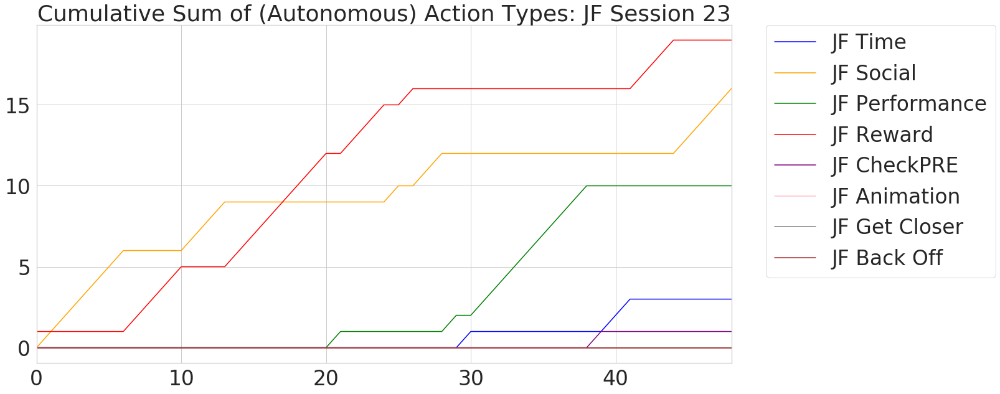

In [25]:
plotting_df = pd.DataFrame({
        'JF Time' : time_list_JF,
        'JF Social' : social_list_JF,
        'JF Performance' : performance_list_JF,
        'JF Reward' : reward_list_JF,
        'JF CheckPRE' : checkpre_list_JF,
        'JF Animation' : animation_list_JF,
        'JF Get Closer' : getcloser_list_JF,
        'JF Back Off' : backoff_list_JF,
#         'FB Time' : time_list_FB,
#         'FB Social' : social_list_FB,
#         'FB Performance' : performance_list_FB,
#         'FB Reward' : reward_list_FB,
#         'FB CheckPRE' : checkpre_list_FB,
#         'FB Animation' : animation_list_FB,
#         'FB Get Closer' : getcloser_list_FB,
#         'FB Back Off' : backoff_list_FB
    })

lines = plotting_df.plot.line(title="Cumulative Sum of (Autonomous) Action Types: JF Session 23", color=["blue","orange","green","red","purple","pink","grey","brown","blue","orange","green","red","purple","pink","grey","brown"], style=["-","-","-","-","-","-","-","-","--","--","--","--","--","--","--","--"])     
l=lines.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

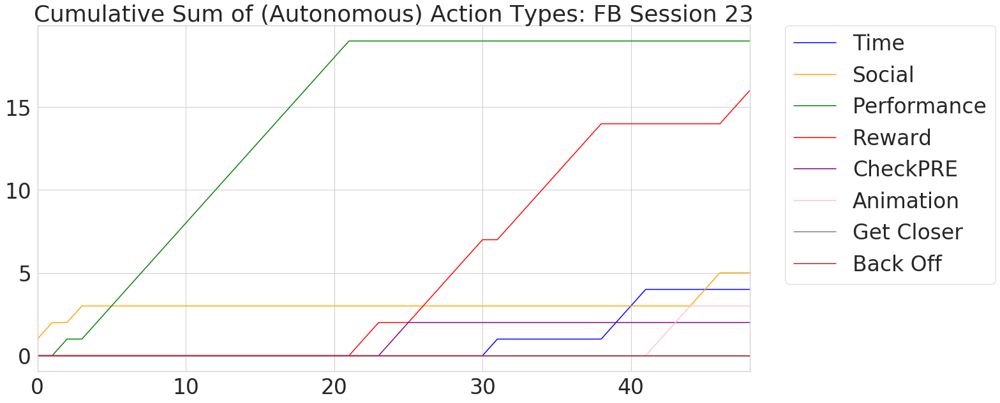

In [27]:
plotting_df = pd.DataFrame({
#         'JF Time' : time_list_JF,
#         'JF Social' : social_list_JF,
#         'JF Performance' : performance_list_JF,
#         'JF Reward' : reward_list_JF,
#         'JF CheckPRE' : checkpre_list_JF,
#         'JF Animation' : animation_list_JF,
#         'JF Get Closer' : getcloser_list_JF,
#         'JF Back Off' : backoff_list_JF,
        'Time' : time_list_FB,
        'Social' : social_list_FB,
        'Performance' : performance_list_FB,
        'Reward' : reward_list_FB,
        'CheckPRE' : checkpre_list_FB,
        'Animation' : animation_list_FB,
        'Get Closer' : getcloser_list_FB,
        'Back Off' : backoff_list_FB
    })

lines = plotting_df.plot.line(title="Cumulative Sum of (Autonomous) Action Types: FB Session 23", color=["blue","orange","green","red","purple","pink","grey","brown","blue","orange","green","red","purple","pink","grey","brown"], style=["-","-","-","-","-","-","-","-","--","--","--","--","--","--","--","--"])     
l=lines.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [16]:
# Fischer test for between-participant, autonomous comparison

# pd.set_option('display.max_rows', None)
# auto_selection.groupby(["action_type","style"])["user_id"].value_counts()

auto_actionstyle_counts = pd.read_csv('ch4_auto_selection_actions.csv', skiprows = 1, names=['user_id','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
auto_actionstyle_counts.set_index("user_id", inplace=True)

auto_actionstyle_counts

,animation-positive,checkpre-sympathetic,getcloser-challenging,performance-positive,performance-challenging,performance-sympathetic,reward-positive,reward-sympathetic,social-challenging,social-positive,social-sympathetic,time-challenging,time-positive,time-sympathetic
user_id,,,,,,,,,,,,,,
DB,0,3,0,14,0,0,23,4,10,0,17,1,11,7
DP,11,0,2,11,0,0,35,9,6,2,14,4,8,2
FB,6,2,0,22,0,0,19,25,0,7,4,2,4,7
GB,8,1,1,14,0,0,40,16,3,1,9,1,2,5
JF,0,3,1,18,0,0,11,28,4,0,27,1,5,0
JW,2,4,1,10,0,0,18,15,7,0,21,2,14,4
LB,4,2,1,11,0,0,37,2,10,4,13,5,5,4
MR,6,4,0,5,0,0,26,14,3,0,16,2,12,2
PT,20,2,0,13,0,0,27,8,4,0,24,0,36,0


In [514]:
# between - participant (auto vs auto, participant vs participant)
# User LB

m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),auto_actionstyle_counts.loc['FB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),auto_actionstyle_counts.loc['DB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),auto_actionstyle_counts.loc['JF'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),auto_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),auto_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),auto_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),auto_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['LB'].tolist(),auto_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 2.819042285278276e-08
p-value: 0.04655145403803292
p-value: 4.504489216159335e-11
p-value: 0.0016233419405464263
p-value: 0.29444755989860577
p-value: 0.000545655700939596
p-value: 0.0069678150721658744
p-value: 2.9750148276615987e-09


In [521]:
# User FB

m = np.array([auto_actionstyle_counts.loc['FB'].tolist(),auto_actionstyle_counts.loc['DB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['FB'].tolist(),auto_actionstyle_counts.loc['JF'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['FB'].tolist(),auto_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['FB'].tolist(),auto_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['FB'].tolist(),auto_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['FB'].tolist(),auto_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['FB'].tolist(),auto_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 3.3327392026851432e-09
p-value: 1.0259027875901689e-07
p-value: 4.320452024466258e-06
p-value: 8.474509427710635e-06
p-value: 1.2015386539576637e-06
p-value: 0.007270776452664429


R[write to console]: Error in (function (x, y = NULL, workspace = 2e+05, hybrid = FALSE, control = list(),  : 
  FEXACT error 7.
LDSTP is too small for this problem.
Try increasing the size of the workspace.



RRuntimeError: Error in (function (x, y = NULL, workspace = 2e+05, hybrid = FALSE, control = list(),  : 
  FEXACT error 7.
LDSTP is too small for this problem.
Try increasing the size of the workspace.


In [523]:
# User DB

m = np.array([auto_actionstyle_counts.loc['DB'].tolist(),auto_actionstyle_counts.loc['JF'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DB'].tolist(),auto_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DB'].tolist(),auto_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DB'].tolist(),auto_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DB'].tolist(),auto_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DB'].tolist(),auto_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 1.5967286569628677e-06
p-value: 0.0036620553407557257
p-value: 0.0011194086793284604
p-value: 0.2076448761132577
p-value: 3.0427197875666832e-05
p-value: 3.4046709881771813e-07


In [524]:
# User JF

m = np.array([auto_actionstyle_counts.loc['JF'].tolist(),auto_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['JF'].tolist(),auto_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['JF'].tolist(),auto_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['JF'].tolist(),auto_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['JF'].tolist(),auto_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 4.867191942421337e-05
p-value: 3.2441979270104126e-08
p-value: 0.016190000627295576
p-value: 6.928507408728322e-08
p-value: 4.824413462724322e-12


In [525]:
# User MR

m = np.array([auto_actionstyle_counts.loc['MR'].tolist(),auto_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['MR'].tolist(),auto_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['MR'].tolist(),auto_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['MR'].tolist(),auto_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.1624313115208365
p-value: 0.5553605971223562
p-value: 0.013795499908068535
p-value: 0.0036518072248131225


In [526]:
# User DP

m = np.array([auto_actionstyle_counts.loc['DP'].tolist(),auto_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DP'].tolist(),auto_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_actionstyle_counts.loc['DP'].tolist(),auto_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.008671553818421543
p-value: 0.24981481133476438
p-value: 0.00012554232786679936


In [528]:
# User JW

m = np.array([auto_actionstyle_counts.loc['JW'].tolist(),auto_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([auto_action[style_counts.loc['JW'].tolist(),auto_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.00021798626033224926
p-value: 7.749731973047373e-05


In [529]:
# User GB

m = np.array([auto_actionstyle_counts.loc['GB'].tolist(),auto_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.3034133160045423e-09


In [530]:
# same analysis for supevised sessions just to see if any evidence
# once expanded outside of s17 specifically

# User LB

m = np.array([spvd_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['FB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([spvd_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['DB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([spvd_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['JF'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([spvd_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['MR'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([spvd_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['DP'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([spvd_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['JW'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([spvd_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['GB'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([spvd_actionstyle_counts.loc['LB'].tolist(),spvd_actionstyle_counts.loc['PT'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.6801364948943619
p-value: 0.6373940509346531
p-value: 0.2833125484152686
p-value: 0.07086218641219137
p-value: 0.07355953644809218
p-value: 0.27649438584576397
p-value: 0.12909841172212297
p-value: 0.033626915425768844


## Participant Evaluation

In [18]:
ratings_df = pd.read_csv('session_ratings.csv', names=['user_id','session_number','condition','session_rating','robot_rating'])

ratings_df['session_number'] = ratings_df['session_number'].astype(int)

In [19]:
LB_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='LB') & (ratings_df['session_number']>=23) & (ratings_df['session_number']<=24)].copy()
FB_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='FB') & (ratings_df['session_number']>=22) & (ratings_df['session_number']<=23)].copy()
DB_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='DB') & (ratings_df['session_number']>=19) & (ratings_df['session_number']<=20)].copy()
JF_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='JF') & (ratings_df['session_number']>=23) & (ratings_df['session_number']<=24)].copy()
MR_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='MR') & (ratings_df['session_number']>=19) & (ratings_df['session_number']<=20)].copy()
DP_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='DP') & (ratings_df['session_number']>=25) & (ratings_df['session_number']<=26)].copy()
JW_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='JW') & (ratings_df['session_number']>=23) & (ratings_df['session_number']<=24)].copy()
GB_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='GB') & (ratings_df['session_number']>=24) & (ratings_df['session_number']<=25)].copy()
PT_auto_ratings_log_df=ratings_df[(ratings_df['user_id']=='PT') & (ratings_df['session_number']>=19) & (ratings_df['session_number']<=20)].copy()

LB_spvd_ratings_log_df=ratings_df[(ratings_df['user_id']=='LB') & (ratings_df['session_number']>=21) & (ratings_df['session_number']<=22)].copy()
FB_spvd_ratings_log_df=ratings_df[(ratings_df['user_id']=='FB') & (ratings_df['session_number']>=20) & (ratings_df['session_number']<=21)].copy()
DB_spvd_ratings_log_df=ratings_df[(ratings_df['user_id']=='DB') & (ratings_df['session_number']>=16) & (ratings_df['session_number']<=17)].copy()
JF_spvd_ratings_log_df=ratings_df[(ratings_df['user_id']=='JF') & (ratings_df['session_number']>=21) & (ratings_df['session_number']<=22)].copy()
MR_spvd_ratings_log_df=ratings_df[(ratings_df['user_id']=='MR') & (ratings_df['session_number']>=17) & (ratings_df['session_number']<=18)].copy()
DP_spvd_ratings_log_df1=ratings_df[(ratings_df['user_id']=='DP') & (ratings_df['session_number']==21)].copy()
DP_spvd_ratings_log_df2=ratings_df[(ratings_df['user_id']=='DP') & (ratings_df['session_number']==24)].copy()
JW_spvd_ratings_log_df=ratings_df[(ratings_df['user_id']=='JW') & (ratings_df['session_number']>=21) & (ratings_df['session_number']<23)].copy()
GB_spvd_ratings_log_df1=ratings_df[(ratings_df['user_id']=='GB') & (ratings_df['session_number']==21)].copy()
GB_spvd_ratings_log_df2=ratings_df[(ratings_df['user_id']=='GB') & (ratings_df['session_number']==23)].copy()
PT_spvd_ratings_log_df=ratings_df[(ratings_df['user_id']=='PT') & (ratings_df['session_number']>=17) & (ratings_df['session_number']<=18)].copy()


ratings_comp=pd.concat([LB_auto_ratings_log_df, FB_auto_ratings_log_df, DB_auto_ratings_log_df, JF_auto_ratings_log_df, MR_auto_ratings_log_df, DP_auto_ratings_log_df, JW_auto_ratings_log_df, GB_auto_ratings_log_df, PT_auto_ratings_log_df, LB_spvd_ratings_log_df, FB_spvd_ratings_log_df, DB_spvd_ratings_log_df, JF_spvd_ratings_log_df, MR_spvd_ratings_log_df, DP_spvd_ratings_log_df1, DP_spvd_ratings_log_df2, JW_spvd_ratings_log_df, GB_spvd_ratings_log_df1, GB_spvd_ratings_log_df2, PT_spvd_ratings_log_df])

condition   robot_rating
autonomous  great           12
            ok               5
            not great        1
supervised  great           13
            ok               5
Name: robot_rating, dtype: int64

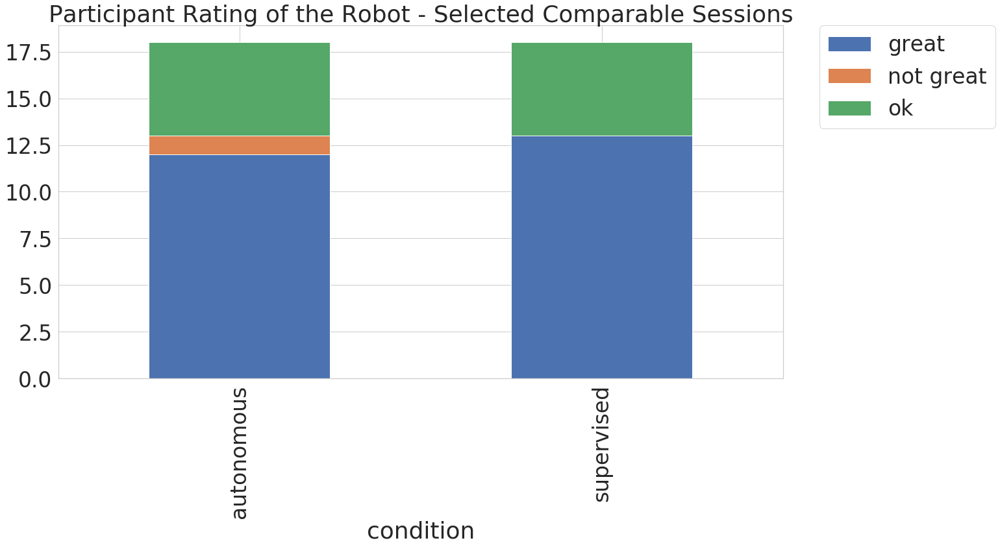

In [428]:
plt = ratings_comp.groupby(["condition"])["robot_rating"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Participant Rating of the Robot - Selected Comparable Sessions")
ratings_comp.groupby(["condition"])["robot_rating"].value_counts(normalize=False)

condition   robot_rating
autonomous  great            22
            ok                7
            not great         1
supervised  great           103
            ok               43
            not great         3
Name: robot_rating, dtype: int64

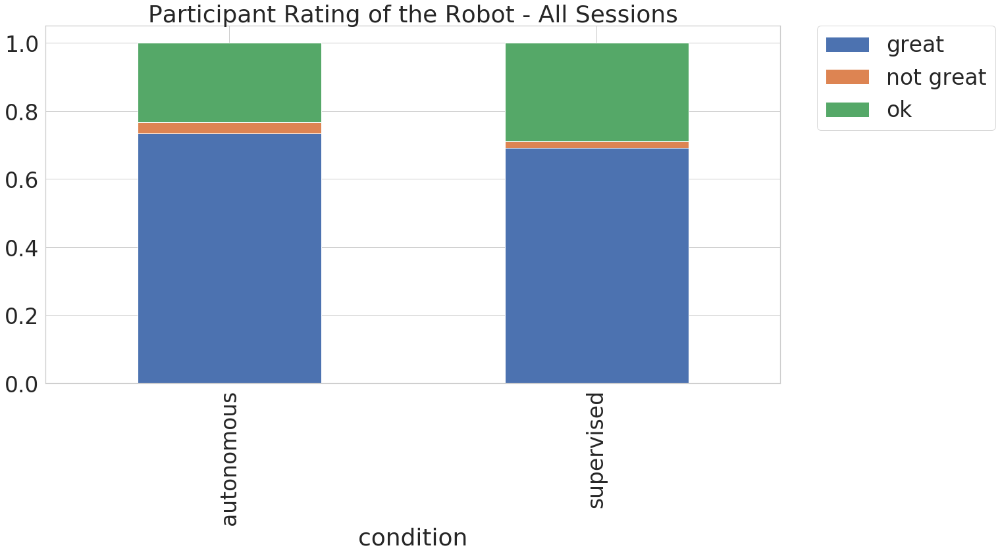

In [431]:
# drop heuristics 

indexNames = ratings_df[ratings_df['condition'] == 'heuristic'].index
ratings_df.drop(indexNames , inplace=True)

indexNames = ratings_df[ratings_df['condition'] == 'heuristic2'].index
ratings_df.drop(indexNames , inplace=True)

indexNames = ratings_df[ratings_df['robot_rating'] == 'blank'].index
ratings_df.drop(indexNames , inplace=True)

plt = ratings_df.groupby(["condition"])["robot_rating"].value_counts(normalize=True).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Participant Rating of the Robot - All Sessions")

ratings_df.groupby(["condition"])["robot_rating"].value_counts(normalize=False)

In [12]:
overall_df = pd.read_csv('overall_qual.csv', names=['user_id','work','overall'])

Text(0.5, 1.0, 'Would you work with one of the robots again?')

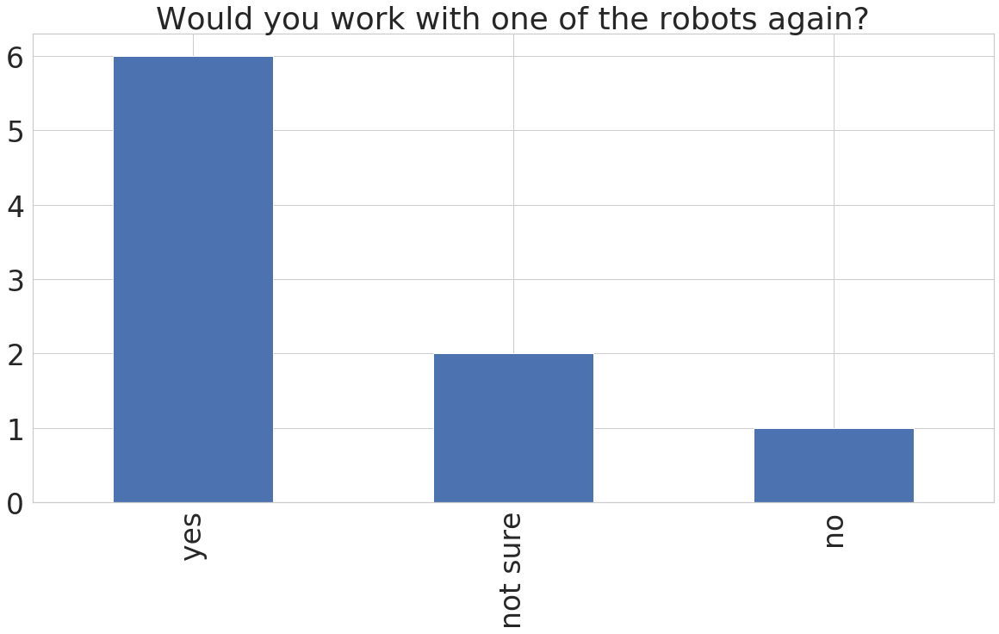

In [19]:
plt = overall_df["work"].value_counts(normalize=False).plot.bar()
plt.set_title("Would you work with one of the robots again?")

Text(0.5, 1.0, 'Overall experience of working with the robot (coded data)')

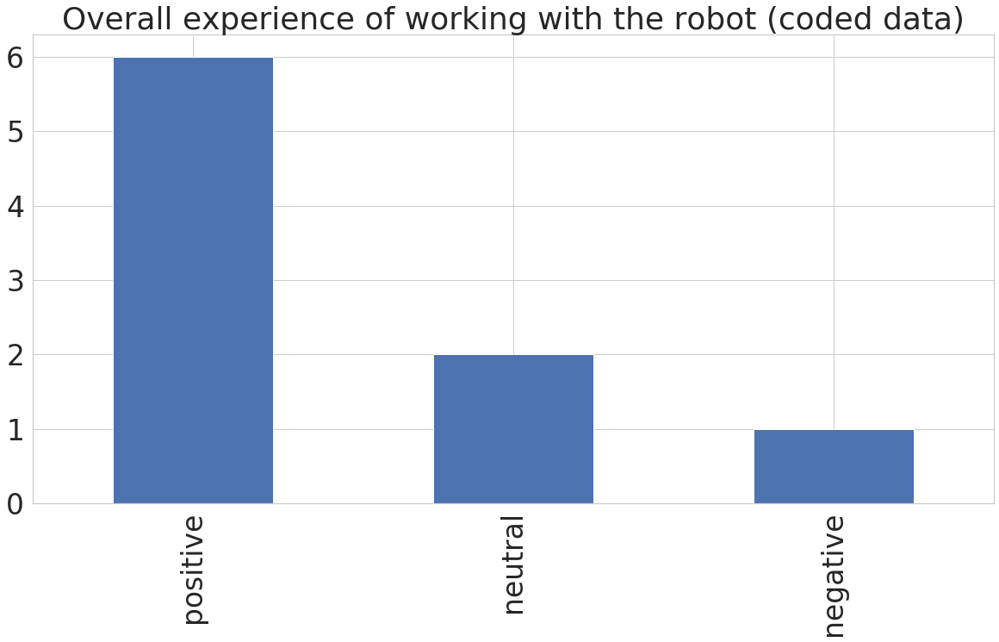

In [17]:
plt = overall_df["overall"].value_counts(normalize=False).plot.bar()
plt.set_title("Overall experience of working with the robot (coded data)")

# CHAPTER 5: MUTUAL SHAPING

In [20]:
# Phase 1 dataframe to compare initial ML-S and H1 (maybe more similar as fitness instructor knows participants less well at this point, less personalisation?)
# TO-DO: should run the personalisation of ML-S across participants twice, to see if difference was indeed larger at end of Phase 2 than start

# 2 of each session type per participant *only* to have same number from each participant / condition

# some H1 sessions are dropped to match number of IML-S1 sessions per participant where failed to collect IML-S 1 action data
LB_H1_actions=action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']<=5) & (action_log_df['session_number']!=1) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
FB_H1_actions=action_log_df[(action_log_df['user_id']=='FB') & (action_log_df['session_number']<=4) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DB_H1_actions=action_log_df[(action_log_df['user_id']=='DB') & (action_log_df['session_number']<=4) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JF_H1_actions=action_log_df[(action_log_df['user_id']=='JF') & (action_log_df['session_number']<=4) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
MR_H1_actions=action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']<=4) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DP_H1_actions=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']<=4) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JW_H1_actions=action_log_df[(action_log_df['user_id']=='JW') & (action_log_df['session_number']<=4) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
GB_H1_actions=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']<=4) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
PT_H1_actions=action_log_df[(action_log_df['user_id']=='PT') & (action_log_df['session_number']<=4) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()

H1_actions = pd.concat([LB_H1_actions,FB_H1_actions,DB_H1_actions,JF_H1_actions,MR_H1_actions,DP_H1_actions,JW_H1_actions,GB_H1_actions,PT_H1_actions])
H1_actions['condition']='H1'
H1_actions['action_type']=H1_actions['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))

# some IML-S sessions are dropped to match number of H1 sessions per participant where failed to collect H1 action data
LB_IMLS1_actions=LB_training_action_log_df[(LB_training_action_log_df['validation']!='REFUSED') & (LB_training_action_log_df['session_number']<=4) & (LB_training_action_log_df['session_number']!=1) & (LB_training_action_log_df['session_number']!=3) & (LB_training_action_log_df['session_number']!=5) & (LB_training_action_log_df['session_number']!=7)].copy()
FB_IMLS1_actions=FB_training_action_log_df[(FB_training_action_log_df['validation']!='REFUSED') & (FB_training_action_log_df['session_number']<=4) & (FB_training_action_log_df['session_number']!=1) & (FB_training_action_log_df['session_number']!=3) & (FB_training_action_log_df['session_number']!=5) & (FB_training_action_log_df['session_number']!=7)].copy()
MR_IMLS1_actions=MR_training_action_log_df[(MR_training_action_log_df['validation']!='REFUSED') & (MR_training_action_log_df['session_number']<=4) & (MR_training_action_log_df['session_number']!=1) & (MR_training_action_log_df['session_number']!=3) & (MR_training_action_log_df['session_number']!=5) & (MR_training_action_log_df['session_number']!=7)].copy()
GB_IMLS1_actions=GB_training_action_log_df[(GB_training_action_log_df['validation']!='REFUSED') & (GB_training_action_log_df['session_number']<=4) & (GB_training_action_log_df['session_number']!=1) & (GB_training_action_log_df['session_number']!=3) & (GB_training_action_log_df['session_number']!=5) & (GB_training_action_log_df['session_number']!=7)].copy()
PT_IMLS1_actions=PT_training_action_log_df[(PT_training_action_log_df['validation']!='REFUSED') & (PT_training_action_log_df['session_number']<=4) & (PT_training_action_log_df['session_number']!=1) & (PT_training_action_log_df['session_number']!=3) & (PT_training_action_log_df['session_number']!=5) & (PT_training_action_log_df['session_number']!=7)].copy()
DB_IMLS1_actions=DB_training_action_log_df[(DB_training_action_log_df['validation']!='REFUSED') & (DB_training_action_log_df['session_number']<=4) & (DB_training_action_log_df['session_number']!=2) & (DB_training_action_log_df['session_number']!=4) & (DB_training_action_log_df['session_number']!=6) & (DB_training_action_log_df['session_number']!=8)].copy()
JF_IMLS1_actions=JF_training_action_log_df[(JF_training_action_log_df['validation']!='REFUSED') & (JF_training_action_log_df['session_number']<=4) & (JF_training_action_log_df['session_number']!=2) & (JF_training_action_log_df['session_number']!=4) & (JF_training_action_log_df['session_number']!=6) & (JF_training_action_log_df['session_number']!=8)].copy()
DP_IMLS1_actions=DP_training_action_log_df[(DP_training_action_log_df['validation']!='REFUSED') & (DP_training_action_log_df['session_number']<=4) & (DP_training_action_log_df['session_number']!=2) & (DP_training_action_log_df['session_number']!=4) & (DP_training_action_log_df['session_number']!=6) & (DP_training_action_log_df['session_number']!=8)].copy()
JW_IMLS1_actions=JW_training_action_log_df[(JW_training_action_log_df['validation']!='REFUSED') & (JW_training_action_log_df['session_number']<=8) & (JW_training_action_log_df['session_number']!=1) & (JW_training_action_log_df['session_number']!=3) & (JW_training_action_log_df['session_number']!=2) & (JW_training_action_log_df['session_number']!=4) & (JW_training_action_log_df['session_number']!=6) & (JW_training_action_log_df['session_number']!=8)].copy()

IMLS1_actions=pd.concat([LB_IMLS1_actions,FB_IMLS1_actions,DB_IMLS1_actions,JF_IMLS1_actions,MR_IMLS1_actions,DP_IMLS1_actions,JW_IMLS1_actions, GB_IMLS1_actions, PT_IMLS1_actions])
IMLS1_actions['condition']='IML-S1'
IMLS1_actions['action_type']=IMLS1_actions['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))


# totals for creating csv of (action-type,style) numbers for Fisher test
IMLS1_actions.groupby(['action_type'])['style'].value_counts()

# phase 1 df for producing hue'd graphs
phase1_df = pd.concat([H1_actions, IMLS1_actions])
#phase1_df.groupby(['user_id','condition'])['session_number'].value_counts()

In [21]:
# phase 2 dataframe 

LB_H2_actions=action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']==25) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
FB_H2_actions=action_log_df[(action_log_df['user_id']=='FB') & (action_log_df['session_number']==24) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DB_H2_actions=action_log_df[(action_log_df['user_id']=='DB') & (action_log_df['session_number']==21) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JF_H2_actions=action_log_df[(action_log_df['user_id']=='JF') & (action_log_df['session_number']==25) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
MR_H2_actions=action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']==21) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DP_H2_actions=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']==27) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JW_H2_actions=action_log_df[(action_log_df['user_id']=='JW') & (action_log_df['session_number']==25) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
GB_H2_actions=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']==26) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
PT_H2_actions=action_log_df[(action_log_df['user_id']=='PT') & (action_log_df['session_number']==21) & (action_log_df['validation']=='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE')].copy()

H2_actions = pd.concat([LB_H2_actions,FB_H2_actions,DB_H2_actions,JF_H2_actions,MR_H2_actions,DP_H2_actions,JW_H2_actions,GB_H2_actions,PT_H2_actions])
H2_actions['condition']='H2'
H2_actions['action_type']=H2_actions['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))

LB_IMLS2_actions=LB_training_action_log_df[(LB_training_action_log_df['validation']!='REFUSED') & (LB_training_action_log_df['session_number']==22)].copy()
FB_IMLS2_actions=FB_training_action_log_df[(FB_training_action_log_df['validation']!='REFUSED') & (FB_training_action_log_df['session_number']==21)].copy()
MR_IMLS2_actions=MR_training_action_log_df[(MR_training_action_log_df['validation']!='REFUSED') & (MR_training_action_log_df['session_number']==18)].copy()
GB_IMLS2_actions=GB_spvd_action_log_df2[(GB_spvd_action_log_df2['validation']!='REFUSED') & (GB_spvd_action_log_df2['session_number']==23)].copy()
PT_IMLS2_actions=PT_training_action_log_df[(PT_training_action_log_df['validation']!='REFUSED') & (PT_training_action_log_df['session_number']==18)].copy()
DB_IMLS2_actions=DB_training_action_log_df[(DB_training_action_log_df['validation']!='REFUSED') & (DB_training_action_log_df['session_number']==17)].copy()
JF_IMLS2_actions=JF_training_action_log_df[(JF_training_action_log_df['validation']!='REFUSED') & (JF_training_action_log_df['session_number']==22)].copy()
DP_IMLS2_actions=DP_spvd_action_log_df2[(DP_spvd_action_log_df2['validation']!='REFUSED') & (DP_spvd_action_log_df2['session_number']==24)].copy()
JW_IMLS2_actions=JW_training_action_log_df[(JW_training_action_log_df['validation']!='REFUSED') & (JW_training_action_log_df['session_number']==22)].copy()

IMLS2_actions=pd.concat([LB_IMLS2_actions,FB_IMLS2_actions,DB_IMLS2_actions,JF_IMLS2_actions,MR_IMLS2_actions,DP_IMLS2_actions,JW_IMLS2_actions, GB_IMLS2_actions, PT_IMLS2_actions])
IMLS2_actions['condition']='IML-S2'
IMLS2_actions['action_type']=IMLS2_actions['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))

LB_IMLA_actions=LB_auto_action_log_df[(LB_auto_action_log_df['validation']!='REFUSED') & (LB_auto_action_log_df['session_number']==24)].copy()
FB_IMLA_actions=FB_auto_action_log_df[(FB_auto_action_log_df['validation']!='REFUSED') & (FB_auto_action_log_df['session_number']==23)].copy()
MR_IMLA_actions=MR_auto_action_log_df[(MR_auto_action_log_df['validation']!='REFUSED') & (MR_auto_action_log_df['session_number']==20)].copy()
GB_IMLA_actions=GB_auto_action_log_df[(GB_auto_action_log_df['validation']!='REFUSED') & (GB_auto_action_log_df['session_number']==25)].copy()
PT_IMLA_actions=PT_auto_action_log_df[(PT_auto_action_log_df['validation']!='REFUSED') & (PT_auto_action_log_df['session_number']==20)].copy()
DB_IMLA_actions=DB_auto_action_log_df[(DB_auto_action_log_df['validation']!='REFUSED') & (DB_auto_action_log_df['session_number']==20)].copy()
JF_IMLA_actions=JF_auto_action_log_df[(JF_auto_action_log_df['validation']!='REFUSED') & (JF_auto_action_log_df['session_number']==24)].copy()
DP_IMLA_actions=DP_auto_action_log_df[(DP_auto_action_log_df['validation']!='REFUSED') & (DP_auto_action_log_df['session_number']==26)].copy()
JW_IMLA_actions=JW_auto_action_log_df[(JW_auto_action_log_df['validation']!='REFUSED') & (JW_auto_action_log_df['session_number']==24)].copy()

IMLA_actions=pd.concat([LB_IMLA_actions,FB_IMLA_actions,DB_IMLA_actions,JF_IMLA_actions,MR_IMLA_actions,DP_IMLA_actions,JW_IMLA_actions, GB_IMLA_actions, PT_IMLA_actions])
IMLA_actions['condition']='IML-A'
IMLA_actions['action_type']=IMLA_actions['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))


IMLS1_IMLS2_df = pd.concat([IMLS1_actions,IMLS2_actions])
H2_IMLS2_df = pd.concat([H2_actions, IMLS2_actions])
H2_IMLA_df = pd.concat([H2_actions, IMLA_actions])

## Similarity in actions and styles - Phase 1

Text(0.5, 1.0, 'Total Action Styles Executed in IML-S1 vs H1 Sessions')

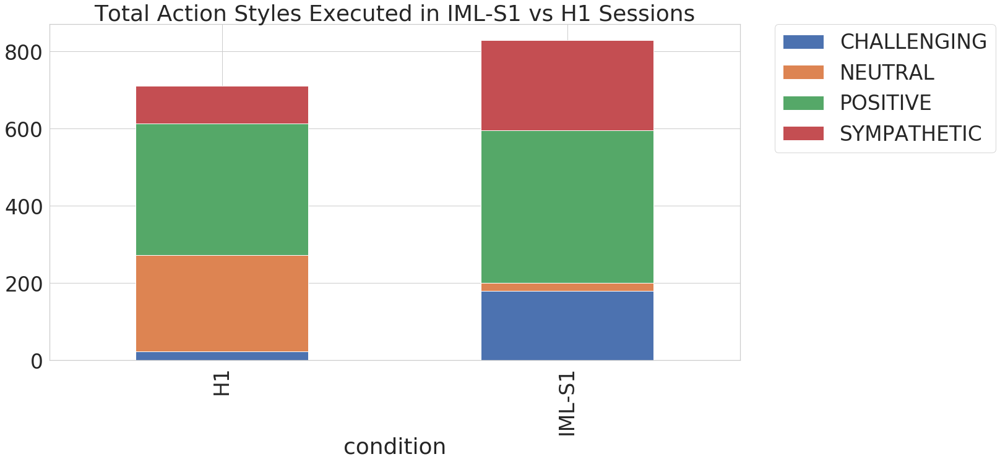

In [212]:
plt = phase1_df.groupby(["condition"])["style"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Action Styles Executed in IML-S1 vs H1 Sessions")

Text(0.5, 1.0, 'Variation in Executed Styles')

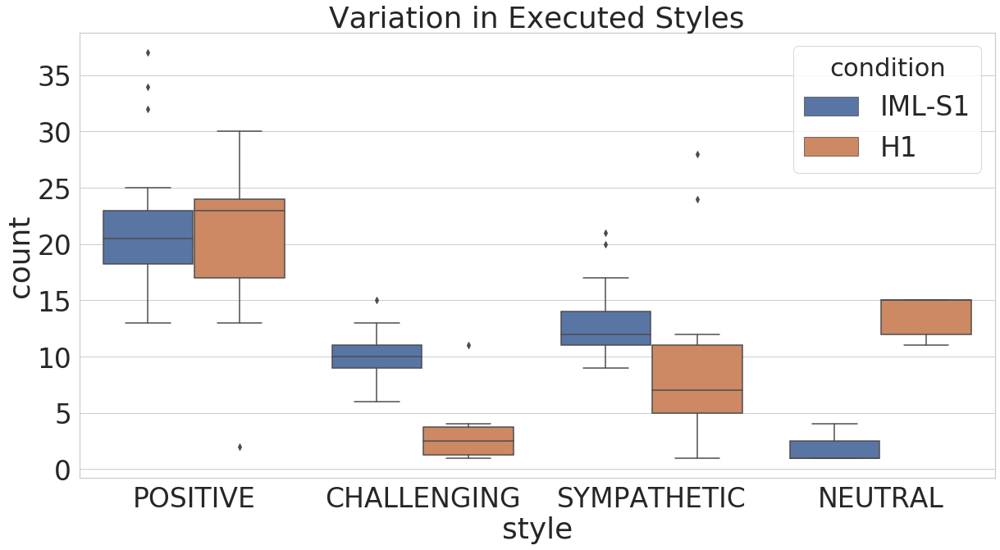

In [213]:
value_count = phase1_df.groupby(['user_id','session_number','condition'])['style'].value_counts(normalize=False)
value_count = value_count.reset_index(name='count')

ax = sns.boxplot(x="style", y='count', hue='condition', data=value_count)
ax.set_title("Variation in Executed Styles")

Text(0.5, 1.0, 'Social Supporting Actions Executed in IML-S1 vs H1 Sessions')

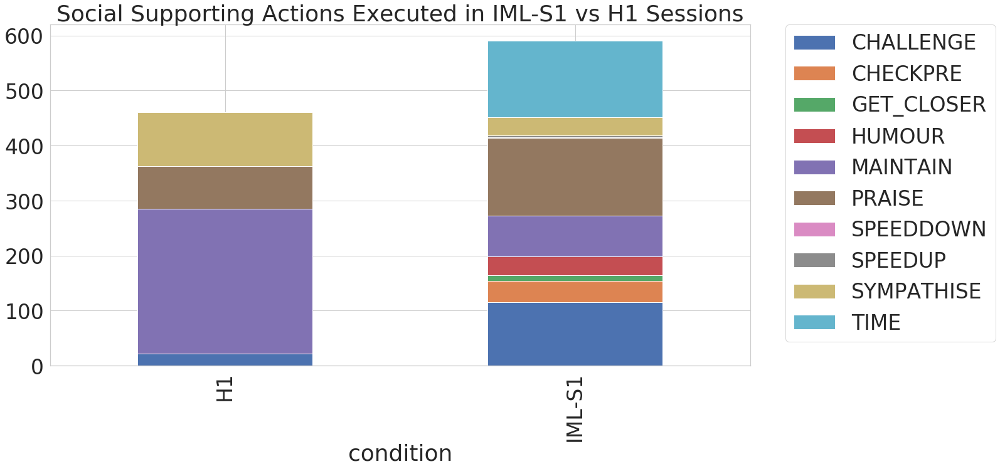

In [217]:
# drop run and walk when looking at overall actions
indexNames = phase1_df[phase1_df['action'] == 'RUN'].index
phase1_df.drop(indexNames , inplace=True)

indexNames = phase1_df[phase1_df['action'] == 'WALK'].index
phase1_df.drop(indexNames , inplace=True)

plt = phase1_df.groupby(["condition"])["action"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Social Supporting Actions Executed in IML-S1 vs H1 Sessions")

[Text(0, 0, 'TIME'),
 Text(0, 0, 'PRAISE'),
 Text(0, 0, 'CHALLENGE'),
 Text(0, 0, 'MAINTAIN'),
 Text(0, 0, 'HUMOUR'),
 Text(0, 0, 'CHECKPRE'),
 Text(0, 0, 'GET_CLOSER'),
 Text(0, 0, 'SPEEDDOWN'),
 Text(0, 0, 'SYMPATHISE'),
 Text(0, 0, 'SPEEDUP')]

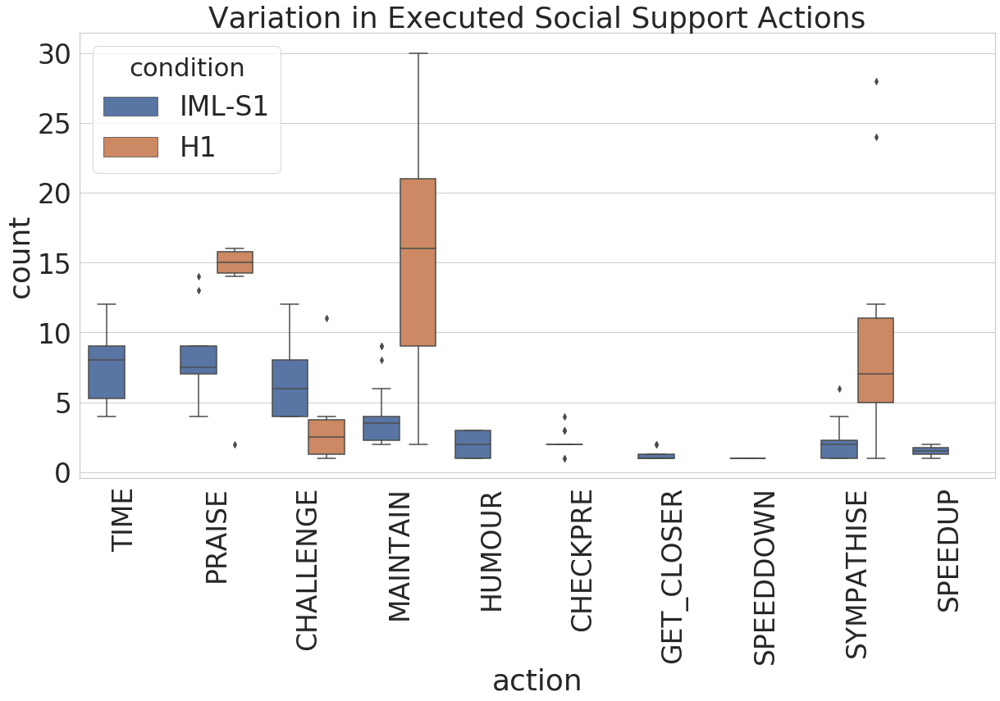

In [219]:
#not sure whether to normalise or not...?
value_count = phase1_df.groupby(['user_id','session_number','condition'])['action'].value_counts(normalize=False)
value_count = value_count.reset_index(name='count')

#value_count['action']=value_count['action'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CU" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))
ax = sns.boxplot(x="action", y='count', hue='condition', data=value_count)
ax.set_title("Variation in Executed Social Support Actions")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


In [236]:
# Chi-Square for overall IML-S1 vs H1 (as overall action numbers (sample size) large enough for Chi-Square to be appropriate?)
phase1_actionstyle_counts = pd.read_csv('phase1_actions.csv', names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])

phase1_actionstyle_counts ['animation-positive'] = phase1_actionstyle_counts['animation-positive'].astype(int)
phase1_actionstyle_counts ['checkpre-sympathetic'] = phase1_actionstyle_counts ['checkpre-sympathetic'].astype(int)
phase1_actionstyle_counts ['getcloser-challenging'] = phase1_actionstyle_counts ['getcloser-challenging'].astype(int)
phase1_actionstyle_counts ['performance-positive'] = phase1_actionstyle_counts ['performance-positive'].astype(int)
phase1_actionstyle_counts ['reward-positive'] = phase1_actionstyle_counts ['reward-positive'].astype(int)
phase1_actionstyle_counts ['reward-sympathetic'] =phase1_actionstyle_counts ['reward-sympathetic'].astype(int)
phase1_actionstyle_counts ['social-challenging'] = phase1_actionstyle_counts ['social-challenging'].astype(int)
phase1_actionstyle_counts ['social-positive'] = phase1_actionstyle_counts ['social-positive'].astype(int)
phase1_actionstyle_counts ['social-sympathetic'] = phase1_actionstyle_counts ['social-sympathetic'].astype(int)
phase1_actionstyle_counts ['time-challenging'] =phase1_actionstyle_counts ['time-challenging'].astype(int)
phase1_actionstyle_counts ['time-positive'] = phase1_actionstyle_counts ['time-positive'].astype(int)
phase1_actionstyle_counts ['time-sympathetic'] = phase1_actionstyle_counts ['time-sympathetic'].astype(int)
phase1_actionstyle_counts ['walk-challenging'] = phase1_actionstyle_counts ['walk-challenging'].astype(int)
phase1_actionstyle_counts ['walk-positive'] = phase1_actionstyle_counts ['walk-positive'].astype(int)
phase1_actionstyle_counts ['walk-sympathetic'] = phase1_actionstyle_counts ['walk-sympathetic'].astype(int)
phase1_actionstyle_counts ['walk-neutral'] = phase1_actionstyle_counts ['walk-neutral'].astype(int)
phase1_actionstyle_counts ['run-challenging'] = phase1_actionstyle_counts ['run-challenging'].astype(int)
phase1_actionstyle_counts ['run-positive'] = phase1_actionstyle_counts ['run-positive'].astype(int)
phase1_actionstyle_counts ['run-sympathetic'] = phase1_actionstyle_counts ['run-sympathetic'].astype(int)
phase1_actionstyle_counts ['run-neutral'] = phase1_actionstyle_counts ['run-neutral'].astype(int)

phase1_actionstyle_counts.drop(['animation-positive'], axis=1)
phase1_actionstyle_counts.set_index("condition", inplace=True)

# table = [phase1_actionstyle_counts.loc['H1'].tolist(),phase1_actionstyle_counts.loc['IML-S1'].tolist()]

# from scipy.stats import chi2_contingency
# from scipy.stats import chi2

# stat, p, dof, expected = chi2_contingency(table)
# print('dof=%d' % dof)
# print(expected)

# Chi-sqaured doesn't work because: 'The internally computed table of expected frequencies has a zero element at (0, 0)'

# Fisher's exact also doesn't work because problem too large... so maybe participant by participant breakdown is better after all 

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([phase1_actionstyle_counts.loc['H1'].tolist(),phase1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

R[write to console]: Error in (function (x, y = NULL, workspace = 2e+05, hybrid = FALSE, control = list(),  : 
  FEXACT error 7.
LDSTP is too small for this problem.
Try increasing the size of the workspace.



RRuntimeError: Error in (function (x, y = NULL, workspace = 2e+05, hybrid = FALSE, control = list(),  : 
  FEXACT error 7.
LDSTP is too small for this problem.
Try increasing the size of the workspace.


In [347]:
# try doing it per participant <-- THIS WORKS !  

#H1_actions.groupby(['user_id','action_type'])['style'].value_counts()

DB1_actionstyle_counts = pd.read_csv('DB_phase1_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#DB1_actionstyle_counts .drop(['animation-positive'], axis=1)
DB1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),DB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.2764174704264417e-21


In [348]:
IMLS1_actions.groupby(['user_id','action_type'])['style'].value_counts()

DP1_actionstyle_counts = pd.read_csv('DP_phase1_actions.csv', skiprows=1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#DP1_actionstyle_counts .drop(['animation-positive'], axis=1)
DP1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([DP1_actionstyle_counts.loc['H1'].tolist(),DP1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 2.886416265991122e-32


In [349]:
IMLS1_actions.groupby(['user_id','action_type'])['style'].value_counts()

FB1_actionstyle_counts = pd.read_csv('FB_phase1_actions.csv', skiprows=1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#FB1_actionstyle_counts .drop(['animation-positive'], axis=1)
FB1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),FB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 2.8904148045641314e-23


In [350]:
#IMLS1_actions.groupby(['user_id','action_type'])['style'].value_counts()

GB1_actionstyle_counts = pd.read_csv('GB_phase1_actions.csv', skiprows=1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#GB1_actionstyle_counts .drop(['animation-positive'], axis=1)
GB1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([GB1_actionstyle_counts.loc['H1'].tolist(),GB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 6.940697131450025e-23


In [351]:
#H1_actions.groupby(['user_id','action_type'])['style'].value_counts()

JF1_actionstyle_counts = pd.read_csv('JF_phase1_actions.csv', skiprows=1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#JF1_actionstyle_counts .drop(['animation-positive'], axis=1)
JF1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),JF1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 2.612226679522896e-29


In [352]:
IMLS1_actions.groupby(['user_id','action_type'])['style'].value_counts()

JW1_actionstyle_counts = pd.read_csv('JW_phase1_actions.csv', skiprows=1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#JW1_actionstyle_counts .drop(['animation-positive'], axis=1)
JW1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([JW1_actionstyle_counts.loc['H1'].tolist(),JW1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.0773958981611606e-19


In [353]:
#H1_actions.groupby(['user_id','action_type'])['style'].value_counts()

LB1_actionstyle_counts = pd.read_csv('LB_phase1_actions.csv', skiprows=1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#LB1_actionstyle_counts .drop(['animation-positive'], axis=1)
LB1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),LB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 9.542127393860498e-20


In [354]:
IMLS1_actions.groupby(['user_id','action_type'])['style'].value_counts()

MR1_actionstyle_counts = pd.read_csv('MR_phase1_actions.csv', skiprows=1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#MR1_actionstyle_counts .drop(['animation-positive'], axis=1)
MR1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([MR1_actionstyle_counts.loc['H1'].tolist(),MR1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 2.776047766879907e-12


In [355]:
IMLS1_actions.groupby(['user_id','action_type'])['style'].value_counts()

PT1_actionstyle_counts = pd.read_csv('PT_phase1_actions.csv', skiprows=1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic','walk-challenging','walk-positive','walk-sympathetic','walk-neutral','run-challenging','run-positive','run-sympathetic','run-neutral'])
#PT1_actionstyle_counts .drop(['animation-positive'], axis=1)
PT1_actionstyle_counts.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([PT1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 6.785266506654575e-22


## Personalisation of actions and styles - Phase 1

Text(0.5, 1.0, 'Style of Actions Executed Across Selected H1 Sessions')

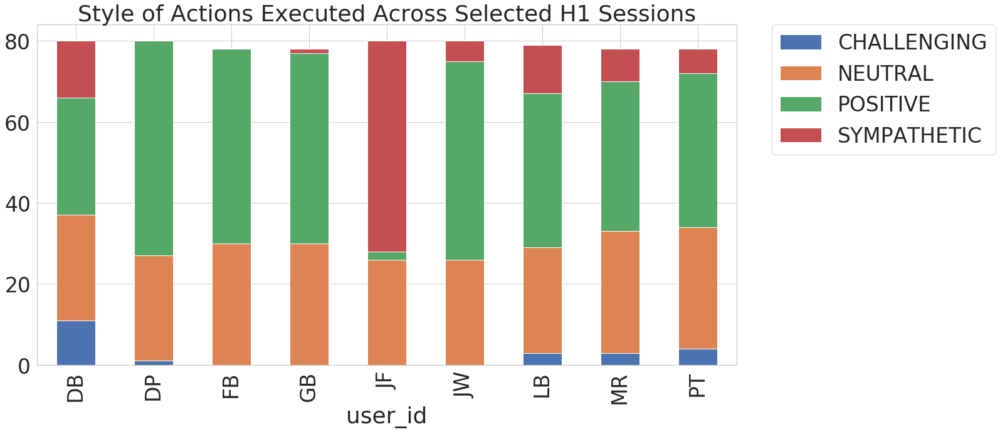

In [237]:
#H1_actions["user_id"].value_counts()

plt = H1_actions.groupby(["user_id"])["style"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Style of Actions Executed Across Selected H1 Sessions")

Text(0.5, 1.0, 'Style of Actions Executed Across H1 Sessions')

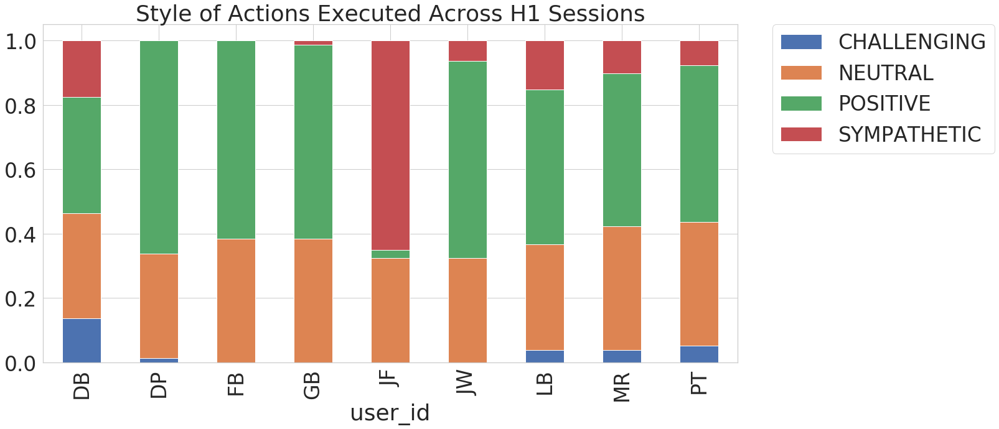

In [132]:
plt = H1_actions.groupby(["user_id"])["style"].value_counts(normalize=True).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Style of Actions Executed Across H1 Sessions")

Text(0.5, 1.0, 'Social Support Action Types Executed Across H1 Sessions')

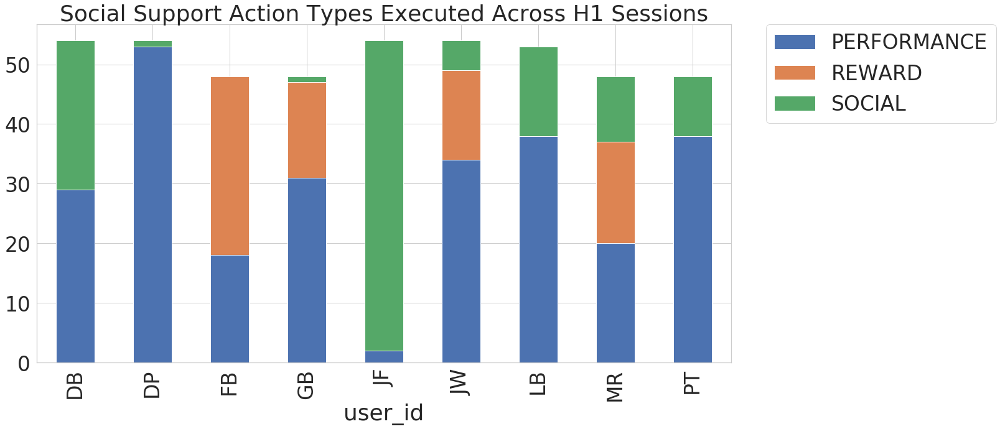

In [238]:
# drop run/walk for action comparisons
indexNames = H1_actions[H1_actions['action'] == 'RUN'].index
H1_actions.drop(indexNames , inplace=True)

indexNames = H1_actions[H1_actions['action'] == 'WALK'].index
H1_actions.drop(indexNames , inplace=True)

plt = H1_actions.groupby(["user_id"])["action_type"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Social Support Action Types Executed Across H1 Sessions")

Text(0.5, 1.0, 'Total Actions Executed Across Selected H1 Sessions')

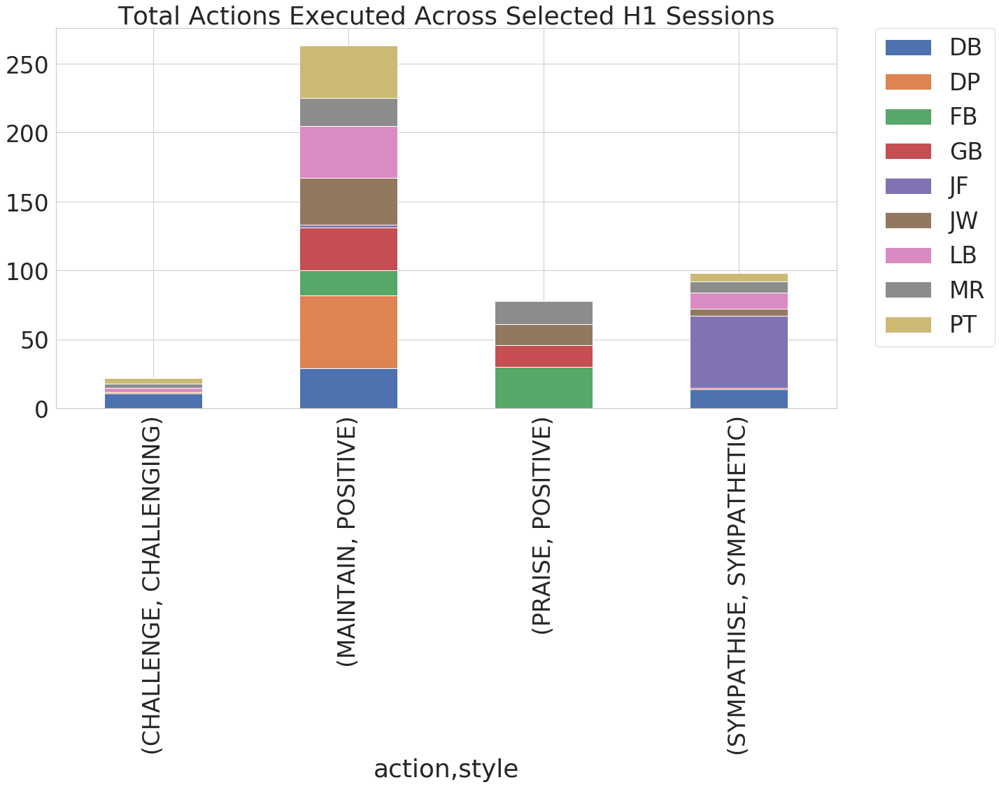

In [239]:
plt = H1_actions.groupby(["action","style"])["user_id"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed Across Selected H1 Sessions")

Text(0.5, 1.0, 'Total Actions Executed Across Selected H1 Sessions - Normalised')

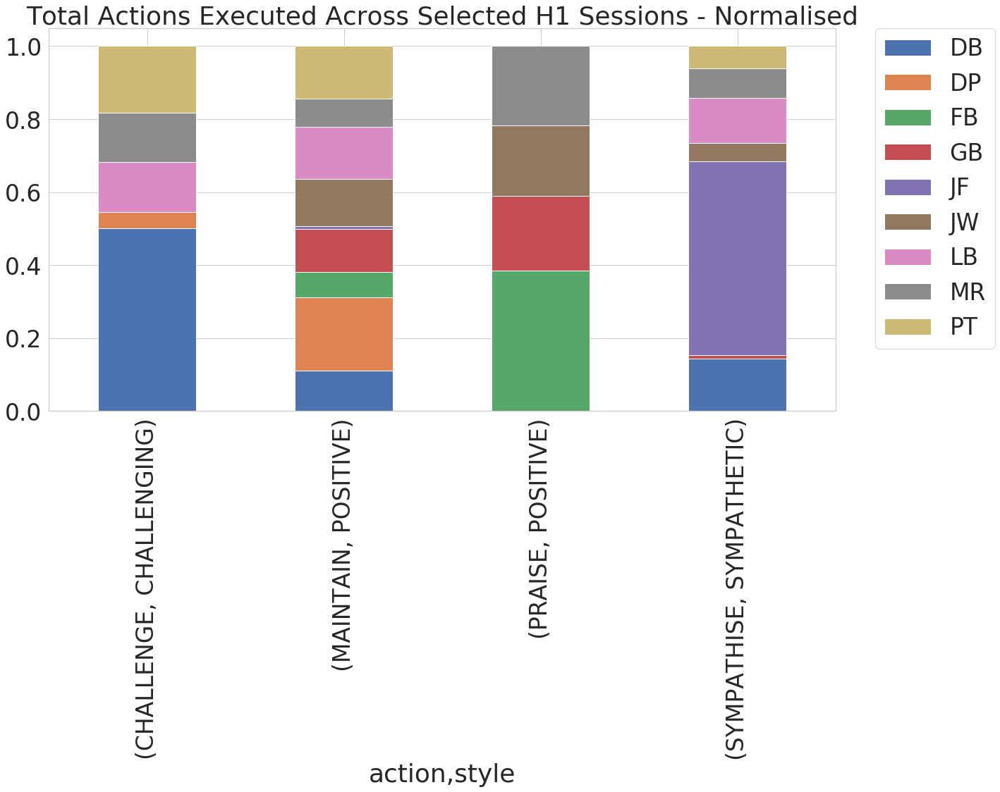

In [240]:
plt = H1_actions.groupby(["action","style"])["user_id"].value_counts(normalize=True).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed Across Selected H1 Sessions - Normalised")

In [248]:
# Fisher's test for personalisation (heuristic behaviour)

# User LB

# m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),FB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),DB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),JF1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),MR1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),DP1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),DP1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),JW1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),GB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 0.0017068332612124584


In [256]:
# User FB

# m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),DB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),JF1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),MR1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),DP1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),JW1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),JW1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),GB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 2.228555803512189e-11


In [262]:
# User DB

# m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),JF1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),MR1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),DP1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),JW1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),GB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.09548077086044203


In [269]:
# User JF 

# m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),MR1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),DP1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),JW1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),GB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 3.740967111582257e-18


In [273]:
# User MR

# m = np.array([MR1_actionstyle_counts.loc['H1'].tolist(),DP1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([MR1_actionstyle_counts.loc['H1'].tolist(),JW1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([MR1_actionstyle_counts.loc['H1'].tolist(),GB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 4.5617264355676733e-05


In [276]:
# User DP

# m = np.array([DP1_actionstyle_counts.loc['H1'].tolist(),JW1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

# m = np.array([DP1_actionstyle_counts.loc['H1'].tolist(),GB1_actionstyle_counts.loc['H1'].tolist()])
# res = stats.fisher_test(m,workspace = 2e8)
# print('p-value: {}'.format(res[0][0]))

m = np.array([DP1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.2094483392788567e-05
p-value: 0.02534377301157085


In [277]:
# User JW 

m = np.array([JW1_actionstyle_counts.loc['H1'].tolist(),GB1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.5764502619169042
p-value: 0.00029397138627635397


In [278]:
# User GB

m = np.array([GB1_actionstyle_counts.loc['H1'].tolist(),PT1_actionstyle_counts.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 2.4141487811495948e-05


In [425]:
# Fisher's test for personalisation (supervised behaviour)

# User LB

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),FB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),DB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),JF1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),MR1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),DP1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),JW1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),GB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 0.7862244088943944
p-value: 0.9424654650792939
p-value: 0.6689539706993332
p-value: 0.2851174425601136
p-value: 0.9265575841186138
p-value: 0.8948580570069368
p-value: 0.9366610471484658
p-value: 0.5123149454138288


In [426]:
# User FB

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),DB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),JF1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),MR1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),DP1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),JW1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),GB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 0.987324493981119
p-value: 0.8755601285741628
p-value: 0.27416209822136894
p-value: 0.6866104208034421
p-value: 0.9658438808394938
p-value: 0.9899136906228618
p-value: 0.6550311471777147


In [428]:
# User DB

m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),JF1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),MR1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),DP1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),JW1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),GB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 0.8880997087616865
p-value: 0.461669264110531
p-value: 0.837529900012813
p-value: 0.9984397770447246
p-value: 0.9717798514685394
p-value: 0.7576808228238464


In [429]:
# User JF

m = np.array([JF1_actionstyle_counts.loc['IML-S1'].tolist(),MR1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['IML-S1'].tolist(),DP1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['IML-S1'].tolist(),JW1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['IML-S1'].tolist(),GB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['IML-S1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))


p-value: 1.0
p-value: 0.26956762462746103
p-value: 0.7650005427237485
p-value: 0.8379331037010771
p-value: 0.5513698980384952
p-value: 0.8438959502740317


In [432]:
# User MR

m = np.array([MR1_actionstyle_counts.loc['IML-S1'].tolist(),DP1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['IML-S1'].tolist(),JW1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['IML-S1'].tolist(),GB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['IML-S1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.06975973010546996
p-value: 0.2217608025236858
p-value: 0.3075592763394268
p-value: 0.607339364661427


In [433]:
# User DP

m = np.array([DP1_actionstyle_counts.loc['IML-S1'].tolist(),JW1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP1_actionstyle_counts.loc['IML-S1'].tolist(),GB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP1_actionstyle_counts.loc['IML-S1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.0
p-value: 0.7729932659840658
p-value: 0.7348365182616919
p-value: 0.4501588570481331


In [434]:
# User JW

m = np.array([JW1_actionstyle_counts.loc['IML-S1'].tolist(),GB1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW1_actionstyle_counts.loc['IML-S1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.9126872863481568
p-value: 0.5015732695613936


In [436]:
# User GB

m = np.array([GB1_actionstyle_counts.loc['IML-S1'].tolist(),PT1_actionstyle_counts.loc['IML-S1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.3513995973954064


## Similarity in actions and styles - Phase 2/3

Text(0.5, 1.0, 'Total Action Styles Executed in IML-S2 vs H2 Sessions')

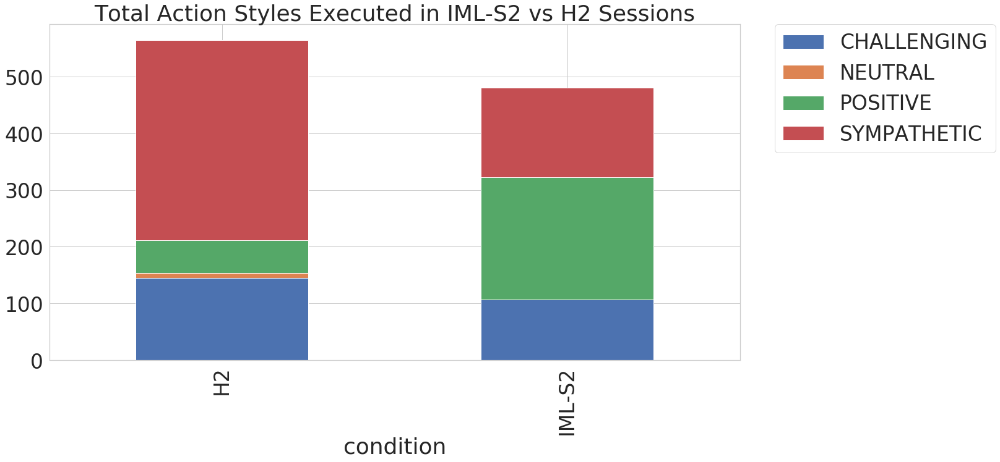

In [302]:
#H2_IMLS2_df.groupby(['user_id'])['session_number'].value_counts()

plt = H2_IMLS2_df.groupby(["condition"])["style"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Action Styles Executed in IML-S2 vs H2 Sessions")

Text(0.5, 1.0, 'Variation in Executed Styles')

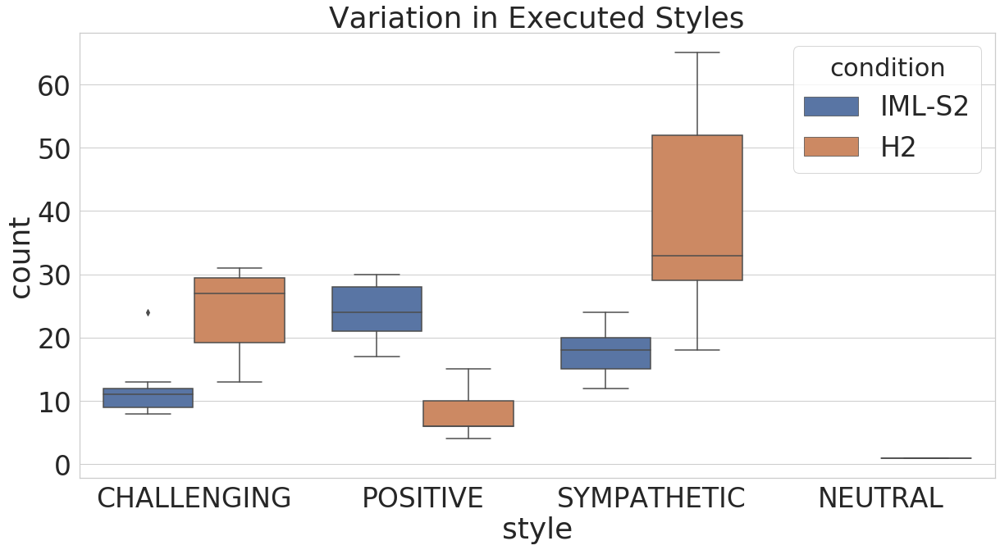

In [303]:
value_count = H2_IMLS2_df.groupby(['user_id','session_number','condition'])['style'].value_counts(normalize=False)
value_count = value_count.reset_index(name='count')

ax = sns.boxplot(x="style", y='count', hue='condition', data=value_count)
ax.set_title("Variation in Executed Styles")

Text(0.5, 1.0, 'Social Supporting Actions Executed in IML-S2 vs H2 Sessions')

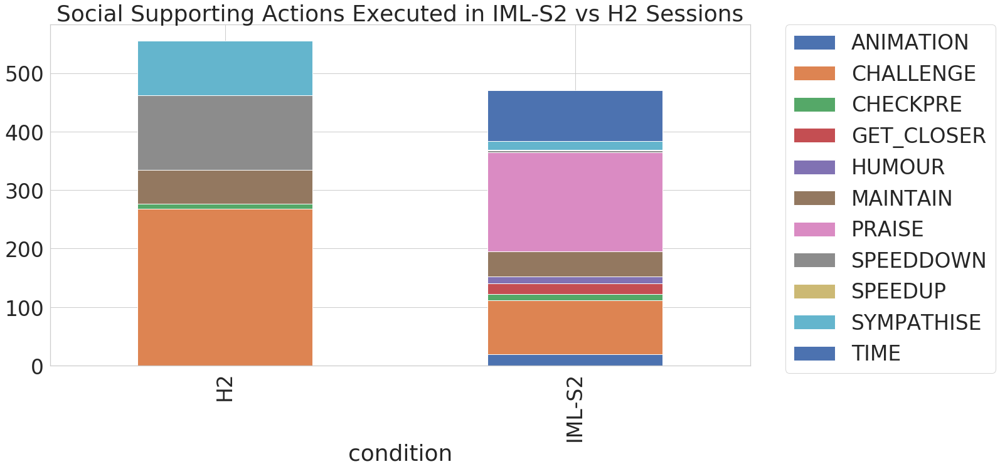

In [22]:
# drop run and walk when looking at overall actions
indexNames = H2_IMLS2_df[H2_IMLS2_df['action'] == 'RUN'].index
H2_IMLS2_df.drop(indexNames , inplace=True)

indexNames = H2_IMLS2_df[H2_IMLS2_df['action'] == 'WALK'].index
H2_IMLS2_df.drop(indexNames , inplace=True)

plt = H2_IMLS2_df.groupby(["condition"])["action"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Social Supporting Actions Executed in IML-S2 vs H2 Sessions")

[Text(0, 0, 'PRAISE'),
 Text(0, 0, 'TIME'),
 Text(0, 0, 'CHALLENGE'),
 Text(0, 0, 'GET_CLOSER'),
 Text(0, 0, 'HUMOUR'),
 Text(0, 0, 'MAINTAIN'),
 Text(0, 0, 'SYMPATHISE'),
 Text(0, 0, 'ANIMATION'),
 Text(0, 0, 'CHECKPRE'),
 Text(0, 0, 'SPEEDDOWN'),
 Text(0, 0, 'SPEEDUP')]

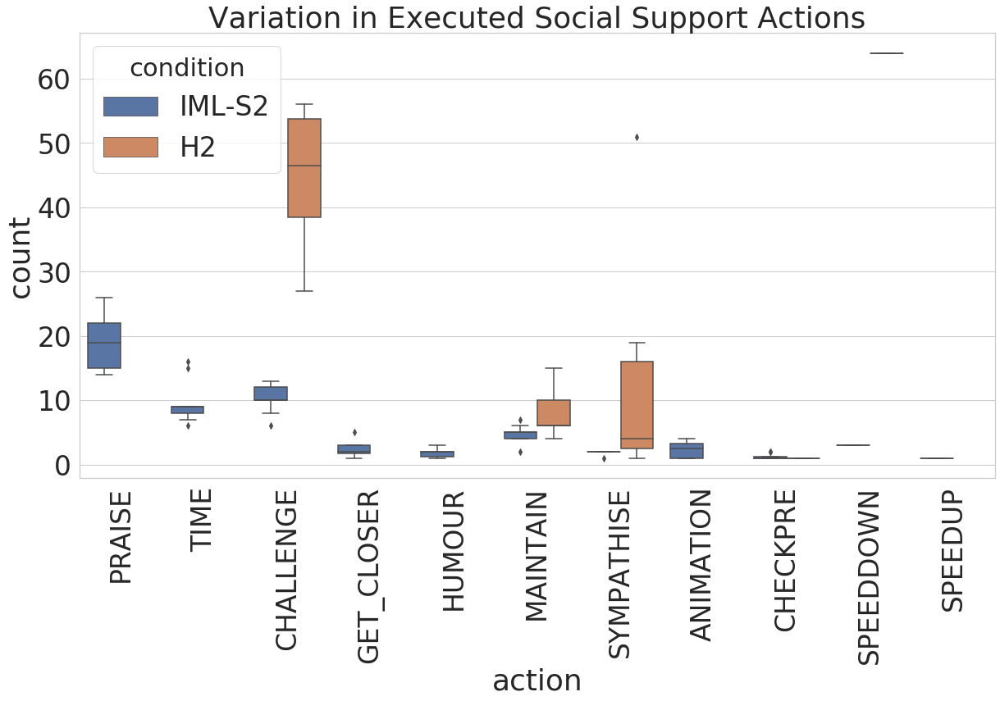

In [23]:
#not sure whether to normalise or not...?
value_count = H2_IMLS2_df.groupby(['user_id','session_number','condition'])['action'].value_counts(normalize=False)
value_count = value_count.reset_index(name='count')

#value_count['action']=value_count['action'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CU" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))
ax = sns.boxplot(x="action", y='count', hue='condition', data=value_count)
ax.set_title("Variation in Executed Social Support Actions")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


In [399]:
## try doing it per participant <-- THIS WORKS !  
# drop all run/walks for these bits (as that element not comparable)

IMLA_actions.groupby(['user_id','action_type'])['style'].value_counts()

DB2_actionstyle_counts = pd.read_csv('DB_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
DB2_actionstyle_counts.set_index("condition", inplace=True)

#DB2_actionstyle_counts

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([DB2_actionstyle_counts.loc['H2'].tolist(),DB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB2_actionstyle_counts.loc['H2'].tolist(),DB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB2_actionstyle_counts.loc['IML-S2'].tolist(),DB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.7338237755663362e-13
p-value: 1.526729431859445e-09
p-value: 0.0003276554857750613


In [337]:
DP2_actionstyle_counts = pd.read_csv('DP_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
DP2_actionstyle_counts.set_index("condition", inplace=True)


import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([DP2_actionstyle_counts.loc['H2'].tolist(),DP2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP2_actionstyle_counts.loc['H2'].tolist(),DP2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP2_actionstyle_counts.loc['IML-S2'].tolist(),DP2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 2.1734068389136766e-35
p-value: 3.3513903079990517e-34
p-value: 0.9061825738974691


In [340]:
LB2_actionstyle_counts = pd.read_csv('LB_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
LB2_actionstyle_counts.set_index("condition", inplace=True)


import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),LB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),LB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),LB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 7.497145666716136e-10
p-value: 4.815322211105594e-10
p-value: 0.8028133041551355


In [341]:
FB2_actionstyle_counts = pd.read_csv('FB_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
FB2_actionstyle_counts.set_index("condition", inplace=True)


import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),FB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),FB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB2_actionstyle_counts.loc['IML-S2'].tolist(),FB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.0142090379821034e-10
p-value: 8.142148317555798e-18
p-value: 0.029266889601519498


In [342]:
JF2_actionstyle_counts = pd.read_csv('JF_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
JF2_actionstyle_counts.set_index("condition", inplace=True)


import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),JF2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),JF2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['IML-S2'].tolist(),JF2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 3.5765038065332766e-12
p-value: 2.458409112544975e-12
p-value: 0.3300635143040683


In [343]:
MR2_actionstyle_counts = pd.read_csv('MR_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
MR2_actionstyle_counts.set_index("condition", inplace=True)


import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([MR2_actionstyle_counts.loc['H2'].tolist(),MR2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR2_actionstyle_counts.loc['H2'].tolist(),MR2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR2_actionstyle_counts.loc['IML-S2'].tolist(),MR2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 5.712324728067396e-13
p-value: 2.5361738114757188e-11
p-value: 0.5812491274080489


In [344]:
JW2_actionstyle_counts = pd.read_csv('JW_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
JW2_actionstyle_counts.set_index("condition", inplace=True)


import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([JW2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW2_actionstyle_counts.loc['IML-S2'].tolist(),JW2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 8.940976728961181e-16
p-value: 1.2596687121713502e-11
p-value: 0.7756050803144109


In [345]:
GB2_actionstyle_counts = pd.read_csv('GB_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
GB2_actionstyle_counts.set_index("condition", inplace=True)


import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([GB2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([GB2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([GB2_actionstyle_counts.loc['IML-S2'].tolist(),GB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 5.268499170625792e-34
p-value: 6.7027806159981035e-34
p-value: 0.24562553430311526


In [346]:
PT2_actionstyle_counts = pd.read_csv('PT_phase2-3_actions.csv', skiprows = 1, names=['condition','animation-positive','checkpre-sympathetic','getcloser-challenging','performance-positive','performance-challenging','performance-sympathetic','reward-positive','reward-sympathetic','social-challenging','social-positive','social-sympathetic','time-challenging','time-positive','time-sympathetic'])
PT2_actionstyle_counts.set_index("condition", inplace=True)


import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([PT2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([PT2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([PT2_actionstyle_counts.loc['IML-S2'].tolist(),PT2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 9.265771618687517e-15
p-value: 9.253400249247058e-12
p-value: 0.10729374672388467


In [384]:
m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),DB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),DB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),DB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['IML-S1'].tolist(),DB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),DB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB1_actionstyle_counts.loc['H1'].tolist(),DB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.34198380917928556
p-value: 4.840175011274508e-06
p-value: 6.175534060516831e-11
p-value: 0.39682485695942366
p-value: 1.1294792519520329e-08
p-value: 1.9188414300317642e-15


In [385]:
m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),LB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),LB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),LB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['IML-S1'].tolist(),LB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),LB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB1_actionstyle_counts.loc['H1'].tolist(),LB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.7036790831134594
p-value: 3.02602584939414e-21
p-value: 1.0787983775733364e-11
p-value: 0.10555396707561934
p-value: 1.4900709682146899e-08
p-value: 2.6724520703732273e-08


In [389]:
m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),FB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),FB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),FB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['IML-S1'].tolist(),FB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),FB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB1_actionstyle_counts.loc['H1'].tolist(),FB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.6544421392974953
p-value: 1.0604959227207069e-21
p-value: 3.914271633232617e-12
p-value: 0.0010060765822172686
p-value: 7.39792478615546e-05
p-value: 4.636770033502918e-08


In [392]:
m = np.array([JF1_actionstyle_counts.loc['IML-S1'].tolist(),JF2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),JF2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['IML-S1'].tolist(),JF2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['IML-S1'].tolist(),JF2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),JF2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF1_actionstyle_counts.loc['H1'].tolist(),JF2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.8160586285979229
p-value: 4.037738897002567e-10
p-value: 2.1445421962416479e-13
p-value: 0.015711578860262813
p-value: 4.172743766483132e-14
p-value: 1.9708611528184891e-19


In [393]:
m = np.array([MR1_actionstyle_counts.loc['IML-S1'].tolist(),MR2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['H1'].tolist(),MR2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['IML-S1'].tolist(),MR2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['IML-S1'].tolist(),MR2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['H1'].tolist(),MR2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR1_actionstyle_counts.loc['H1'].tolist(),MR2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.0007796205518116319
p-value: 2.6451826158913663e-12
p-value: 1.2702444124606981e-11
p-value: 0.02707147798556799
p-value: 7.768219633427318e-06
p-value: 1.204557635769673e-05


In [394]:
m = np.array([DP1_actionstyle_counts.loc['IML-S1'].tolist(),DP2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP1_actionstyle_counts.loc['H1'].tolist(),DP2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP1_actionstyle_counts.loc['IML-S1'].tolist(),DP2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP1_actionstyle_counts.loc['IML-S1'].tolist(),DP2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP1_actionstyle_counts.loc['H1'].tolist(),DP2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP1_actionstyle_counts.loc['H1'].tolist(),DP2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.01450961825612263
p-value: 6.830707208014299e-35
p-value: 3.189607901895633e-35
p-value: 0.0005132744858685394
p-value: 4.5346492746960735e-24
p-value: 7.616459402746756e-25


In [396]:
m = np.array([JW1_actionstyle_counts.loc['IML-S1'].tolist(),JW2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW1_actionstyle_counts.loc['H1'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW1_actionstyle_counts.loc['IML-S1'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW1_actionstyle_counts.loc['IML-S1'].tolist(),JW2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW1_actionstyle_counts.loc['H1'].tolist(),JW2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW1_actionstyle_counts.loc['H1'].tolist(),JW2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.5293517362798303
p-value: 3.180874701719608e-16
p-value: 7.184648184790748e-19
p-value: 0.07028754409483355
p-value: 1.639246972139131e-10
p-value: 2.2983814503605095e-10


In [397]:
m = np.array([GB1_actionstyle_counts.loc['IML-S1'].tolist(),GB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([GB1_actionstyle_counts.loc['H1'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([GB1_actionstyle_counts.loc['IML-S1'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([GB1_actionstyle_counts.loc['IML-S1'].tolist(),GB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([GB1_actionstyle_counts.loc['H1'].tolist(),GB2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([GB1_actionstyle_counts.loc['H1'].tolist(),GB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.3312076692141541
p-value: 9.177659648485772e-33
p-value: 7.446590644802529e-35
p-value: 7.106393013383937e-05
p-value: 4.167185822312711e-08
p-value: 7.912607452006761e-09


In [398]:
m = np.array([PT1_actionstyle_counts.loc['IML-S1'].tolist(),PT2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([PT1_actionstyle_counts.loc['H1'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([PT1_actionstyle_counts.loc['IML-S1'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([PT1_actionstyle_counts.loc['IML-S1'].tolist(),PT2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([PT1_actionstyle_counts.loc['H1'].tolist(),PT2_actionstyle_counts.loc['IML-A'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([PT1_actionstyle_counts.loc['H1'].tolist(),PT2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.0315754529495869
p-value: 4.787295836987439e-12
p-value: 3.3714178746168814e-09
p-value: 0.0011545880230080868
p-value: 7.247424350847044e-14
p-value: 6.237586781619445e-15


Text(0.5, 1.0, 'Total Action Styles Executed in IML-A vs H2 Sessions')

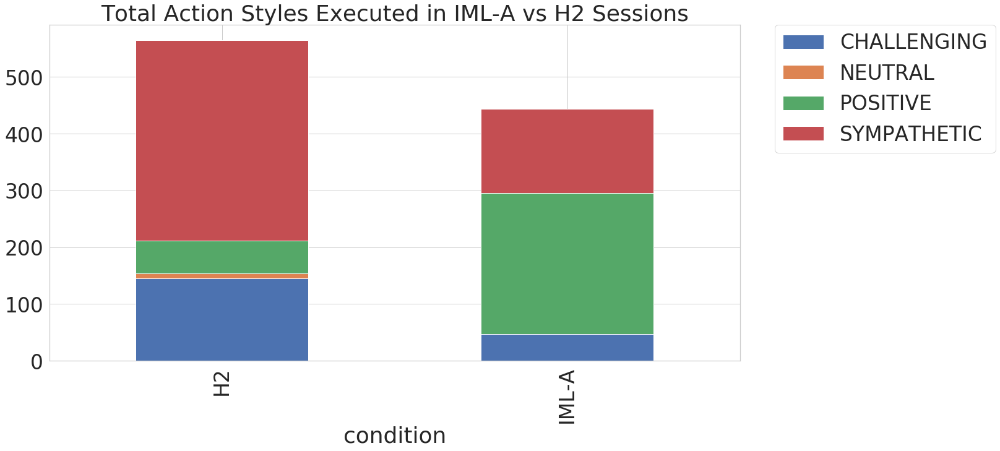

In [404]:
#H2_IMLA_df.groupby(['user_id'])['session_number'].value_counts()

plt = H2_IMLA_df.groupby(["condition"])["style"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Action Styles Executed in IML-A vs H2 Sessions")

Text(0.5, 1.0, 'Variation in Executed Styles')

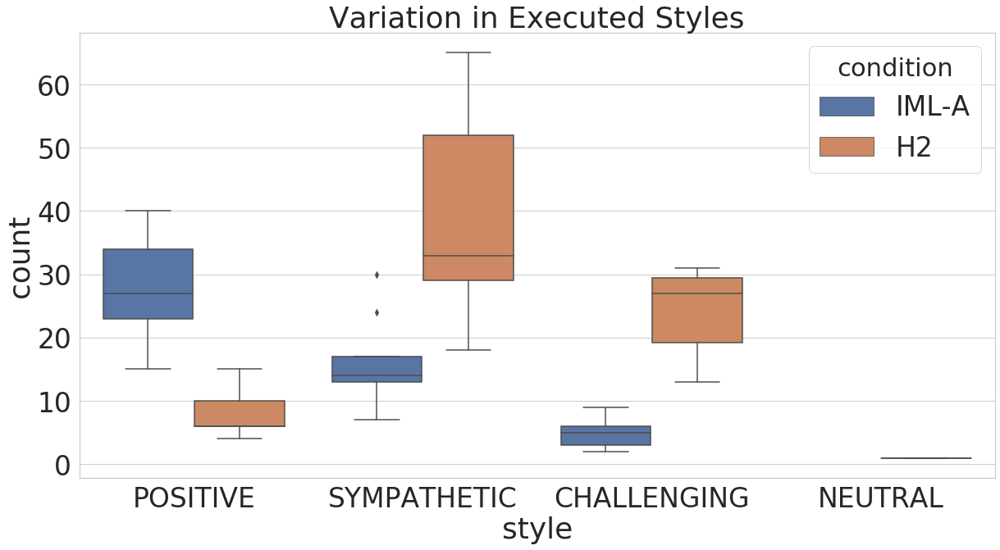

In [405]:
value_count = H2_IMLA_df.groupby(['user_id','session_number','condition'])['style'].value_counts(normalize=False)
value_count = value_count.reset_index(name='count')

ax = sns.boxplot(x="style", y='count', hue='condition', data=value_count)
ax.set_title("Variation in Executed Styles")

Text(0.5, 1.0, 'Social Supporting Actions Executed in IML-A vs H2 Sessions')

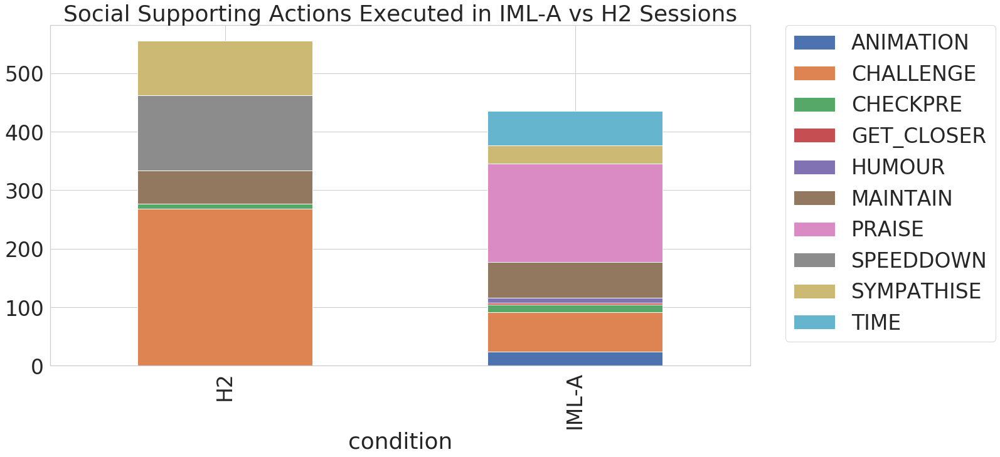

In [24]:
# drop run and walk when looking at overall actions
indexNames = H2_IMLA_df[H2_IMLA_df['action'] == 'RUN'].index
H2_IMLA_df.drop(indexNames , inplace=True)

indexNames = H2_IMLA_df[H2_IMLA_df['action'] == 'WALK'].index
H2_IMLA_df.drop(indexNames , inplace=True)

plt = H2_IMLA_df.groupby(["condition"])["action"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Social Supporting Actions Executed in IML-A vs H2 Sessions")

[Text(0, 0, 'PRAISE'),
 Text(0, 0, 'CHALLENGE'),
 Text(0, 0, 'TIME'),
 Text(0, 0, 'MAINTAIN'),
 Text(0, 0, 'SYMPATHISE'),
 Text(0, 0, 'CHECKPRE'),
 Text(0, 0, 'ANIMATION'),
 Text(0, 0, 'HUMOUR'),
 Text(0, 0, 'SPEEDDOWN'),
 Text(0, 0, 'GET_CLOSER')]

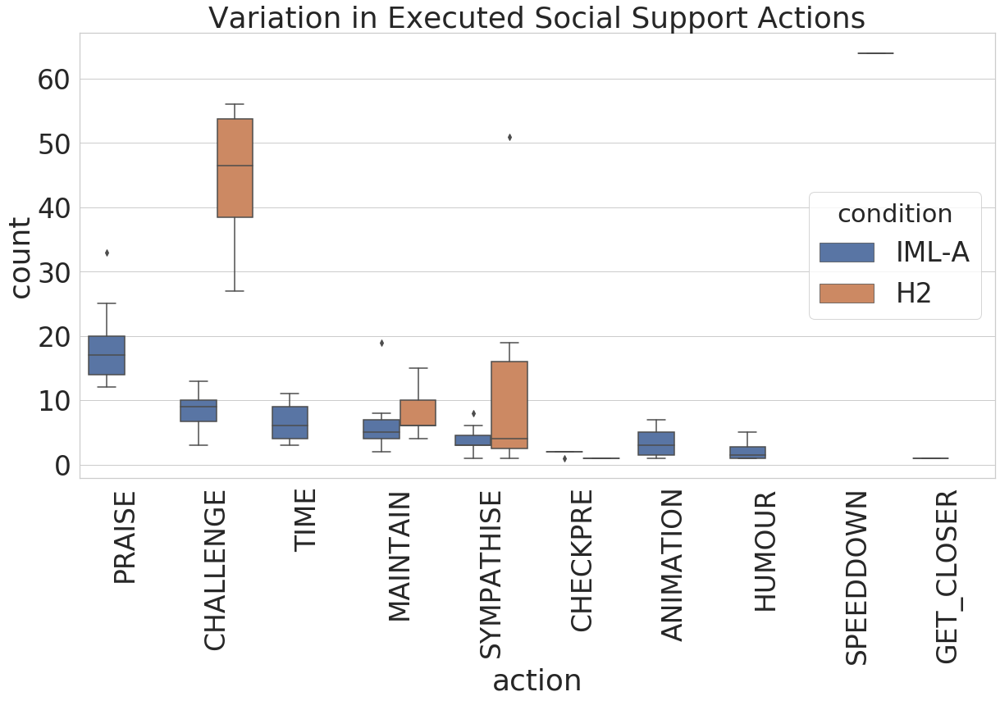

In [407]:
#not sure whether to normalise or not...?
value_count = H2_IMLA_df.groupby(['user_id','session_number','condition'])['action'].value_counts(normalize=False)
value_count = value_count.reset_index(name='count')

#value_count['action']=value_count['action'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CU" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))
ax = sns.boxplot(x="action", y='count', hue='condition', data=value_count)
ax.set_title("Variation in Executed Social Support Actions")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)


## Personalisation of actions and styles - Phase 2

Text(0.5, 1.0, 'Style of Actions Executed Across Selected H2 Sessions')

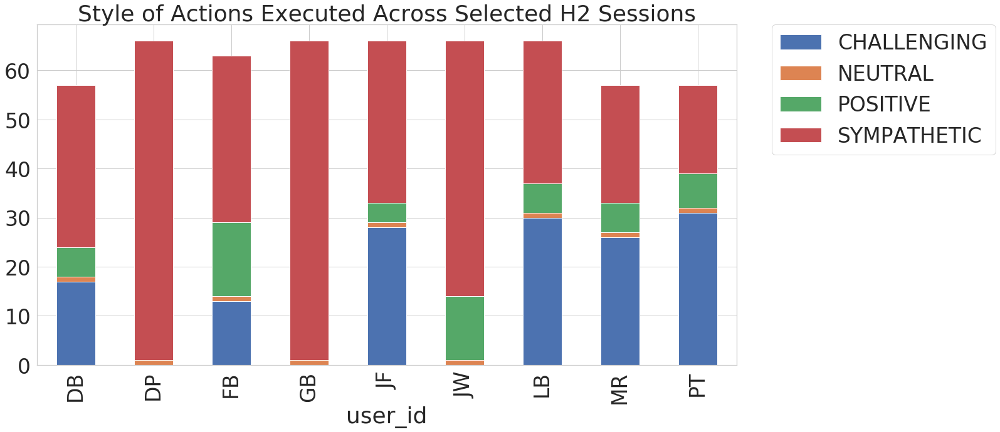

In [25]:
#H1_actions["user_id"].value_counts()

plt = H2_actions.groupby(["user_id"])["style"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Style of Actions Executed Across Selected H2 Sessions")

Text(0.5, 1.0, 'Social Support Action Types Executed Across H2 Sessions')

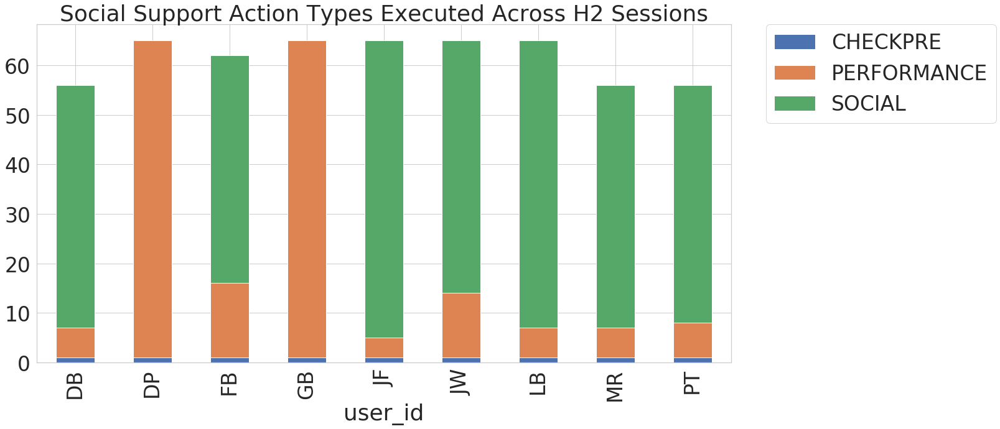

In [26]:
# drop run/walk for action comparisons
indexNames = H2_actions[H2_actions['action'] == 'RUN'].index
H2_actions.drop(indexNames , inplace=True)

indexNames = H2_actions[H2_actions['action'] == 'WALK'].index
H2_actions.drop(indexNames , inplace=True)

H2_actions['action_type']=H2_actions['action'].apply(lambda x: "TIME" if x == "Time" else ("SOCIAL" if x == "HUMOUR" else ("SOCIAL" if x == "CHALLENGE" else("SOCIAL" if x == "SYMPATHISE" else ("PERFORMANCE" if x == "MAINTAIN" else("PERFORMANCE" if x == "SPEEDUP" else ("PERFORMANCE" if x == "SPEEDDOWN" else ("REWARD" if x == "PRAISE" else x))))))))

plt = H2_actions.groupby(["user_id"])["action_type"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Social Support Action Types Executed Across H2 Sessions")

Text(0.5, 1.0, 'Total Actions Executed Across Selected H2 Sessions')

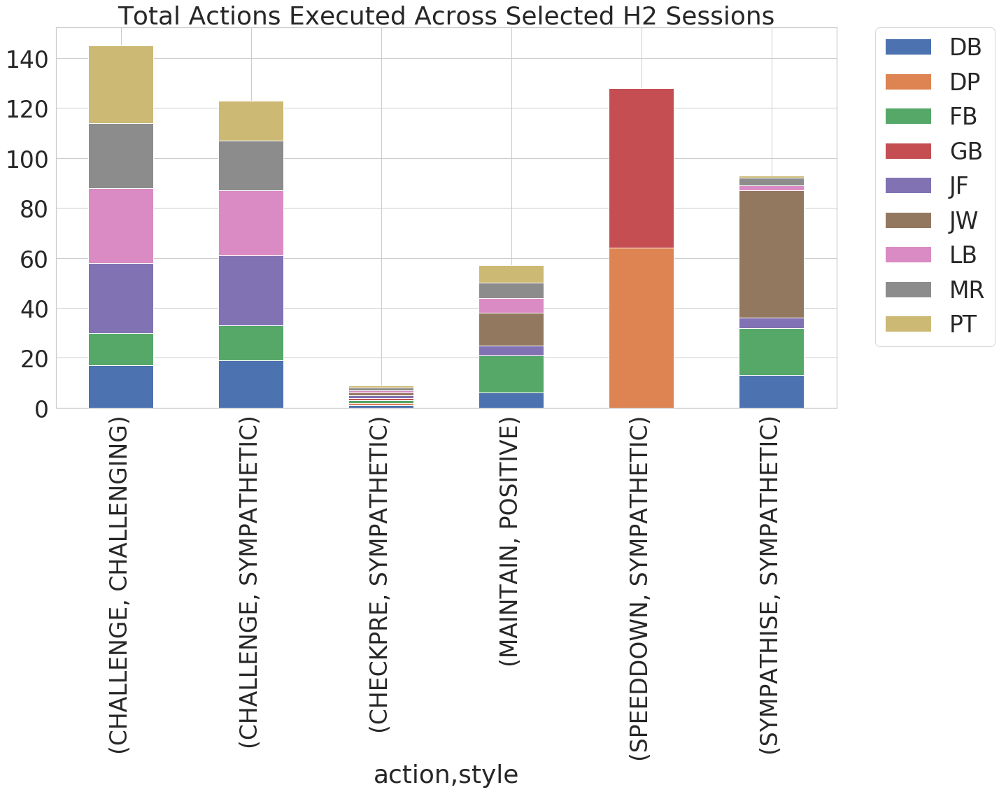

In [412]:
plt = H2_actions.groupby(["action","style"])["user_id"].value_counts(normalize=False).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed Across Selected H2 Sessions")

Text(0.5, 1.0, 'Total Actions Executed Across Selected H2 Sessions - Normalised')

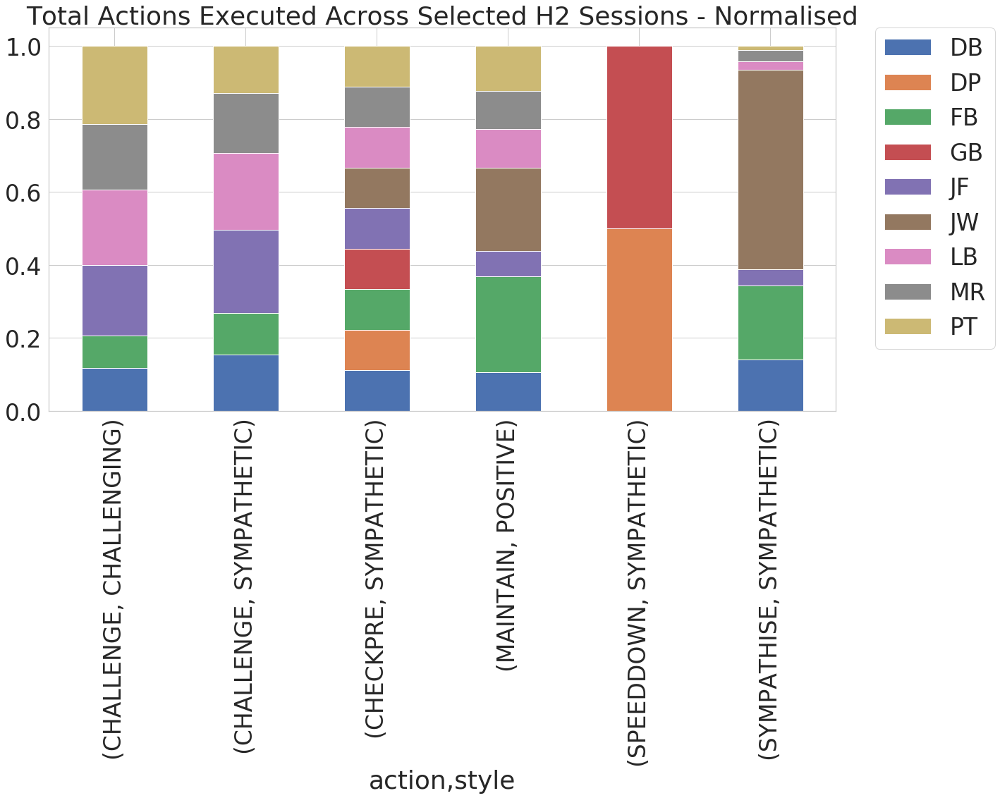

In [413]:
plt = H2_actions.groupby(["action","style"])["user_id"].value_counts(normalize=True).unstack().plot.bar(stacked=True) #, color=['tomato','teal','darkgreen','pink','indigo','wheat','lightblue','lightgreen','olive','orange','lavender','plum','purple'])
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.set_title("Total Actions Executed Across Selected H2 Sessions - Normalised")

In [416]:
# Fisher's test for personalisation (heuristic behaviour)

# User LB

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),FB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),DB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),JF2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),MR2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),DP2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.006479789190829516
p-value: 0.30093211175258
p-value: 0.85622958882539
p-value: 1.0
p-value: 4.207531181265731e-38
p-value: 4.7600257074575045e-11
p-value: 4.207531181265731e-38
p-value: 0.5300356454470434


In [415]:
# User FB

m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),DB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),JF2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),MR2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),DP2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([FB2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.1958569696916233
p-value: 0.004047421653864733
p-value: 0.012123370614109789
p-value: 1.7230841980420895e-37
p-value: 1.7230841980420895e-37
p-value: 8.479710992888806e-05
p-value: 1.7230841980420895e-37
p-value: 0.0007627296625232311


In [418]:
# User DB

m = np.array([DB2_actionstyle_counts.loc['H2'].tolist(),JF2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB2_actionstyle_counts.loc['H2'].tolist(),MR2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB2_actionstyle_counts.loc['H2'].tolist(),DP2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DB2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.4662339852790448
p-value: 0.27915005083987837
p-value: 1.4489378926091205e-35
p-value: 1.7137380589374044e-06
p-value: 1.4489378926091205e-35
p-value: 0.01813010647050264


In [419]:
# User JF

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),MR2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),DP2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.7554057100207918
p-value: 4.207531181265731e-38
p-value: 1.8089321165607443e-10
p-value: 4.207531181265731e-38
p-value: 0.130458574841589


In [ ]:
# User JF

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),MR2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),DP2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JF2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

In [420]:
# User MR

m = np.array([MR2_actionstyle_counts.loc['H2'].tolist(),DP2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([MR2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.4489378926091205e-35
p-value: 1.0116008523283022e-10
p-value: 1.4489378926091205e-35
p-value: 0.7491025915011554


In [421]:
# User DP

m = np.array([DP2_actionstyle_counts.loc['H2'].tolist(),JW2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([DP2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 4.207531181265731e-38
p-value: 1.0
p-value: 1.4489378926091205e-35


In [422]:
# User JW

m = np.array([JW2_actionstyle_counts.loc['H2'].tolist(),GB2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([JW2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 4.207531181265731e-38
p-value: 1.1145836225056728e-13


In [423]:
# User GB

m = np.array([GB2_actionstyle_counts.loc['H2'].tolist(),PT2_actionstyle_counts.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 1.4489378926091205e-35


In [482]:
# Fisher's test for personalisation (IMLS-2 behaviour to see if stronger than at imls-1?)

# User LB

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),FB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),DB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),JF2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),MR2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),DP2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),JW2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),GB2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

m = np.array([LB2_actionstyle_counts.loc['IML-S2'].tolist(),PT2_actionstyle_counts.loc['IML-S2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.9086290439333338
p-value: 0.5845943738480384
p-value: 0.9032559806451644
p-value: 0.4858055045806102
p-value: 0.7305444389332837
p-value: 0.9373679130493114
p-value: 0.9748348556458227
p-value: 0.41444812586320157


In [ ]:
# don't see point on carrying on with above, doesn't add anything to 'story'...

## Participant Evaluation

In [82]:
# phase1_evals = pd.read_csv('phase1_evals.csv', skiprows = 1, names=['user_id','performed better with','preferred','work with in future'])
# phase2_evals = pd.read_csv('phase2_evals.csv', skiprows = 1, names=['user_id','performed better with','preferred','work with in future'])

phase1_evals = pd.read_csv('phase1_evals2.csv', skiprows = 1, names=['question','answer'])
phase2_evals = pd.read_csv('phase2_evals2.csv', skiprows = 1, names=['question','answer'])

Text(0.5, 1.0, 'Phase 1 Within-Subject Participant Preferences')

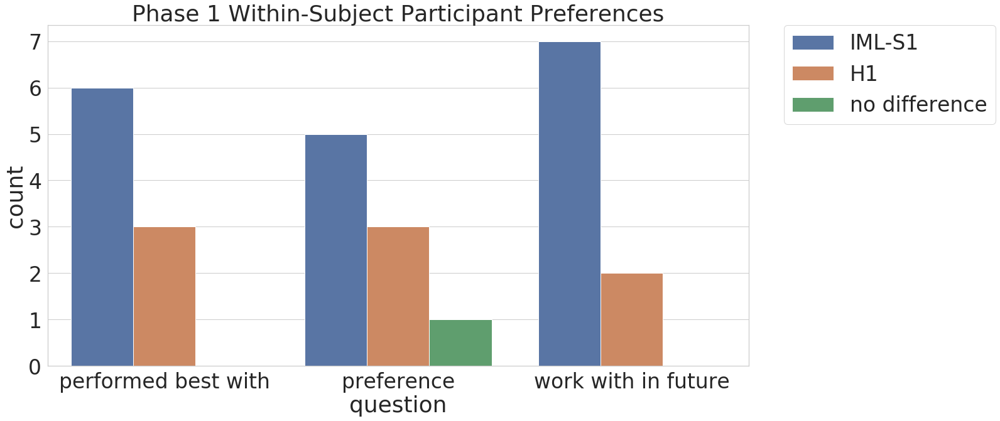

In [83]:
ax = sns.countplot(x='question',hue='answer',data=phase1_evals,hue_order=['IML-S1','H1','no preference'])
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Phase 1 Within-Subject Participant Preferences")

Text(0.5, 1.0, 'Phase 3 Within-Subject Participant Preferences')

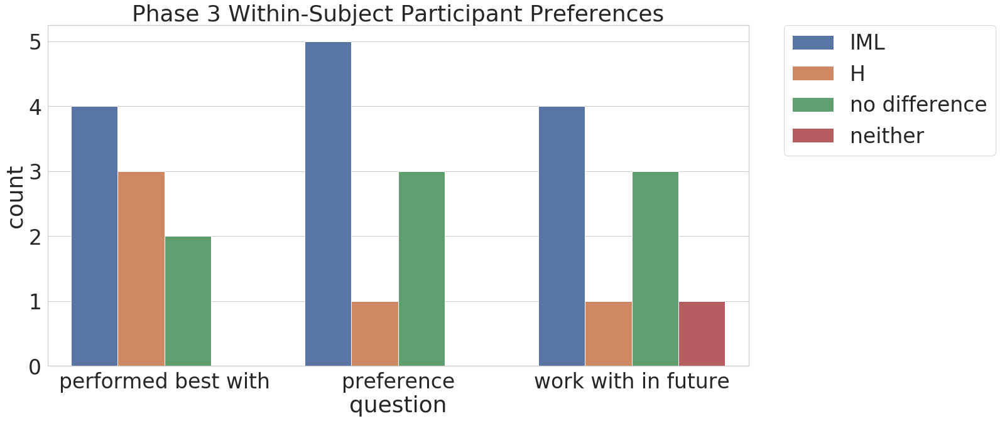

In [80]:
ax = sns.countplot(x='question',hue='answer',data=phase2_evals, hue_order=['IML','H','no preference','neither'])
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Phase 3 Within-Subject Participant Preferences")

Text(0.5, 1.0, 'Normalised Post-Session Evaluation Scores Across Condition')

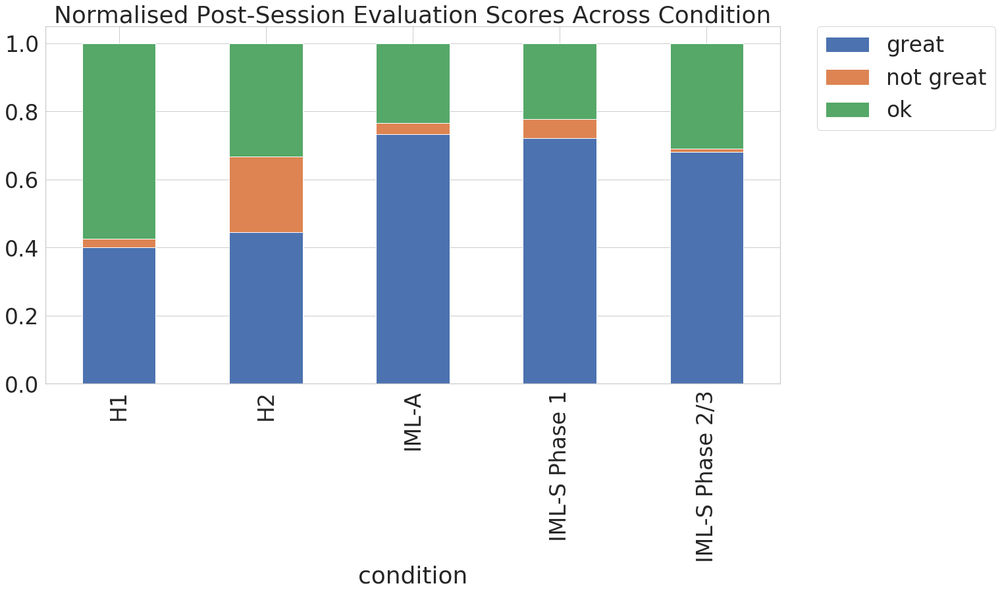

In [27]:
ratings_df = pd.read_csv('session_ratings.csv', names=['user_id','session_number','condition','session_rating','robot_rating'])

indexNames = ratings_df[ratings_df['robot_rating'] == 'blank'].index
ratings_df.drop(indexNames , inplace=True)

ratings_imls1 = ratings_df[(ratings_df['condition'] == 'supervised') & (ratings_df['session_number'] <= 8)].copy()
ratings_imls1['condition'] = "IML-S Phase 1"
ratings_imls2 = ratings_df[(ratings_df['condition'] == 'supervised') & (ratings_df['session_number'] > 8)].copy()
ratings_imls2['condition'] = "IML-S Phase 2/3"
ratings_h1 = ratings_df[(ratings_df['condition'] == 'heuristic')].copy()
ratings_h1['condition'] = 'H1'
ratings_h2 = ratings_df[(ratings_df['condition'] == 'heuristic2')].copy()
ratings_h2['condition'] = 'H2'
ratings_auto = ratings_df[(ratings_df['condition'] == 'autonomous')].copy()
ratings_auto['condition'] = 'IML-A'

overall=pd.concat([ratings_imls1, ratings_h1, ratings_imls2, ratings_h2, ratings_auto])

plt = overall.groupby(["condition"])["robot_rating"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title('Normalised Post-Session Evaluation Scores Across Condition')

#ought to try and do Fisher's here at least to compare e.g. H1 and IML-S Phase 1, and H2 vs IML-A?



In [38]:
#ratings_h2["robot_rating"].value_counts(normalize=False)
total_scores = {'condition': ['IML-S Phase 1','H1','IML-A', 'H2'], 'great': [26,16,22,4], 'not great' : [2,1,1,2], 'ok': [8,23,7,3]}
total_scores = pd.DataFrame(data=total_scores)
total_scores.set_index("condition", inplace=True)

import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()

stats = importr('stats')
m = np.array([total_scores.loc['IML-S Phase 1'].tolist(),total_scores.loc['H1'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

stats = importr('stats')
m = np.array([total_scores.loc['IML-A'].tolist(),total_scores.loc['H2'].tolist()])
res = stats.fisher_test(m,workspace = 2e8)
print('p-value: {}'.format(res[0][0]))

p-value: 0.003661580829382856
p-value: 0.12055973426192086


## Study with Therapists: Acceptability Questionnaire

In [9]:
accept_data = pd.read_csv('AcceptRes.csv')
accept_data 

,Criteria,Score,Timing
0,Success,0,Before
1,Success,1,Before
2,Success,1,Before
3,Success,1,Before
4,Success,-1,Before
...,...,...,...
261,Apprehensive,1,After
262,Apprehensive,0,After
263,Apprehensive,1,After
264,Apprehensive,2,After


Text(0.5, 1.0, 'Acceptance Scores Before and After Focus Group')

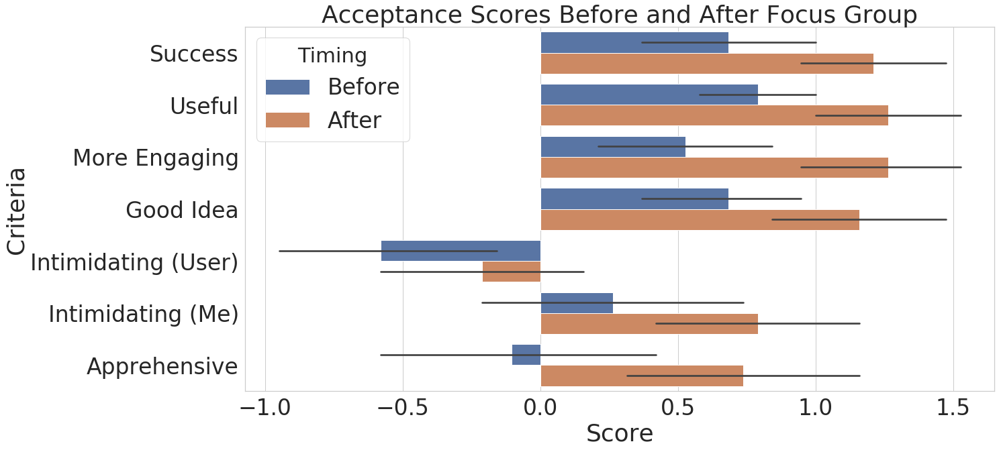

In [18]:
ax = sns.barplot(y='Criteria',x='Score',hue='Timing', data=accept_data)
ax.set_title("Acceptance Scores Before and After Focus Group")
#ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

## Old Analysis

In [8]:
# all autonomous actions
LB_auto_action_log_df=action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']>=23) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
FB_auto_action_log_df=action_log_df[(action_log_df['user_id']=='FB') & (action_log_df['session_number']>=22) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DB_auto_action_log_df=action_log_df[(action_log_df['user_id']=='DB') & (action_log_df['session_number']>=19) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JF_auto_action_log_df=action_log_df[(action_log_df['user_id']=='JF') & (action_log_df['session_number']>=23) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
MR_auto_action_log_df=action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']>=19) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
DP_auto_action_log_df=action_log_df[(action_log_df['user_id']=='DP') & (action_log_df['session_number']>=25) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
JW_auto_action_log_df=action_log_df[(action_log_df['user_id']=='JW') & (action_log_df['session_number']>=23) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
GB_auto_action_log_df=action_log_df[(action_log_df['user_id']=='GB') & (action_log_df['session_number']>=24) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()
PT_auto_action_log_df=action_log_df[(action_log_df['user_id']=='PT') & (action_log_df['session_number']>=19) & (action_log_df['validation']=='PASSIVE_ACCEPTED') & (action_log_df['validation']!='STYLE_UPDATE')].copy()

all_auto_df = pd.concat([LB_auto_action_log_df,FB_auto_action_log_df,DB_auto_action_log_df,JF_auto_action_log_df,MR_auto_action_log_df,DP_auto_action_log_df,JW_auto_action_log_df,GB_auto_action_log_df,PT_auto_action_log_df])

,user_id,session_number,action_id,validation_timestamp,validation_state_id,action,style,duration,validation,trigger_timestamp,trigger_state_id,accepted_count,refused_count,unprompted_count
410,LB,2,dc5657f6-7ea4-4d9c-ac67-1dd1108722e7,1.560939e+09,34f806a6-5e3e-483b-81e8-d21224ddf75d,HUMOUR,POSITIVE,0,UNPROMPTED,1.560939e+09,34f806a6-5e3e-483b-81e8-d21224ddf75d,0,0,1
412,LB,2,318ad7f3-38aa-4061-bf81-1031bb27ceef,1.560939e+09,59e01e2d-5ff5-4bd6-91dc-9970898ec546,HUMOUR,POSITIVE,0,UNPROMPTED,1.560939e+09,59e01e2d-5ff5-4bd6-91dc-9970898ec546,0,0,2
414,LB,2,eba7e90d-0cce-4972-8eb6-853a71c33a8d,1.560939e+09,7e8115bf-d89c-49af-9551-0a9dac2f2044,WALK,POSITIVE,90,VALIDATED,1.560939e+09,b51f6475-08c0-40bc-aa19-5adb4fb0d5be,1,0,2
417,LB,2,222524bc-9ba4-441a-8dc4-a726bb5632f4,1.560939e+09,f9aa7f53-c4dd-4d98-9003-b6d9584f7d3d,TIME,POSITIVE,0,UNPROMPTED,1.560939e+09,f9aa7f53-c4dd-4d98-9003-b6d9584f7d3d,1,0,3
419,LB,2,b7656d87-1ba4-42df-97de-b11ebc4537bc,1.560939e+09,9790692b-8531-4abe-bd91-7d79f3e919f0,RUN,POSITIVE,60,REFUSED,1.560939e+09,0a86da93-de1b-4902-9f64-0f98d0037755,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61760,PT,18,2efd5732-1caf-472f-b6d1-119f9eaafa36,1.565975e+09,fd4cb2b1-b37f-452e-98db-f8a761ece397,ANIMATION,POSITIVE,0,VALIDATED,1.565975e+09,f976018d-ade9-4c0c-83f5-6d4e91c82411,1695,4516,6782
61761,PT,18,34706ff0-3da8-4c33-81af-b3df5a0521ef,1.565975e+09,d6f0a396-492e-4629-bed3-247ca00dac6f,ANIMATION,POSITIVE,0,PASSIVE_ACCEPTED,1.565975e+09,e0261232-3d44-4f20-83f7-65e4200b1f1a,1696,4516,6782
61762,PT,18,162e6a9c-d5b0-4758-a355-bbfad38e7c6f,1.565975e+09,7a397daf-b6af-488e-bfbf-948d2b239cd1,ANIMATION,POSITIVE,0,REFUSED,1.565975e+09,11d9ad8d-3d69-4961-b5aa-a3f12665d768,1696,4517,6782
61763,PT,18,ea0cf13a-b8e1-4a48-81d1-3b3d4dbb6f45,1.565975e+09,211ecb11-58df-4877-8c1a-2794d1c2469f,ANIMATION,POSITIVE,0,REFUSED,1.565975e+09,5c43ce88-b87b-4d9a-ac4d-c4d0499874cc,1696,4518,6782


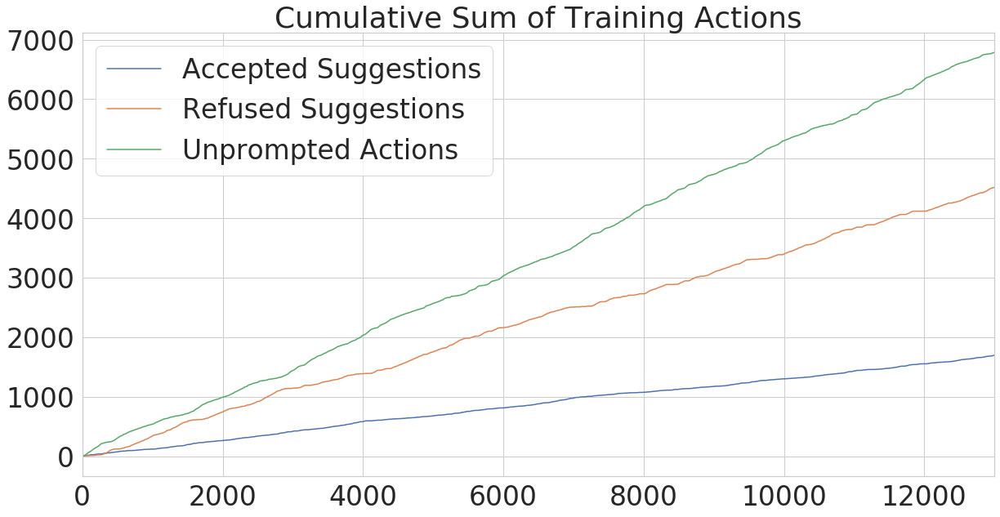

In [10]:
# show any change in rate of acceptance, refusal and unprompted generation of actions
# collection of action examples (by validation type) with time
training_action_log_df.reset_index(drop=True,inplace=True)

accepted_list = training_action_log_df['accepted_count'].tolist()
refused_list = training_action_log_df['refused_count'].tolist()
unprompted_list = training_action_log_df['unprompted_count'].tolist()

plotting_df = pd.DataFrame({
        'Accepted Suggestions' : accepted_list,
        'Refused Suggestions' : refused_list,
        'Unprompted Actions' : unprompted_list
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Training Actions")

Text(0.5, 1.0, 'Response to Learner Suggestions: Start vs End of Phase 2')

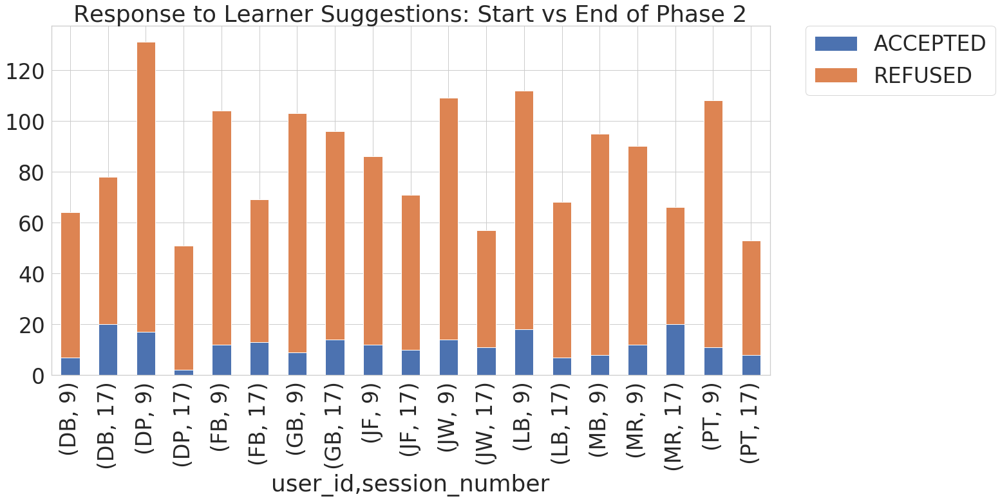

Text(0.5, 1.0, 'Response to Learner Suggestions: Start vs End of Phase 2 - Normalised')

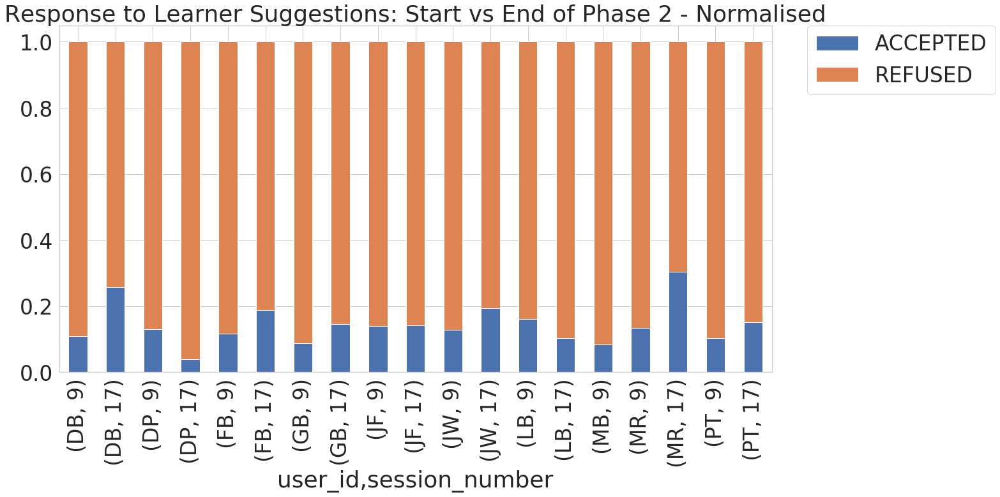

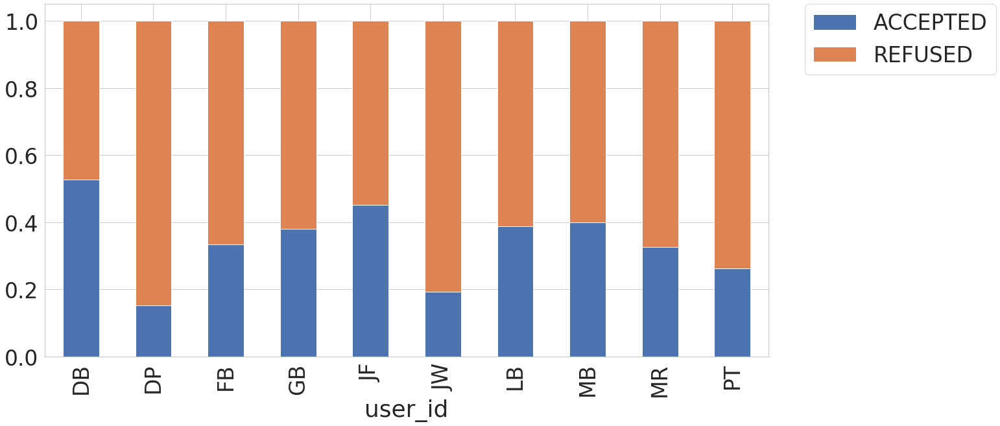

In [33]:
# acceptance (drop unprompteds and mark all passive_accepts/validated as accepted)
last=pd.concat([LB_last_spvd,FB_last_spvd,DB_last_spvd,JF_last_spvd,MR_last_spvd,DP_last_spvd,JW_last_spvd,GB_last_spvd,MB_last_spvd,PT_last_spvd])
indexNames = last[last['validation'] == 'UNPROMPTED'].index
last.drop(indexNames , inplace=True)
#last

last['validation']=last['validation'].apply(lambda x: "ACCEPTED" if x == "VALIDATED" else ("ACCEPTED" if x == "PASSIVE_ACCEPTED" else "REFUSED")) 
plt = last.groupby(["user_id"])["validation"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Text(0.5, 1.0, 'Response to Learner Suggestions in First vs Final Session of Phase 2')

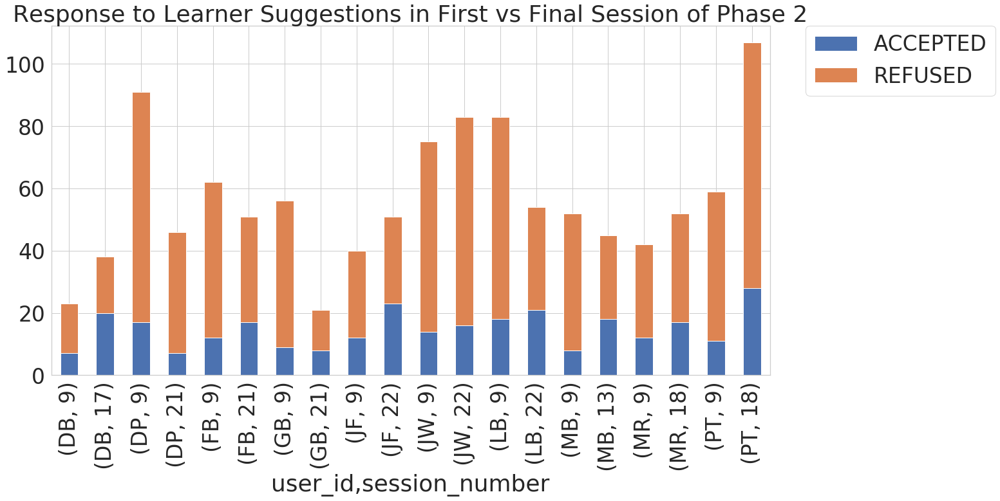

In [34]:
# side by side version of above - shows increased percentage of suggestions were accepted but this varies across
# users (could also be varying with session i.e. some sessions was good others not so much)
# would be good to look at e.g. this for each of DP's sessions to see what that variation is like
first['time']='Phase 2: First'
last['time']='Phase 2: Last'

combined=pd.concat([first,last])

# tried to order based on (pre-defined) list of who saw the most supervised sessions... proved ott difficult so stopped

# combined = combined.groupby(["user_id","session_number"])["validation"].value_counts(normalize=True).reset_index(name='count')
# sort_order=["LB","JF","DP","GB","FB","MR","JW","PT","DB"]
# true_sort = [s for s in sort_order if s in combined.user_id.unique()]
# combined = combined.set_index('user_id').loc[true_sort].reset_index()

# combined.groupby(["user_id","session_number"])['validation'].value_counts(normalize=True).unstack().plot.bar(stacked=True)

plt = combined.groupby(["user_id","session_number"])["validation"].value_counts().unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Response to Learner Suggestions in First vs Final Session of Phase 2")

Text(0.5, 1.0, 'Source of Executed Actions at First vs Final Session of Phase 2')

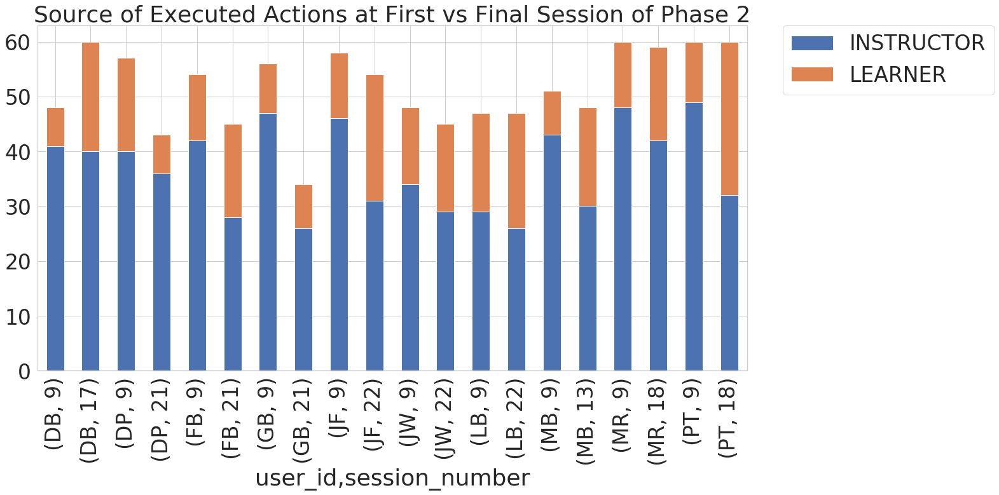

In [28]:
# comparison of souce of executed actions at start and end of Phase 2

first=pd.concat([LB_first_spvd,FB_first_spvd,DB_first_spvd,JF_first_spvd,MR_first_spvd,DP_first_spvd,JW_first_spvd,GB_first_spvd,MB_first_spvd,PT_first_spvd])
indexNames = first[first['validation'] == 'REFUSED'].index
first.drop(indexNames , inplace=True)

last=pd.concat([LB_last_spvd,FB_last_spvd,DB_last_spvd,JF_last_spvd,MR_last_spvd,DP_last_spvd,JW_last_spvd,GB_last_spvd,MB_last_spvd,PT_last_spvd])
indexNames = last[last['validation'] == 'REFUSED'].index
last.drop(indexNames , inplace=True)

first['source']=first['validation']
last['source']=last['validation']

first['source']=first['source'].apply(lambda x: "LEARNER" if x == "VALIDATED" else ("LEARNER" if x == 'PASSIVE_ACCEPTED' else "INSTRUCTOR")) 
last['source']=last['source'].apply(lambda x: "LEARNER" if x == "VALIDATED" else ("LEARNER" if x == 'PASSIVE_ACCEPTED' else "INSTRUCTOR")) 

combined=pd.concat([first,last])
plt = combined.groupby(["user_id","session_number"])["source"].value_counts().unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Source of Executed Actions at First vs Final Session of Phase 2")

Text(0.5, 1.0, 'Response to Learner Suggestions Throughout Phase 2: User DP')

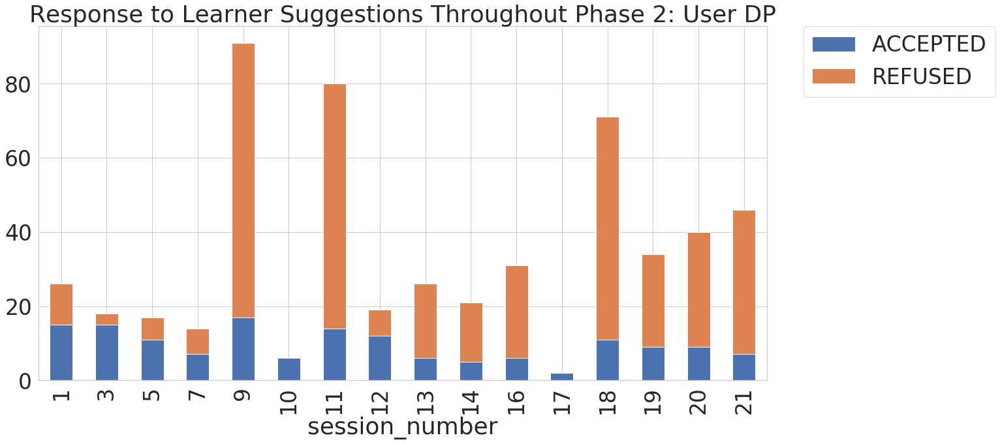

In [23]:
DP_training_action_log_df = training_action_log_df[training_action_log_df['user_id'] == "DP"].copy()
DP_training_action_log_df = DP_training_action_log_df[DP_training_action_log_df['validation'] != "UNPROMPTED"].copy()
DP_training_action_log_df['validation']=DP_training_action_log_df['validation'].apply(lambda x: "ACCEPTED" if x == "VALIDATED" else ("ACCEPTED" if x == "PASSIVE_ACCEPTED" else "REFUSED")) 
plt=DP_training_action_log_df.groupby(['session_number'])["validation"].value_counts().unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Response to Learner Suggestions Throughout Phase 2: User DP")

Text(0.5, 1.0, 'Response to Learner Suggestions Throughout Phase 2: User DB')

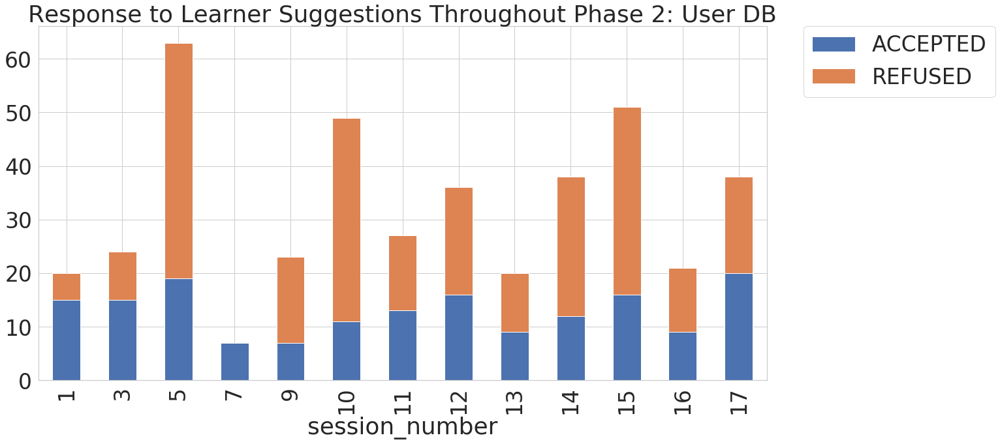

In [24]:
DB_training_action_log_df = training_action_log_df[training_action_log_df['user_id'] == "DB"].copy()
DB_training_action_log_df = DB_training_action_log_df[DB_training_action_log_df['validation'] != "UNPROMPTED"].copy()
DB_training_action_log_df['validation']=DB_training_action_log_df['validation'].apply(lambda x: "ACCEPTED" if x == "VALIDATED" else ("ACCEPTED" if x == "PASSIVE_ACCEPTED" else "REFUSED")) 
plt=DB_training_action_log_df.groupby(['session_number'])["validation"].value_counts().unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Response to Learner Suggestions Throughout Phase 2: User DB")

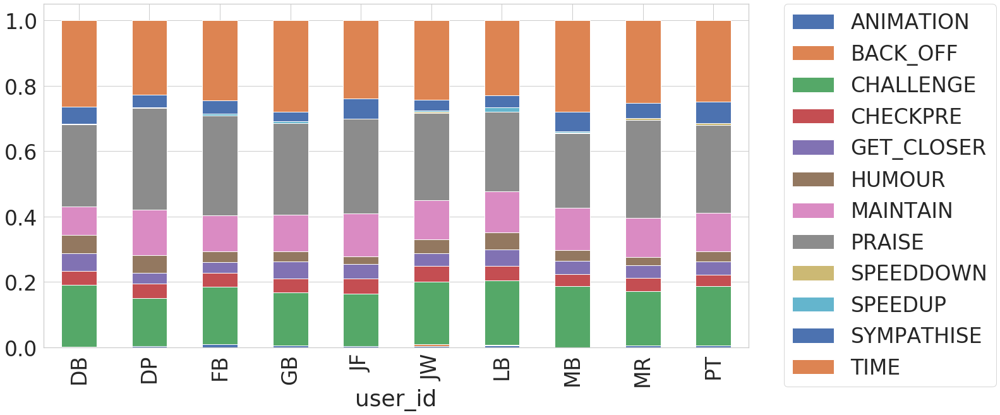

In [56]:
# action distribution across all participants for all training sessions (note they don't look that different...)
indexNames = training_action_log_df[training_action_log_df['action'] == 'RUN'].index
training_action_log_df.drop(indexNames , inplace=True)
indexNames = training_action_log_df[training_action_log_df['action'] == 'WALK'].index
training_action_log_df.drop(indexNames , inplace=True)
indexNames = training_action_log_df[training_action_log_df['validation'] == 'REFUSED'].index
training_action_log_df.drop(indexNames , inplace=True)

plt=training_action_log_df.groupby(['user_id'])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [ ]:
training_action_log_df['action'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

value_count = training_action_log_df.groupby(['user_id','session_number','session_type'])['action'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

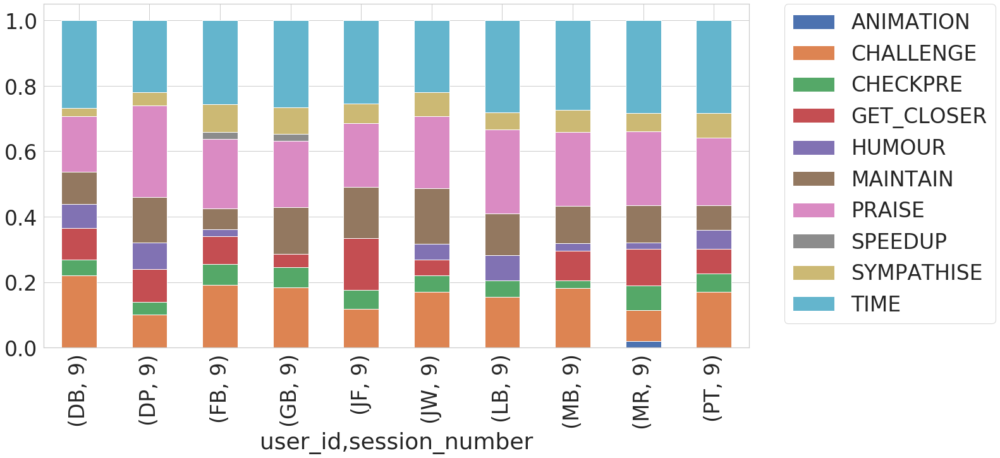

In [18]:
# action distribution across all participants for first Phase 2 session
first=pd.concat([LB_first_spvd,FB_first_spvd,DB_first_spvd,JF_first_spvd,MR_first_spvd,DP_first_spvd,JW_first_spvd,GB_first_spvd,MB_first_spvd,PT_first_spvd])

indexNames = first[first['action'] == 'RUN'].index
first.drop(indexNames , inplace=True)
indexNames = first[first['action'] == 'WALK'].index
first.drop(indexNames , inplace=True)
indexNames = first[first['validation'] == 'REFUSED'].index
first.drop(indexNames , inplace=True)

plt = first.groupby(["user_id",'session_number'])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

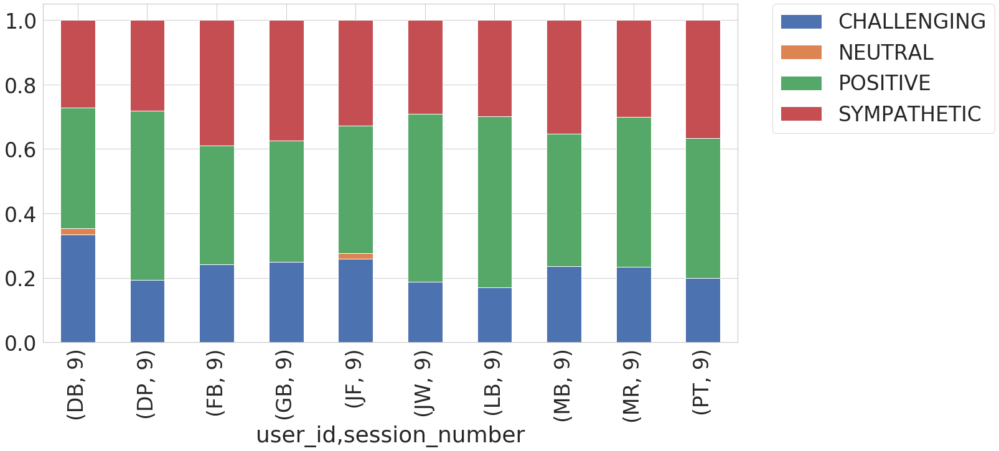

In [16]:
# style distribution across all participants for first Phase 2 session
first=pd.concat([LB_first_spvd,FB_first_spvd,DB_first_spvd,JF_first_spvd,MR_first_spvd,DP_first_spvd,JW_first_spvd,GB_first_spvd,MB_first_spvd,PT_first_spvd])

indexNames = first[first['validation'] == 'REFUSED'].index
first.drop(indexNames , inplace=True)
plt = first.groupby(["user_id",'session_number'])["style"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Text(0.5, 1.0, "Normalised Action Distribution for Each Particpant's Final Supervised Session")

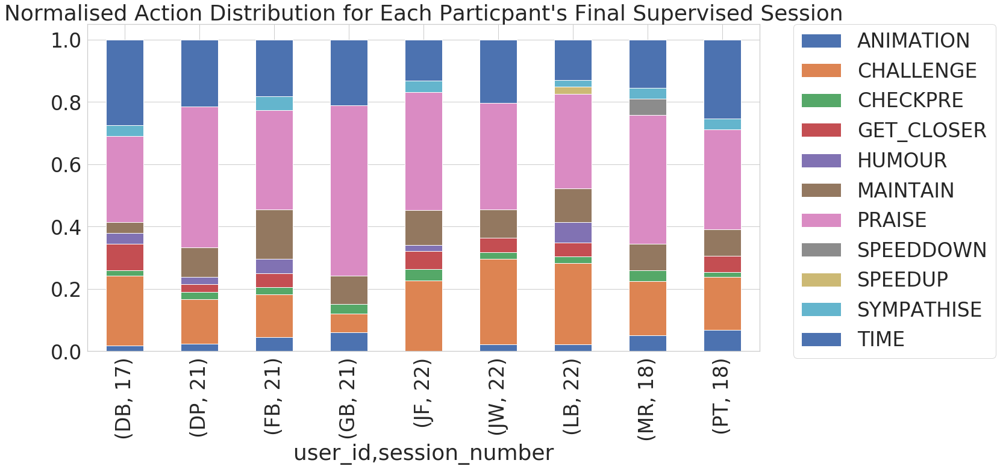

In [70]:
# action distribution across all participants for last Phase 2 session
last=pd.concat([LB_last_spvd,FB_last_spvd,DB_last_spvd,JF_last_spvd,MR_last_spvd,DP_last_spvd,JW_last_spvd,GB_last_spvd,MB_last_spvd,PT_last_spvd])

indexNames = last[last['action'] == 'RUN'].index
last.drop(indexNames , inplace=True)
indexNames = last[last['user_id'] == 'MB'].index
last.drop(indexNames , inplace=True)
indexNames = last[last['action'] == 'WALK'].index
last.drop(indexNames , inplace=True)
indexNames = last[last['validation'] == 'REFUSED'].index
last.drop(indexNames , inplace=True)

plt = last.groupby(["user_id",'session_number'])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Normalised Action Distribution for Each Particpant's Final Supervised Session")

user_id  session_number  style      
DB       17              POSITIVE       0.394737
                         SYMPATHETIC    0.315789
                         CHALLENGING    0.289474
DP       21              POSITIVE       0.782609
                         CHALLENGING    0.152174
                         SYMPATHETIC    0.065217
FB       21              POSITIVE       0.666667
                         SYMPATHETIC    0.215686
                         CHALLENGING    0.117647
GB       21              SYMPATHETIC    0.666667
                         POSITIVE       0.333333
JF       22              SYMPATHETIC    0.568627
                         POSITIVE       0.294118
                         CHALLENGING    0.137255
JW       22              SYMPATHETIC    0.445783
                         POSITIVE       0.397590
                         CHALLENGING    0.156627
LB       22              POSITIVE       0.500000
                         CHALLENGING    0.296296
                         SYMPATH

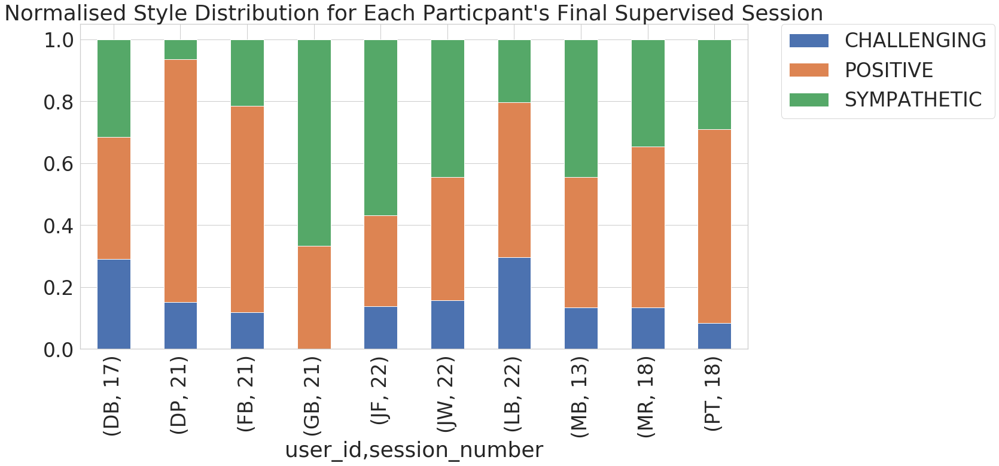

In [16]:
plt = last.groupby(["user_id",'session_number'])["style"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Normalised Style Distribution for Each Particpant's Final Supervised Session")

last.groupby(["user_id",'session_number'])["style"].value_counts(normalize=True)

session_number  style      
19              POSITIVE       0.766667
                SYMPATHETIC    0.222222
                CHALLENGING    0.011111
20              POSITIVE       0.630435
                SYMPATHETIC    0.304348
                CHALLENGING    0.065217
22              POSITIVE       0.780000
                SYMPATHETIC    0.220000
Name: style, dtype: float64

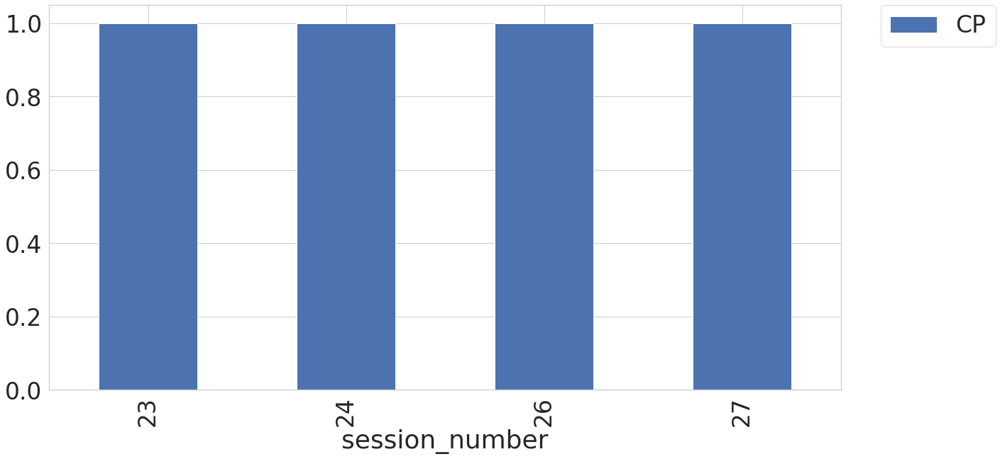

In [43]:
# spread of action distributions across autonomous sessions within participant
indexNames = LB_auto_action_log_df[LB_auto_action_log_df['action'] == 'WALK'].index
LB_auto_action_log_df.drop(indexNames , inplace=True)

LB_auto_action_log_df['action']=LB_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))

plt = LB_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

PT_auto_action_log_df.groupby(["session_number"])["style"].value_counts(normalize=True)

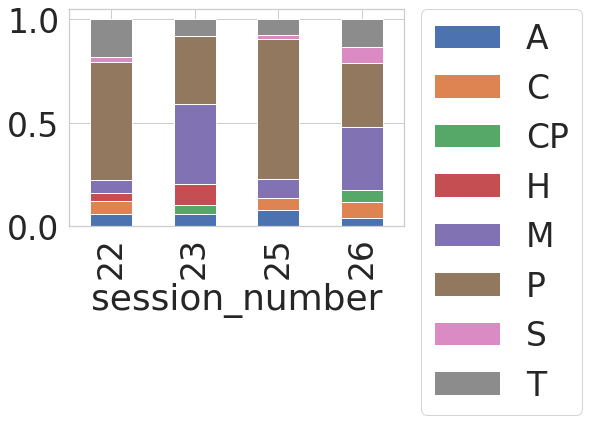

In [43]:
indexNames = FB_auto_action_log_df[FB_auto_action_log_df['action'] == 'WALK'].index
FB_auto_action_log_df.drop(indexNames , inplace=True)

FB_auto_action_log_df['action']=FB_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))

plt = FB_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

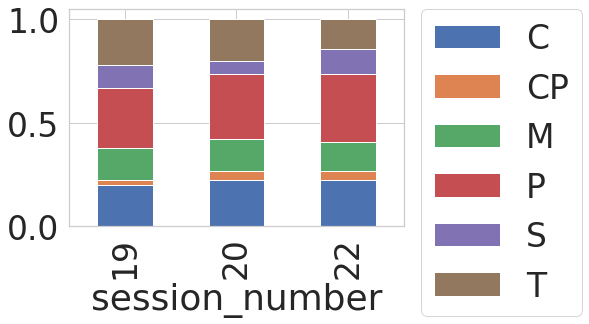

In [33]:
indexNames = DB_auto_action_log_df[DB_auto_action_log_df['action'] == 'WALK'].index
DB_auto_action_log_df.drop(indexNames , inplace=True)

DB_auto_action_log_df['action']=DB_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))

plt = DB_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

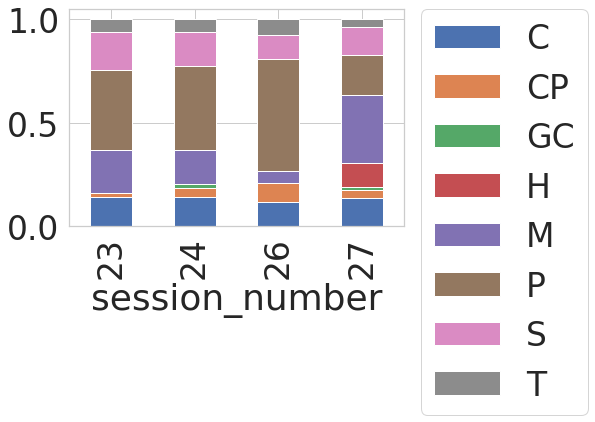

In [31]:
indexNames = JF_auto_action_log_df[JF_auto_action_log_df['action'] == 'WALK'].index
JF_auto_action_log_df.drop(indexNames , inplace=True)

JF_auto_action_log_df['action']=JF_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))

plt = JF_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

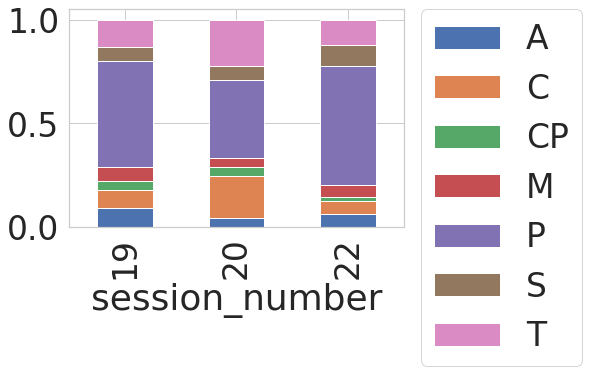

In [28]:
indexNames = MR_auto_action_log_df[MR_auto_action_log_df['action'] == 'WALK'].index
MR_auto_action_log_df.drop(indexNames , inplace=True)

MR_auto_action_log_df['action']=MR_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))
plt = MR_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

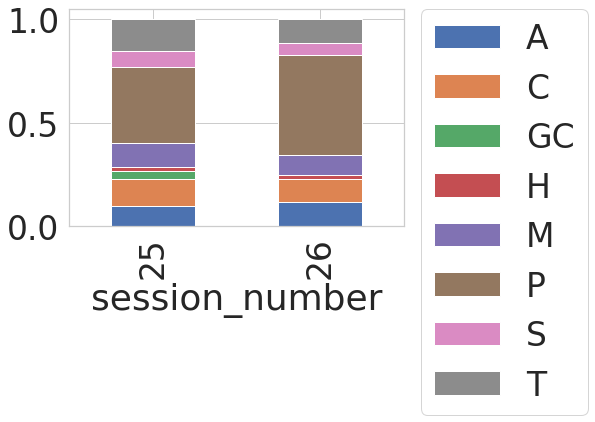

In [26]:
indexNames = DP_auto_action_log_df[DP_auto_action_log_df['action'] == 'WALK'].index
DP_auto_action_log_df.drop(indexNames , inplace=True)

DP_auto_action_log_df['action']=DP_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))

plt = DP_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

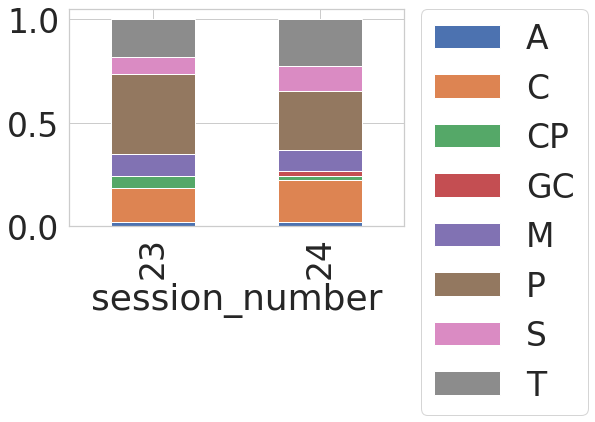

In [24]:
indexNames = JW_auto_action_log_df[JW_auto_action_log_df['action'] == 'WALK'].index
JW_auto_action_log_df.drop(indexNames , inplace=True)

JW_auto_action_log_df['action']=JW_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))

plt = JW_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

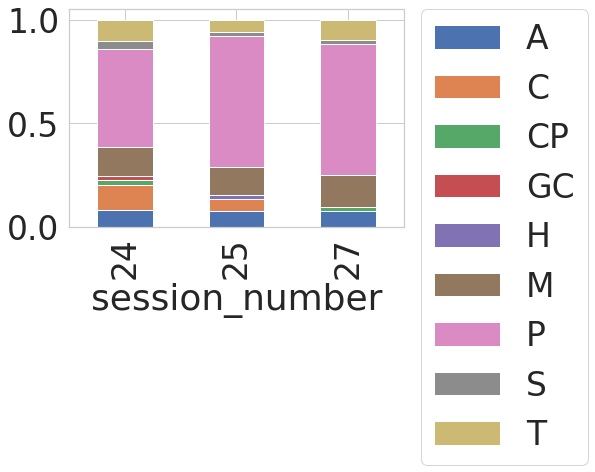

In [22]:
indexNames = GB_auto_action_log_df[GB_auto_action_log_df['action'] == 'WALK'].index
GB_auto_action_log_df.drop(indexNames , inplace=True)

GB_auto_action_log_df['action']=GB_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))

plt = GB_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

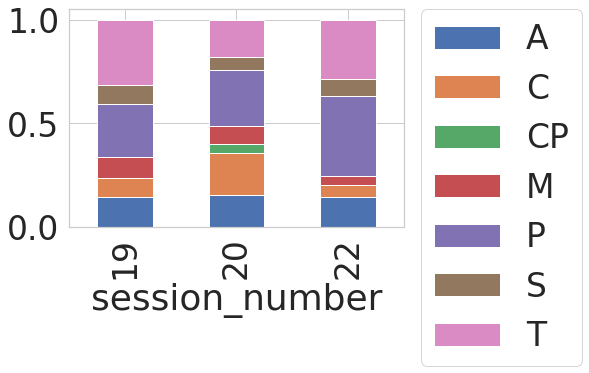

In [20]:
indexNames = PT_auto_action_log_df[PT_auto_action_log_df['action'] == 'WALK'].index
PT_auto_action_log_df.drop(indexNames , inplace=True)

PT_auto_action_log_df['action']=PT_auto_action_log_df['action'].apply(lambda x: "M" if x == "MAINTAIN" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("T" if x == "TIME" else ("A" if x == "ANIMATION" else ("GC" if x == "GET_CLOSER" else ("S" if x == "SYMPATHISE" else ("H" if x == "HUMOUR" else "CP"))))))))

plt = PT_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
l=plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [31]:
# amalgamate above figures into one 5x2 with same colour scheme/key
# fig, axs = plt.subplots(5,2)
# axs[4,0] = PT_auto_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)

# handles, labels = axs.get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper center')

# ...might just be easier to do this in excel...? -_- see 'ActionFigs.xls' on OneDrive for action distributions
# for each participant last few supervised and all autonomous sessions

indexNames = PT_training_action_log_df[PT_training_action_log_df['action'] == 'RUN'].index
PT_training_action_log_df.drop(indexNames , inplace=True)
indexNames = PT_training_action_log_df[PT_training_action_log_df['action'] == 'WALK'].index
PT_training_action_log_df.drop(indexNames , inplace=True)
indexNames = PT_training_action_log_df[PT_training_action_log_df['validation'] == 'REFUSED'].index
PT_training_action_log_df.drop(indexNames , inplace=True)
pd.set_option('display.max_rows', None)
PT_training_action_log_df.groupby(["session_number"])["action"].value_counts(normalize=True)

session_number  action    
1               CHALLENGE     0.326531
                PRAISE        0.163265
                TIME          0.163265
                MAINTAIN      0.122449
                SYMPATHISE    0.102041
                HUMOUR        0.081633
                CHECKPRE      0.040816
2               CHALLENGE     0.227273
                PRAISE        0.204545
                MAINTAIN      0.181818
                TIME          0.181818
                SYMPATHISE    0.136364
                CHECKPRE      0.045455
                HUMOUR        0.022727
3               PRAISE        0.276596
                CHALLENGE     0.212766
                MAINTAIN      0.170213
                TIME          0.127660
                SYMPATHISE    0.106383
                HUMOUR        0.063830
                CHECKPRE      0.042553
4               PRAISE        0.259259
                CHALLENGE     0.222222
                TIME          0.185185
                MAINTAIN      0.16666

In [30]:
# ML-S action distributions for supervised mixed versus full run sessions


pd.set_option('display.max_rows', None)
run_15

,user_id,session_number,action_id,validation_timestamp,validation_state_id,action,style,duration,validation,trigger_timestamp,trigger_state_id
36519,LB,15,0674eaf1-1b58-431b-987c-55e0d0321e75,1.563963e+09,9195c2a9-a1d2-4ae4-91a7-ed3b6033e053,MAINTAIN,POSITIVE,0,UNPROMPTED,1.563963e+09,9195c2a9-a1d2-4ae4-91a7-ed3b6033e053
36522,LB,15,645c2246-aae2-4bc8-bbe5-8ee5cc06afce,1.563963e+09,06ecc85c-b65e-4ee7-be5b-a051ed854ebd,PRAISE,POSITIVE,0,UNPROMPTED,1.563963e+09,06ecc85c-b65e-4ee7-be5b-a051ed854ebd
36526,LB,15,9e11502a-57ff-45b3-8867-85514c481073,1.563963e+09,12506995-a94c-48c8-9c8c-de0a4998e8f3,PRAISE,POSITIVE,0,REFUSED,1.563963e+09,1962b3d4-aab4-4869-b215-a63b9ccb8464
36531,LB,15,2d9a8977-85b0-4bfb-a752-d690c892dc7b,1.563963e+09,857991db-b32d-4998-b45e-6cb72b75a1cb,PRAISE,POSITIVE,0,REFUSED,1.563963e+09,7121257c-f990-4634-a2d4-37f1da06ebfe
36532,LB,15,6e6dbd9a-e7b3-416f-853f-3ed45389f3a2,1.563963e+09,aff5a31b-cd29-4ee0-be9e-4d68f854ad35,MAINTAIN,POSITIVE,0,UNPROMPTED,1.563963e+09,aff5a31b-cd29-4ee0-be9e-4d68f854ad35
36536,LB,15,8e1ababb-8c94-4bc9-b22c-eb5351790386,1.563963e+09,3ef113cb-ca17-4df2-a6c8-573394ede08f,MAINTAIN,POSITIVE,0,REFUSED,1.563963e+09,d88f601e-7a9a-46a8-a967-a74a7e85dbbf
36546,LB,15,c2598e22-7211-4ef2-bff5-2e5a794d7fdb,1.563963e+09,c9b6003a-c2cd-48bc-8040-409f035a72a5,MAINTAIN,POSITIVE,0,REFUSED,1.563963e+09,d3720783-36b6-4433-b075-1efab3adafff
36557,LB,15,234acff9-9bf6-4f70-ad8e-ab0e3fcdd54a,1.563963e+09,57826f7d-8819-4287-a43a-b763d72f7f4b,PRAISE,POSITIVE,0,PASSIVE_ACCEPTED,1.563963e+09,69eeefa1-2924-4c9d-bcdd-857be6a95f11
36568,LB,15,3f0b213e-1dca-4918-8c91-ad4e57bc1bcf,1.563963e+09,0eeab10e-1320-427a-a012-93749a7f6428,MAINTAIN,POSITIVE,0,REFUSED,1.563963e+09,ce12fa78-a6bd-47db-a6ee-866c8910abf5
36579,LB,15,870d2039-f8d0-4d41-9b5a-ea64746b9a47,1.563963e+09,5de815ac-4a9d-471c-b2e5-4a8de922ec95,MAINTAIN,POSITIVE,0,REFUSED,1.563963e+09,c29620bd-f90d-401e-93bf-f40c79584afe


Text(0.5, 1.0, 'Relative Use of Action Types Across All Supervised Sessions')

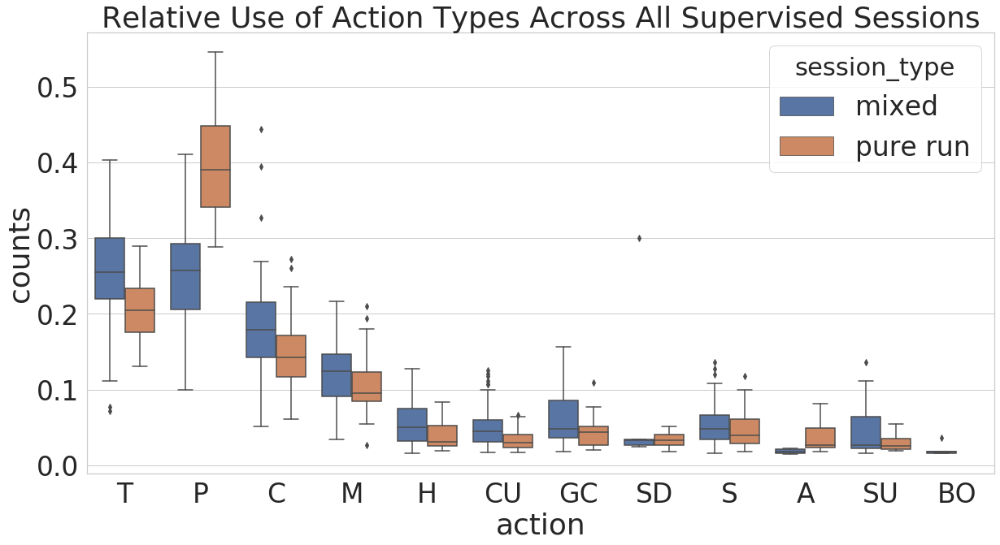

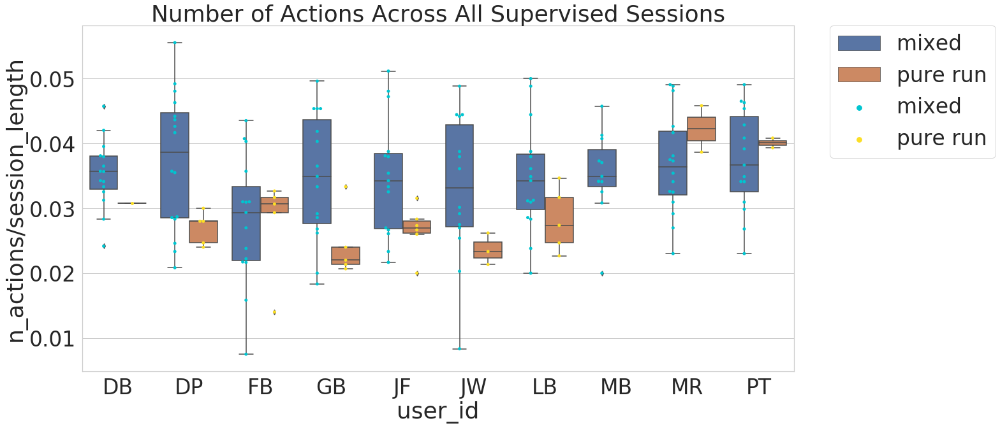

In [33]:
# number of actions / session length for mixed versus pure run sessions

mixed_executed_actions_df=mixed_training_action_log_df[(mixed_training_action_log_df['validation']!='REFUSED') & (mixed_training_action_log_df['action']!='RUN') & (mixed_training_action_log_df['action']!='WALK')].copy()
#mixed_executed_actions_df

run_executed_actions_df=run_training_action_log_df[(run_training_action_log_df['validation']!='REFUSED') & (run_training_action_log_df['action']!='RUN') & (run_training_action_log_df['action']!='WALK')].copy()

pd.set_option('display.max_rows', None)
run_executed_actions_df

mixed_executed_actions_df['session_type']='mixed'
run_executed_actions_df['session_type']='pure run'

frames = [mixed_executed_actions_df, run_executed_actions_df]

all_spvd_executed_actions_df=pd.concat(frames)

indexNames = all_spvd_executed_actions_df[all_spvd_executed_actions_df['action'] == 'RUN'].index
all_spvd_executed_actions_df.drop(indexNames , inplace=True)

indexNames = all_spvd_executed_actions_df[all_spvd_executed_actions_df['action'] == 'WALK'].index
all_spvd_executed_actions_df.drop(indexNames , inplace=True)

action_count=all_spvd_executed_actions_df.drop(columns=['validation_timestamp','validation_state_id','action','style','duration','validation','trigger_timestamp','trigger_state_id'])

# this contains total number of actions per session 
value_count = action_count[['user_id','session_number','session_type','action_id']].groupby(['user_id','session_number','session_type']).count().reset_index()

# need (probably?) to now also add a column of session lengths to normalise against
value_count['session_length'] = value_count['session_number'].apply(lambda x: 1200 if x == 1 else (1200 if x == 2 else (1200 if x == 3 else (1260 if x == 4 else 1260 if x == 5 else (1260 if x == 6 else (1080 if x == 7 else (1080 if x == 8 else (1080 if x == 9 else (1290 if x == 10 else (1290 if x == 11 else (1290 if x == 12 else 1260 if x == 13 else (1260 if x == 14 else (1200 if x == 15 else (1440 if x == 16 else (1380 if x == 17 else (1500 if x == 18 else (1500 if x == 19 else 1500 if x == 20 else (1500 if x == 21 else (1680 if x == 22 else (1680 if x == 22 else (1680 if x == 23 else 1800))))))))) )))))) ))))))
                                                                                                   
value_count['n_actions'] = value_count['action_id']
value_count=value_count.drop(columns=['action_id'])
value_count['n_actions/session_length'] = value_count['n_actions'] / value_count['session_length']
                                                                                                   
ax = sns.boxplot(x="user_id", y="n_actions/session_length", hue='session_type', data=value_count)
ax.set_title("Number of Actions Across All Supervised Sessions")
my_palette = ["#00C5D0","#FBDE25"]
ax = sns.swarmplot(x="user_id", y="n_actions/session_length", hue = 'session_type', data=value_count, palette=my_palette, dodge=True)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# this also shows how few training examples the learner got for the pure run sessions (for some people)



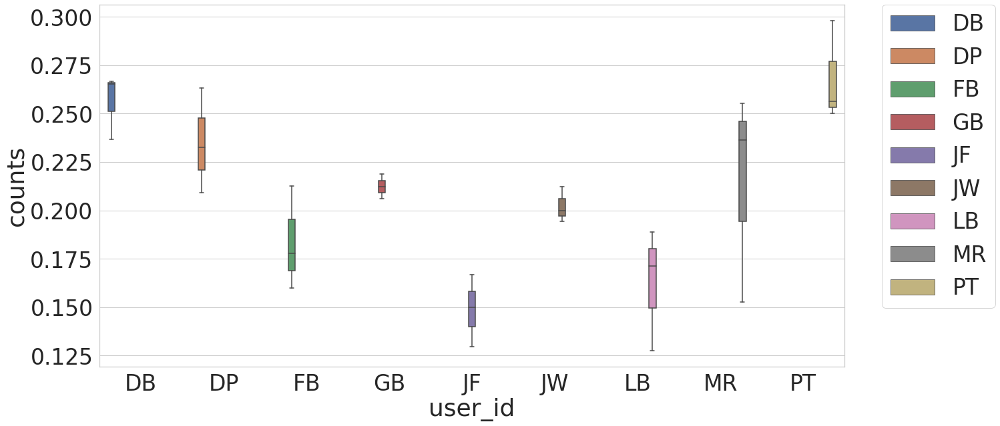

In [80]:
# subset of supervised training session data (as per excel doc)
LB_spvd_action_log_df=LB_training_action_log_df[(LB_training_action_log_df['session_number']>=19) & (LB_training_action_log_df['validation']!='REFUSED')].copy()
FB_spvd_action_log_df=FB_training_action_log_df[(FB_training_action_log_df['session_number']>=19) & (FB_training_action_log_df['validation']!='REFUSED')].copy()
DB_spvd_action_log_df=DB_training_action_log_df[(DB_training_action_log_df['session_number']>=15) & (DB_training_action_log_df['validation']!='REFUSED')].copy()
JF_spvd_action_log_df=JF_training_action_log_df[(JF_training_action_log_df['session_number']>=20) & (JF_training_action_log_df['validation']!='REFUSED')].copy()
MR_spvd_action_log_df=MR_training_action_log_df[(MR_training_action_log_df['session_number']>=16) & (MR_training_action_log_df['validation']!='REFUSED')].copy()
DP_spvd_action_log_df=DP_training_action_log_df[(DP_training_action_log_df['session_number']>=19) & (DP_training_action_log_df['validation']!='REFUSED')].copy()
JW_spvd_action_log_df=JW_training_action_log_df[(JW_training_action_log_df['session_number']>=20) & (JW_training_action_log_df['validation']!='REFUSED')].copy()
GB_spvd_action_log_df=GB_training_action_log_df[(GB_training_action_log_df['session_number']>=19) & (GB_training_action_log_df['validation']!='REFUSED')].copy()
PT_spvd_action_log_df=PT_training_action_log_df[(PT_training_action_log_df['session_number']>=16) & (PT_training_action_log_df['validation']!='REFUSED')].copy()

frames = [LB_spvd_action_log_df,FB_spvd_action_log_df,DB_spvd_action_log_df,JF_spvd_action_log_df,MR_spvd_action_log_df,DP_spvd_action_log_df,JW_spvd_action_log_df,GB_spvd_action_log_df,PT_spvd_action_log_df]
spvd_comp_log_df = pd.concat(frames)

#need to do the normalisation value counts first before splitting them off
value_count = spvd_comp_log_df.groupby(['user_id','session_number'])['action'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

value_count

# time action

indexNames = value_count[value_count['action'] != 'TIME'].index
value_count.drop(indexNames , inplace=True)

value_count
ax = sns.boxplot(x="user_id", y="counts", hue='user_id', data=value_count)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Text(0.5, 1.0, 'Relative Use of Sympathetic Actions Across Participants')

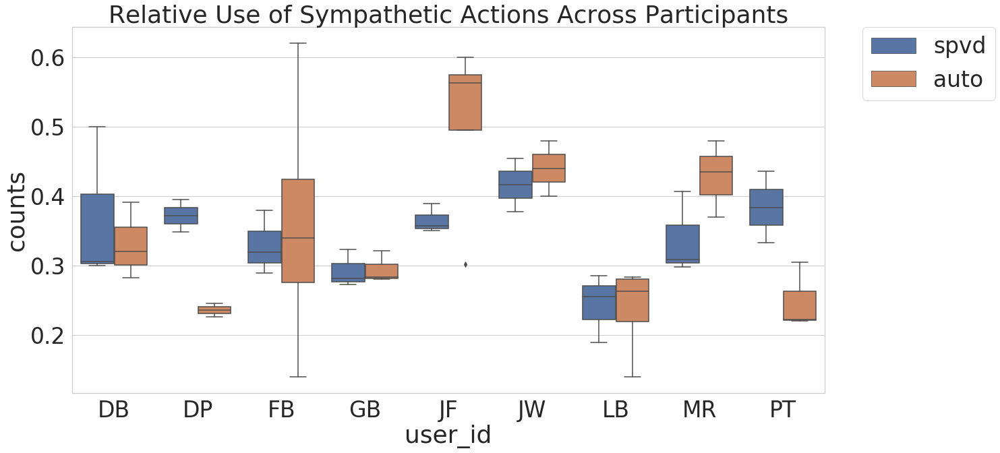

In [81]:
# now is it possible to do the same again but with additional hue of auto vs supervised...?

# as per chat with Severin on 17/03 seems to make more sense to focus on styles rather than actions for personalisation (?)

spvd_comp_log_df['control']='spvd'
all_auto_df['control']='auto'

combined = pd.concat([spvd_comp_log_df, all_auto_df])

value_count = combined .groupby(['user_id','session_number','control'])['style'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

indexNames = value_count [value_count ['style'] != 'SYMPATHETIC'].index
value_count .drop(indexNames , inplace=True)

value_count 

ax = sns.boxplot(x="user_id", y="counts", hue='control', data=value_count)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_title("Relative Use of Sympathetic Actions Across Participants")

Text(0.5, 1.0, 'Relative Use of Positive Actions Across Participants')

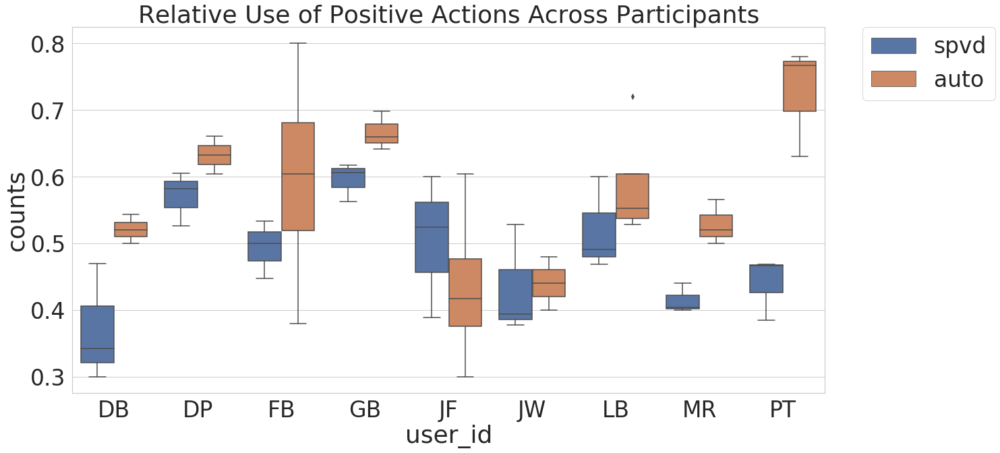

In [82]:
combined = pd.concat([spvd_comp_log_df, all_auto_df])

value_count = combined .groupby(['user_id','session_number','control'])['style'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

# challenging style action

indexNames = value_count [value_count ['style'] != 'POSITIVE'].index
value_count .drop(indexNames , inplace=True)

value_count 

ax = sns.boxplot(x="user_id", y="counts", hue='control', data=value_count)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_title("Relative Use of Positive Actions Across Participants")

Text(0.5, 1.0, 'Relative Use of Challenging Actions Across Participants')

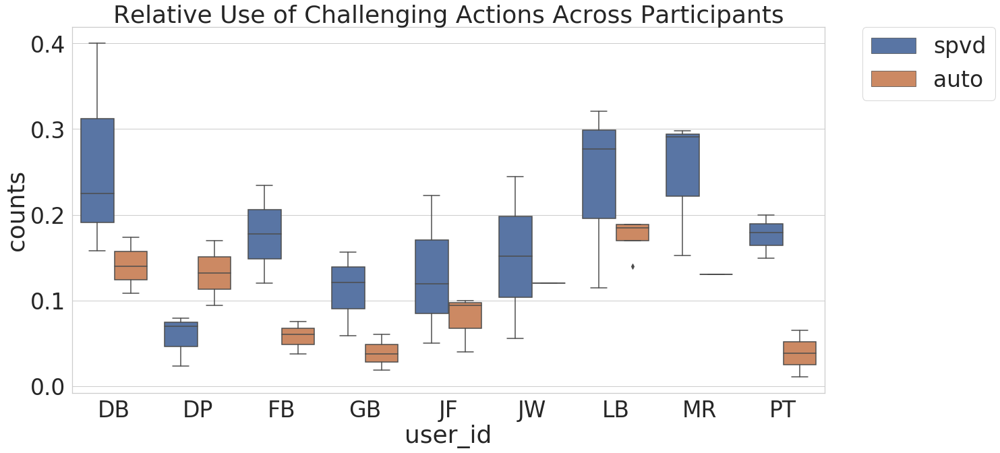

In [83]:
combined = pd.concat([spvd_comp_log_df, all_auto_df])

value_count = combined .groupby(['user_id','session_number','control'])['style'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

# challenging style action

indexNames = value_count [value_count ['style'] != 'CHALLENGING'].index
value_count .drop(indexNames , inplace=True)

value_count 

ax = sns.boxplot(x="user_id", y="counts", hue='control', data=value_count)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_title("Relative Use of Challenging Actions Across Participants")

Text(0.5, 1.0, 'Normalised Action Style Distribution Across Supervised vs Autonomous Sessions')

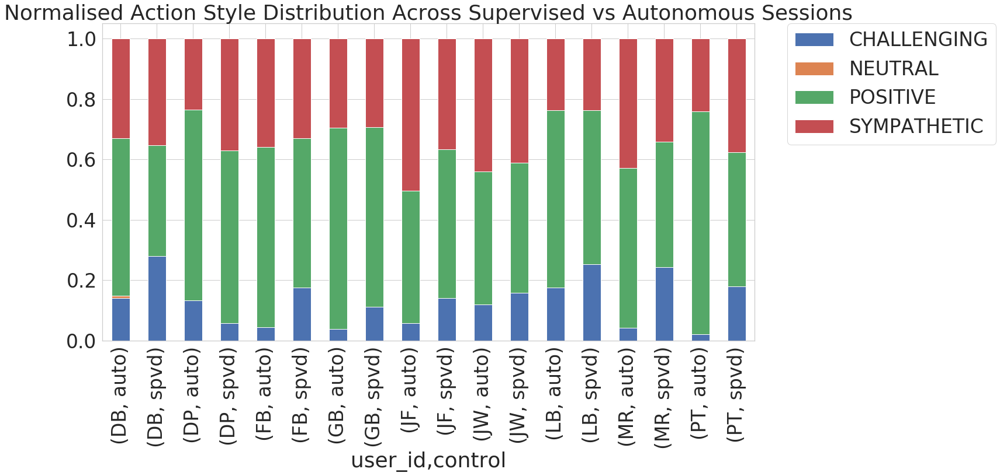

In [84]:
plt = combined.groupby(["user_id","control"])["style"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Normalised Action Style Distribution Across Supervised vs Autonomous Sessions")

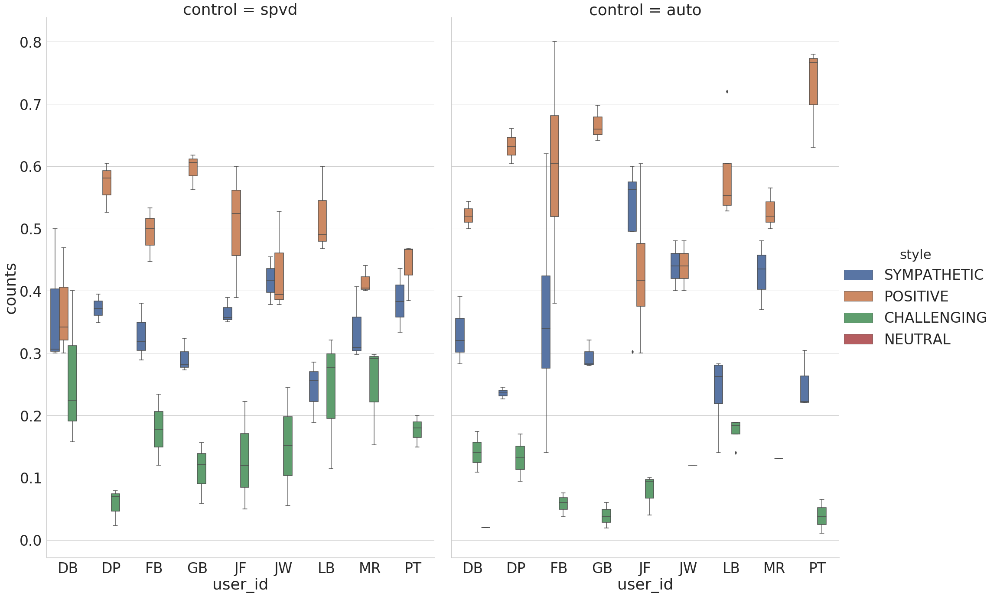

In [92]:
combined = pd.concat([spvd_comp_log_df, all_auto_df])

value_count = combined .groupby(['user_id','session_number','control'])['style'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

ax = sns.catplot(x="user_id", y="counts", hue='style', col='control', data=value_count, kind="box", height=20, aspect=.7)
#ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

#ax.set_title("Relative Use of Actions Styles in Supervised vs Autonomous Sessions Across Participants")

Text(0.5, 1.0, 'Relative Use of Time Action Across Participants')

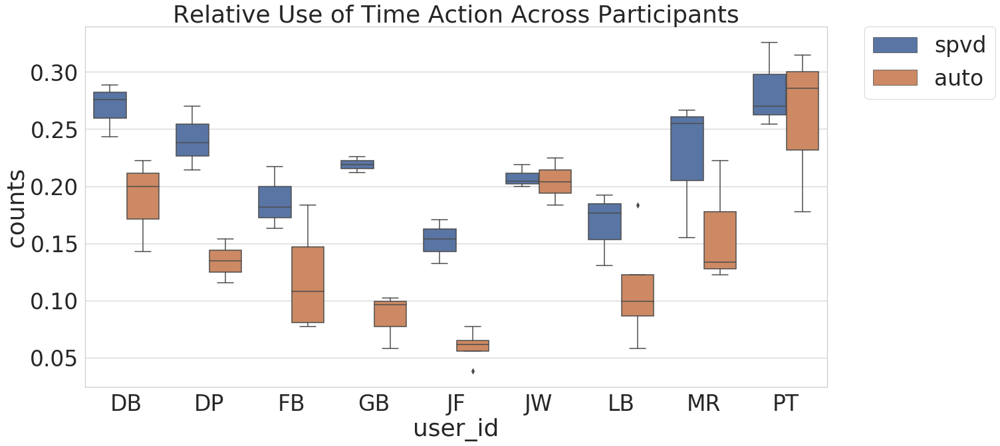

In [52]:
# TIME action

value_count = combined.groupby(['user_id','session_number','control'])['action'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

indexNames = value_count [value_count ['action'] != 'TIME'].index
value_count .drop(indexNames , inplace=True)

value_count 

ax = sns.boxplot(x="user_id", y="counts", hue='control', data=value_count)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_title("Relative Use of Time Action Across Participants")

Text(0.5, 1.0, 'Relative Use of Challenge Action Across Participants')

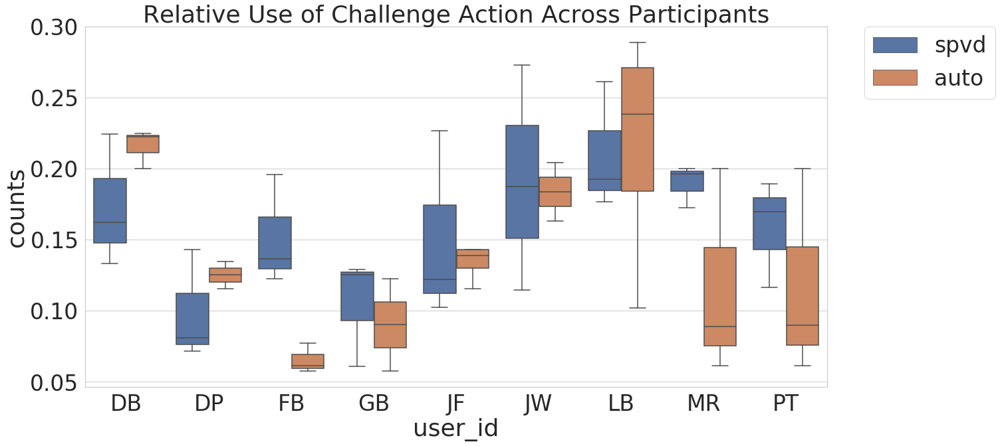

In [53]:
# challenge action

value_count = combined .groupby(['user_id','session_number','control'])['action'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

indexNames = value_count [value_count ['action'] != 'CHALLENGE'].index
value_count .drop(indexNames , inplace=True)

value_count 

ax = sns.boxplot(x="user_id", y="counts", hue='control', data=value_count)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_title("Relative Use of Challenge Action Across Participants")

Text(0.5, 1.0, 'Relative Use of Animation Action Across Participants')

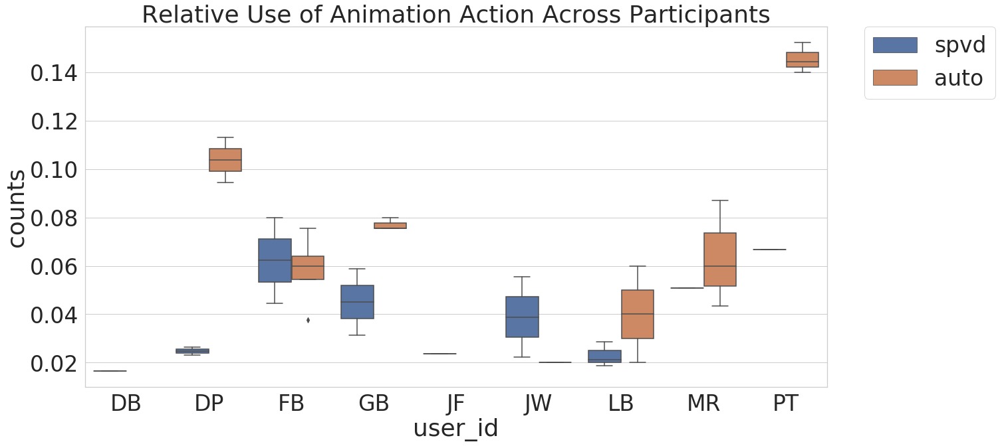

In [93]:
# challenge action

value_count = combined .groupby(['user_id','session_number','control'])['action'].value_counts(normalize=True)
value_count = value_count.reset_index(name='counts')

indexNames = value_count [value_count ['action'] != 'ANIMATION'].index
value_count .drop(indexNames , inplace=True)

value_count 

ax = sns.boxplot(x="user_id", y="counts", hue='control', data=value_count)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

ax.set_title("Relative Use of Animation Action Across Participants")

Text(0.5, 1.0, 'Normalised Action Distribution Across Mixed Walk/Run vs Pure Run Sessions')

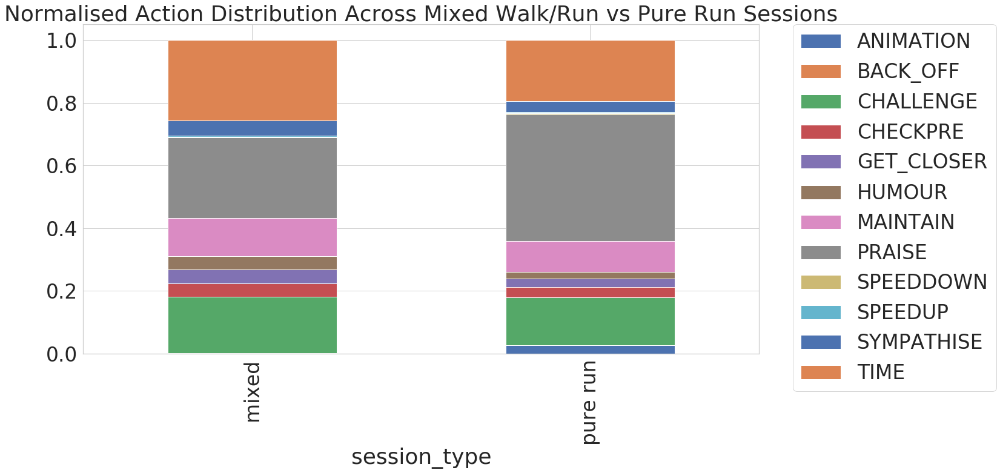

In [30]:
# alternative form of above

plt = all_spvd_executed_actions_df.groupby(["session_type"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Normalised Action Distribution Across Mixed Walk/Run vs Pure Run Sessions")

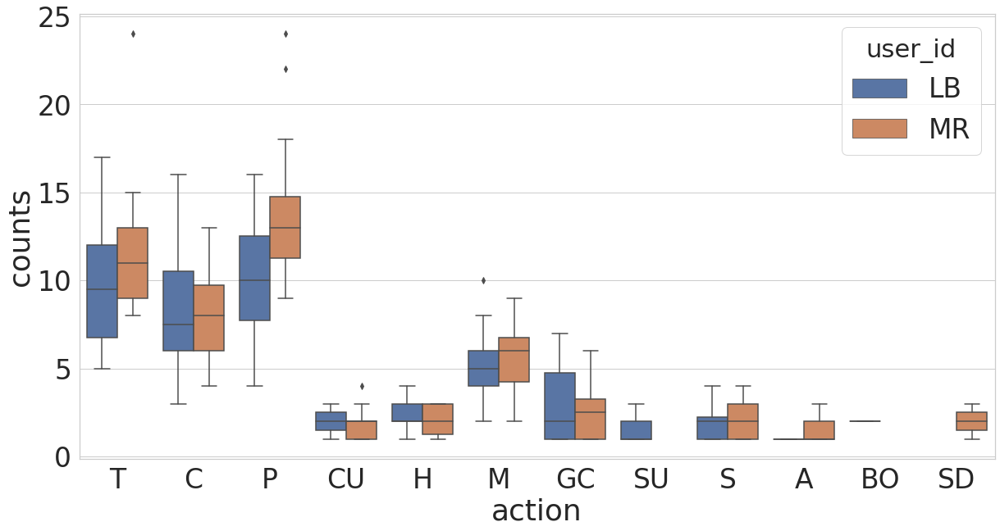

In [119]:
# differences in supervised, executed actions for two participants who undertook the same number of sessions
reduced_LB = LB_training_action_log_df[(LB_training_action_log_df['session_number']<=18)].copy()
MR_LB_frames = [MR_training_action_log_df,LB_training_action_log_df]
MR_LB_training_data = pd.concat(MR_LB_frames)

value_count = MR_LB_training_data.groupby(['user_id','session_number'])['action'].value_counts()
value_count = value_count.reset_index(name='counts')

indexNames = value_count[value_count['action'] == 'RUN' ].index
value_count.drop(indexNames , inplace=True)

indexNames = value_count[value_count['action'] == 'WALK' ].index
value_count.drop(indexNames , inplace=True)

value_count

# differences in supervised, executed actions for two users (across *the same* supervised sessions)
value_count['action']=value_count['action'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CU" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))
ax = sns.boxplot(x="action", y="counts", hue="user_id", data=value_count)

Text(0.5, 1.0, 'Normalised Action Distribution: Two Participants, Supervised vs Autonomous')

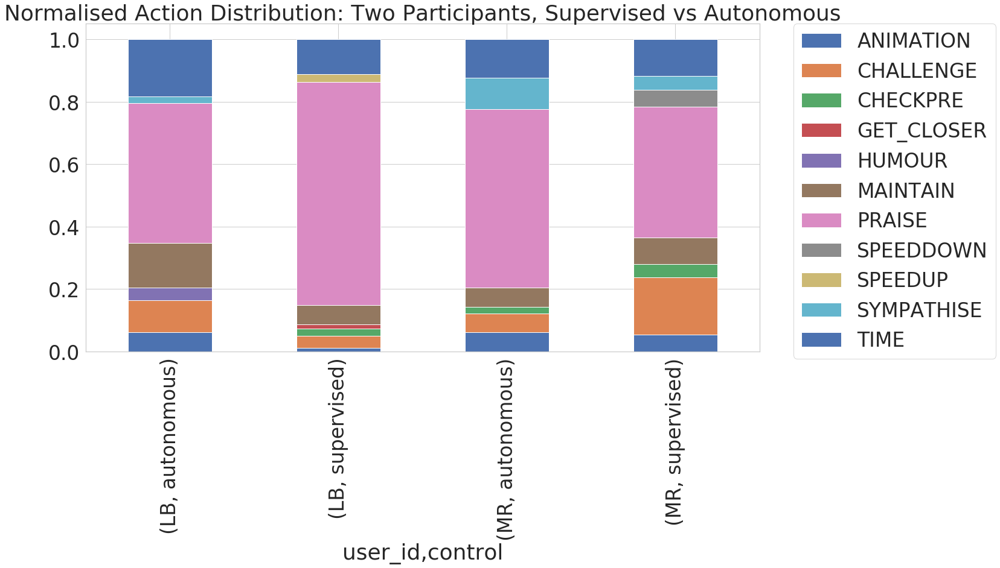

In [59]:
# single (same/similar) supervised and autonomous session comparison for LB and MR to match table in thesis (LB ML-S 18, ML-A 23 and MR ML-S 18, ML-A 22)
LB_18 = action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']==18) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['validation']!='CONTROL') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
LB_23 = action_log_df[(action_log_df['user_id']=='LB') & (action_log_df['session_number']==23) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['validation']!='CONTROL') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
MR_18 = action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']==18) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['validation']!='CONTROL') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()
MR_22 = action_log_df[(action_log_df['user_id']=='MR') & (action_log_df['session_number']==22) & (action_log_df['validation']!='CONTROL') & (action_log_df['validation']!='STYLE_UPDATE') & (action_log_df['validation']!='CONTROL') & (action_log_df['action']!='RUN') & (action_log_df['action']!='WALK')].copy()

LB_18['control'] = 'supervised'
LB_23['control'] = 'autonomous'
MR_18['control'] = 'supervised'
MR_22['control'] = 'autonomous'

lbmr_comp = pd.concat([LB_18,LB_23,MR_18,MR_22])

plt = lbmr_comp.groupby(["user_id","control"])["action"].value_counts(normalize=True).unstack().plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.set_title("Normalised Action Distribution: Two Participants, Supervised vs Autonomous")

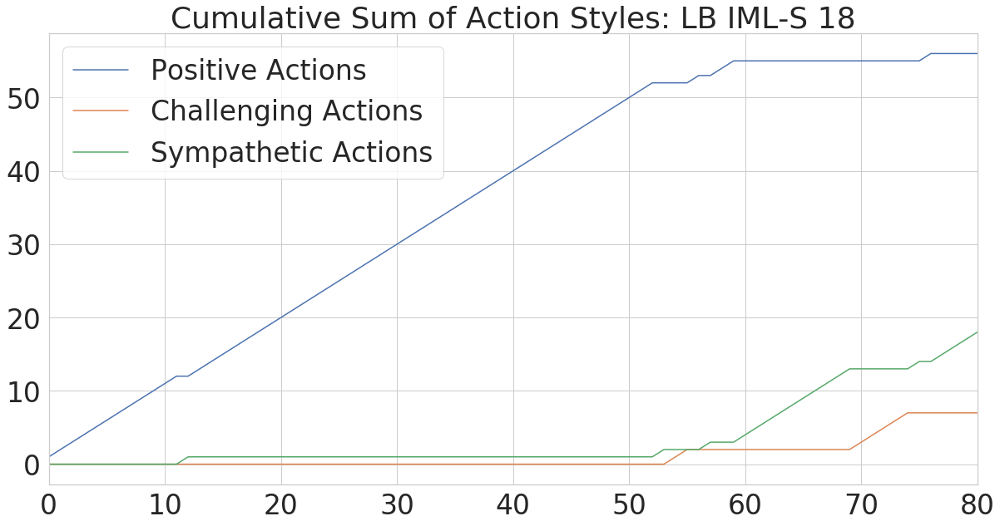

In [62]:
# timing: cumulative action/style type for those above sessions
positive_count = 0
challenging_count = 0
sympathetic_count = 0

for index, row in  LB_18.iterrows():
    if LB_18.loc[index,'style'] == "POSITIVE":
        positive_count += 1
        LB_18.loc[index,'positive_count'] = positive_count
        LB_18.loc[index,'challenging_count'] = challenging_count
        LB_18.loc[index,'sympathetic_count'] = sympathetic_count
    elif LB_18.loc[index,'style'] == "CHALLENGING":
        challenging_count += 1
        LB_18.loc[index,'positive_count'] = positive_count
        LB_18.loc[index,'challenging_count'] = challenging_count
        LB_18.loc[index,'sympathetic_count'] = sympathetic_count
    elif LB_18.loc[index,'style'] == "SYMPATHETIC":
        sympathetic_count += 1
        LB_18.loc[index,'positive_count'] = positive_count
        LB_18.loc[index,'challenging_count'] = challenging_count
        LB_18.loc[index,'sympathetic_count'] = sympathetic_count
        
LB_18.reset_index(drop=True,inplace=True)

positive_list = LB_18['positive_count'].tolist()
challenging_list = LB_18['challenging_count'].tolist()
sympathetic_list = LB_18['sympathetic_count'].tolist()

plotting_df = pd.DataFrame({
        'Positive Actions' : positive_list,
        'Challenging Actions' : challenging_list,
        'Sympathetic Actions' : sympathetic_list
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Action Styles: LB IML-S 18")        


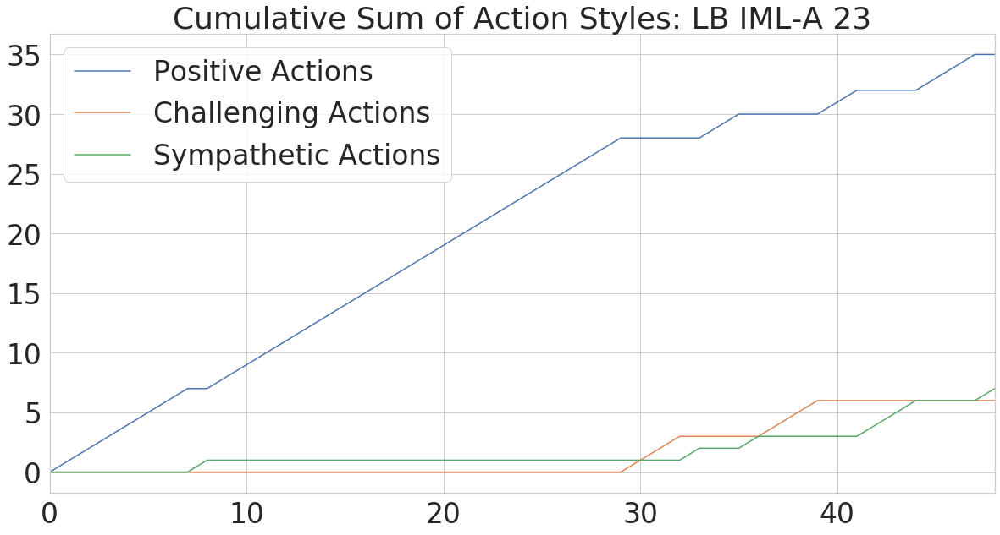

In [72]:
positive_count = 0
challenging_count = 0
sympathetic_count = 0

for index, row in  LB_23.iterrows():
    if LB_23.loc[index,'style'] == "POSITIVE":
        positive_count += 1
        LB_23.loc[index,'positive_count'] = positive_count
        LB_23.loc[index,'challenging_count'] = challenging_count
        LB_23.loc[index,'sympathetic_count'] = sympathetic_count
    elif LB_23.loc[index,'style'] == "CHALLENGING":
        challenging_count += 1
        LB_23.loc[index,'positive_count'] = positive_count
        LB_23.loc[index,'challenging_count'] = challenging_count
        LB_23.loc[index,'sympathetic_count'] = sympathetic_count
    elif LB_23.loc[index,'style'] == "SYMPATHETIC":
        sympathetic_count += 1
        LB_23.loc[index,'positive_count'] = positive_count
        LB_23.loc[index,'challenging_count'] = challenging_count
        LB_23.loc[index,'sympathetic_count'] = sympathetic_count
        
LB_23.reset_index(drop=True,inplace=True)

positive_list = LB_23['positive_count'].tolist()
challenging_list = LB_23['challenging_count'].tolist()
sympathetic_list = LB_23['sympathetic_count'].tolist()

challenging_list=challenging_list-np.ones(len(challenging_list))

plotting_df = pd.DataFrame({
        'Positive Actions' : positive_list,
        'Challenging Actions' : challenging_list,
        'Sympathetic Actions' : sympathetic_list
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Action Styles: LB IML-A 23")   

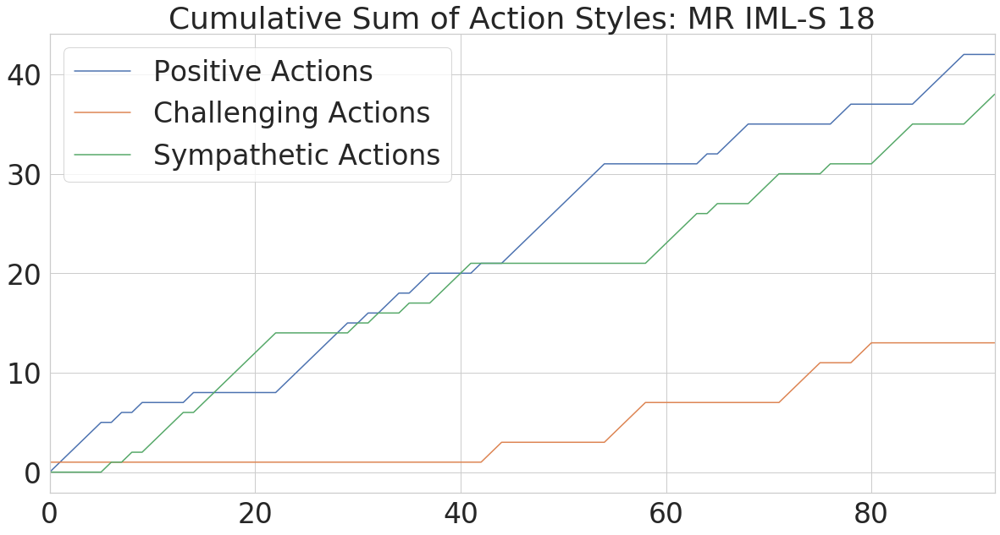

In [73]:
positive_count = 0
challenging_count = 0
sympathetic_count = 0

for index, row in  MR_18.iterrows():
    if MR_18.loc[index,'style'] == "POSITIVE":
        positive_count += 1
        MR_18.loc[index,'positive_count'] = positive_count
        MR_18.loc[index,'challenging_count'] = challenging_count
        MR_18.loc[index,'sympathetic_count'] = sympathetic_count
    elif MR_18.loc[index,'style'] == "CHALLENGING":
        challenging_count += 1
        MR_18.loc[index,'positive_count'] = positive_count
        MR_18.loc[index,'challenging_count'] = challenging_count
        MR_18.loc[index,'sympathetic_count'] = sympathetic_count
    elif MR_18.loc[index,'style'] == "SYMPATHETIC":
        sympathetic_count += 1
        MR_18.loc[index,'positive_count'] = positive_count
        MR_18.loc[index,'challenging_count'] = challenging_count
        MR_18.loc[index,'sympathetic_count'] = sympathetic_count
        
MR_18.reset_index(drop=True,inplace=True)

positive_list = MR_18['positive_count'].tolist()
challenging_list = MR_18['challenging_count'].tolist()
sympathetic_list = MR_18['sympathetic_count'].tolist()

#challenging_list=challenging_list-np.ones(len(challenging_list))

plotting_df = pd.DataFrame({
        'Positive Actions' : positive_list,
        'Challenging Actions' : challenging_list,
        'Sympathetic Actions' : sympathetic_list
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Action Styles: MR IML-S 18")   

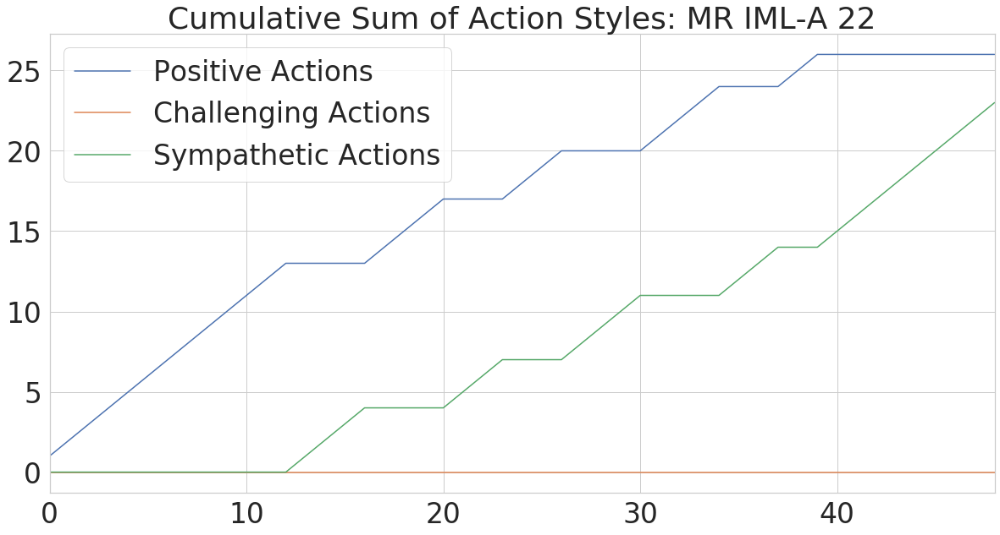

In [75]:
positive_count = 0
challenging_count = 0
sympathetic_count = 0

for index, row in  MR_22.iterrows():
    if MR_22.loc[index,'style'] == "POSITIVE":
        positive_count += 1
        MR_22.loc[index,'positive_count'] = positive_count
        MR_22.loc[index,'challenging_count'] = challenging_count
        MR_22.loc[index,'sympathetic_count'] = sympathetic_count
    elif MR_22.loc[index,'style'] == "CHALLENGING":
        challenging_count += 1
        MR_22.loc[index,'positive_count'] = positive_count
        MR_22.loc[index,'challenging_count'] = challenging_count
        MR_22.loc[index,'sympathetic_count'] = sympathetic_count
    elif MR_22.loc[index,'style'] == "SYMPATHETIC":
        sympathetic_count += 1
        MR_22.loc[index,'positive_count'] = positive_count
        MR_22.loc[index,'challenging_count'] = challenging_count
        MR_22.loc[index,'sympathetic_count'] = sympathetic_count
        
MR_22.reset_index(drop=True,inplace=True)

positive_list = MR_22['positive_count'].tolist()
challenging_list = MR_22['challenging_count'].tolist()
sympathetic_list = MR_22['sympathetic_count'].tolist()

#challenging_list=challenging_list-np.ones(len(challenging_list))

plotting_df = pd.DataFrame({
        'Positive Actions' : positive_list,
        'Challenging Actions' : challenging_list,
        'Sympathetic Actions' : sympathetic_list
    })

lines = plotting_df.plot.line(title="Cumulative Sum of Action Styles: MR IML-A 22")  

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: LB')

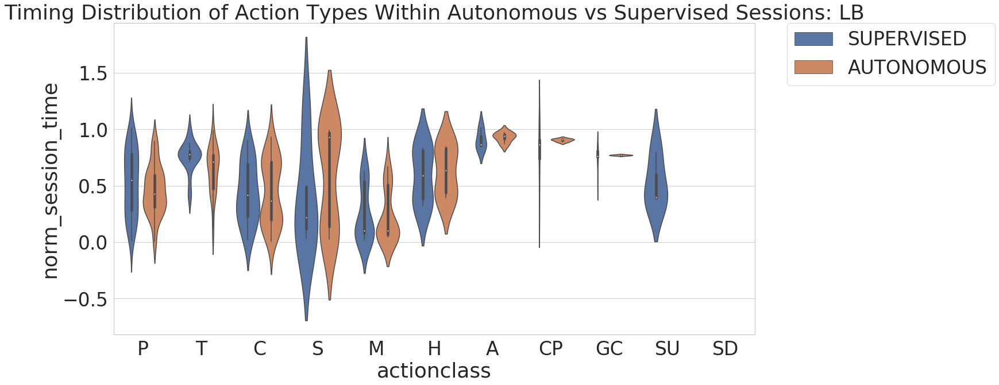

In [118]:
# violin plot showing normalised actions distribution *across session time*
# says something about which actions to use when, and whether autonomous system did this too 

# load csv of within-participant autonomous and supervised actions to compare
# for LB = auto 23,24,26 vs spvd 19, 21, 22
# OR DOES IT MAKE MORE SENSE JUST TO DO ONE SESSION COMPARISON I.E. 22 VS 23 FOR MAX SIMILARITY(?)

LB_action_timeline_df = pd.read_csv('LB_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = LB_action_timeline_df[LB_action_timeline_df['actionclass'] == 'RUN' ].index
LB_action_timeline_df.drop(indexNames , inplace=True)

indexNames = LB_action_timeline_df[LB_action_timeline_df['actionclass'] == 'WALK' ].index
LB_action_timeline_df.drop(indexNames , inplace=True)

indexNames = LB_action_timeline_df[LB_action_timeline_df['validation'] == 'REFUSED' ].index
LB_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
LB_action_timeline_df['actionclass']=LB_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time", order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], hue ='condition', data=LB_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: LB")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: FB')

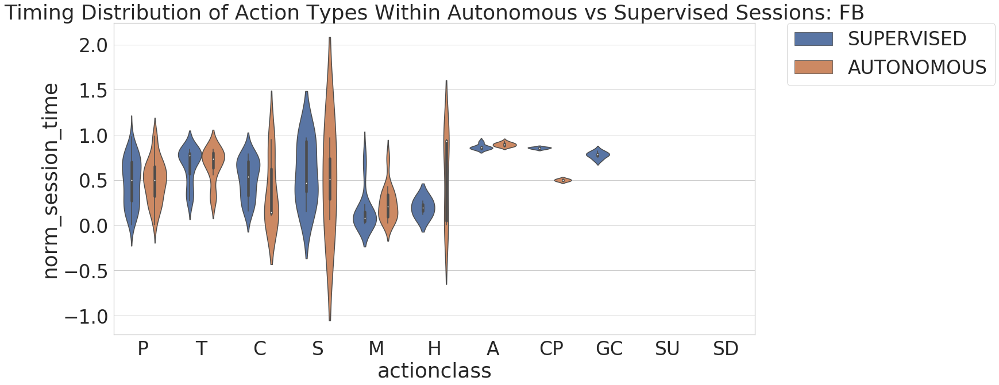

In [95]:
# for FB = auto 22, 23, 25 vs spvd 19, 20, 21

FB_action_timeline_df = pd.read_csv('FB_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = FB_action_timeline_df[FB_action_timeline_df['actionclass'] == 'RUN' ].index
FB_action_timeline_df.drop(indexNames , inplace=True)

indexNames = FB_action_timeline_df[FB_action_timeline_df['actionclass'] == 'WALK' ].index
FB_action_timeline_df.drop(indexNames , inplace=True)

indexNames = FB_action_timeline_df[FB_action_timeline_df['validation'] == 'REFUSED' ].index
FB_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
FB_action_timeline_df['actionclass']=FB_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time", order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], hue ='condition', data=FB_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: FB")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: DB')

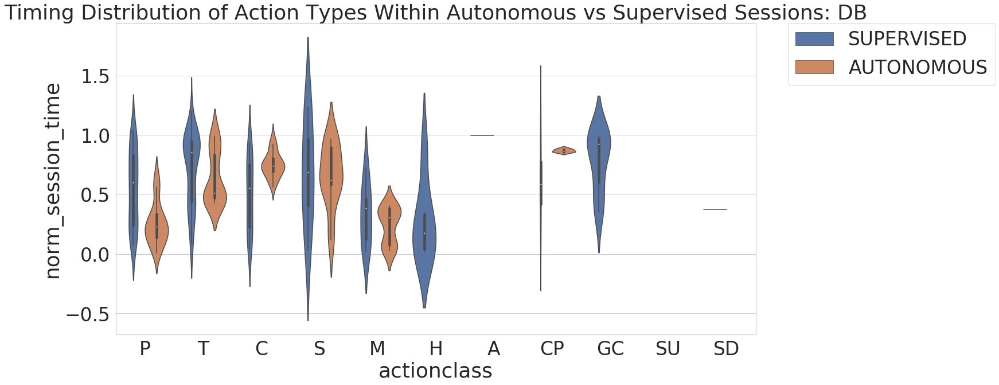

In [96]:
# for DB = auto 19,20,22 vs spvd 15, 16, 17
DB_action_timeline_df = pd.read_csv('DB_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = DB_action_timeline_df[DB_action_timeline_df['actionclass'] == 'RUN' ].index
DB_action_timeline_df.drop(indexNames , inplace=True)

indexNames = DB_action_timeline_df[DB_action_timeline_df['actionclass'] == 'WALK' ].index
DB_action_timeline_df.drop(indexNames , inplace=True)

indexNames = DB_action_timeline_df[DB_action_timeline_df['validation'] == 'REFUSED' ].index
DB_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
DB_action_timeline_df['actionclass']=DB_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time", order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], hue ='condition', data=DB_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: DB")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: JF')

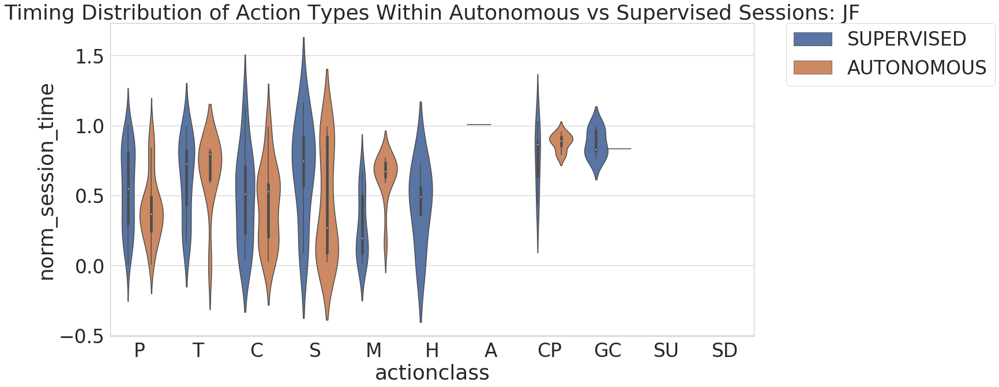

In [97]:
# for JF = auto 23,24,26 vs spvd 20,21,22
JF_action_timeline_df = pd.read_csv('JF_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = JF_action_timeline_df[JF_action_timeline_df['actionclass'] == 'RUN' ].index
JF_action_timeline_df.drop(indexNames , inplace=True)

indexNames = JF_action_timeline_df[JF_action_timeline_df['actionclass'] == 'WALK' ].index
JF_action_timeline_df.drop(indexNames , inplace=True)

indexNames = JF_action_timeline_df[JF_action_timeline_df['validation'] == 'REFUSED' ].index
JF_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
JF_action_timeline_df['actionclass']=JF_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time", order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], hue ='condition', data=JF_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: JF")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: MR')

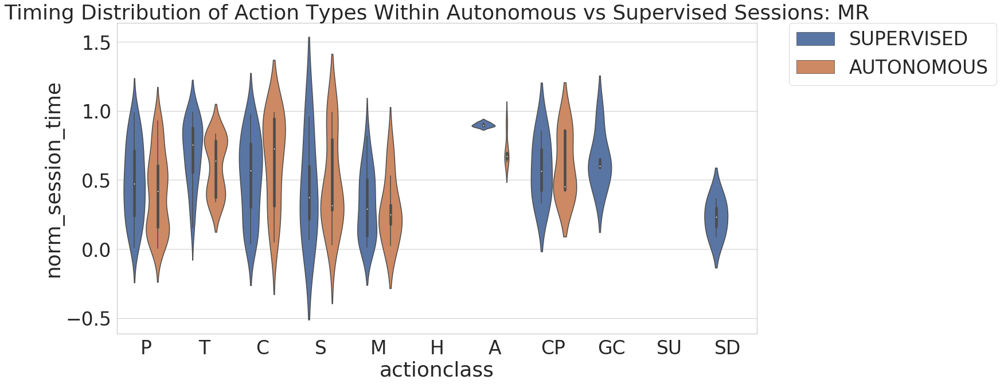

In [98]:
# for MR = auto 19,20,22 vs spvd 16,17,18
MR_action_timeline_df = pd.read_csv('MR_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = MR_action_timeline_df[MR_action_timeline_df['actionclass'] == 'RUN' ].index
MR_action_timeline_df.drop(indexNames , inplace=True)

indexNames = MR_action_timeline_df[MR_action_timeline_df['actionclass'] == 'WALK' ].index
MR_action_timeline_df.drop(indexNames , inplace=True)

indexNames = MR_action_timeline_df[MR_action_timeline_df['validation'] == 'REFUSED' ].index
MR_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
MR_action_timeline_df['actionclass']=MR_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time", order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], hue ='condition', data=MR_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: MR")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: DP')

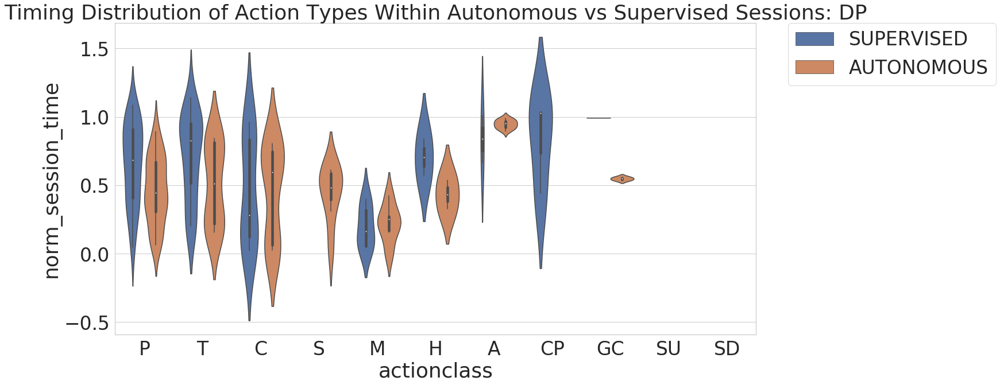

In [99]:
# for DP = auto 25,26 vs spvd 20, 21
DP_action_timeline_df = pd.read_csv('DP_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = DP_action_timeline_df[DP_action_timeline_df['actionclass'] == 'RUN' ].index
DP_action_timeline_df.drop(indexNames , inplace=True)

indexNames = DP_action_timeline_df[DP_action_timeline_df['actionclass'] == 'WALK' ].index
DP_action_timeline_df.drop(indexNames , inplace=True)

indexNames = DP_action_timeline_df[DP_action_timeline_df['validation'] == 'REFUSED' ].index
DP_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
DP_action_timeline_df['actionclass']=DP_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time",order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], hue ='condition', data=DP_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: DP")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: JW')

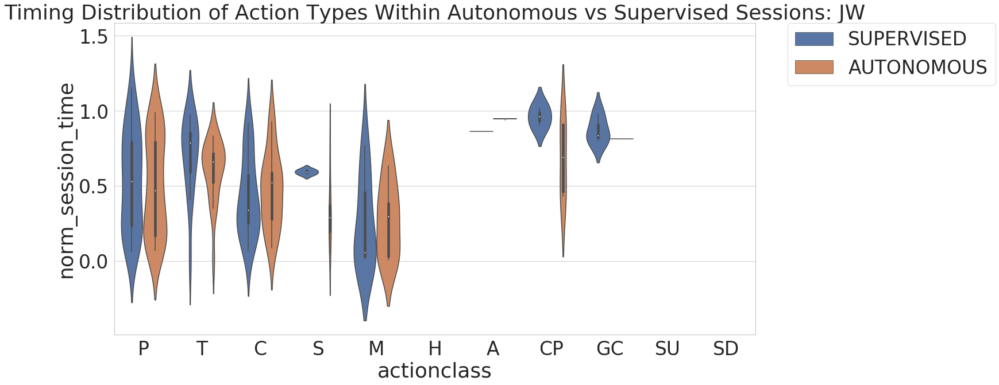

In [100]:
# for JW = auto 23,24 vs spvd 21,22
JW_action_timeline_df = pd.read_csv('JW_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = JW_action_timeline_df[JW_action_timeline_df['actionclass'] == 'RUN' ].index
JW_action_timeline_df.drop(indexNames , inplace=True)

indexNames = JW_action_timeline_df[JW_action_timeline_df['actionclass'] == 'WALK' ].index
JW_action_timeline_df.drop(indexNames , inplace=True)

indexNames = JW_action_timeline_df[JW_action_timeline_df['validation'] == 'REFUSED' ].index
JW_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
JW_action_timeline_df['actionclass']=JW_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time", hue ='condition', order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], data=JW_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: JW")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: GB')

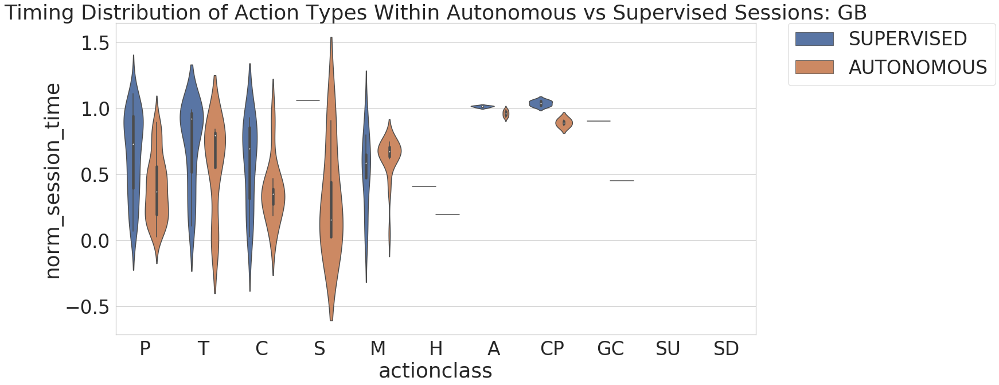

In [177]:
# for GB = auto 24,25,27 vs spvd 19,20,21
GB_action_timeline_df = pd.read_csv('GB_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = GB_action_timeline_df[GB_action_timeline_df['actionclass'] == 'RUN' ].index
GB_action_timeline_df.drop(indexNames , inplace=True)

indexNames = GB_action_timeline_df[GB_action_timeline_df['actionclass'] == 'WALK' ].index
GB_action_timeline_df.drop(indexNames , inplace=True)

indexNames = GB_action_timeline_df[GB_action_timeline_df['validation'] == 'REFUSED' ].index
GB_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
GB_action_timeline_df['actionclass']=GB_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time", order=['P','T','C','S','M','H','A','CP','GC','SU','SD'],  hue ='condition', data=GB_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: GB")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: PT')

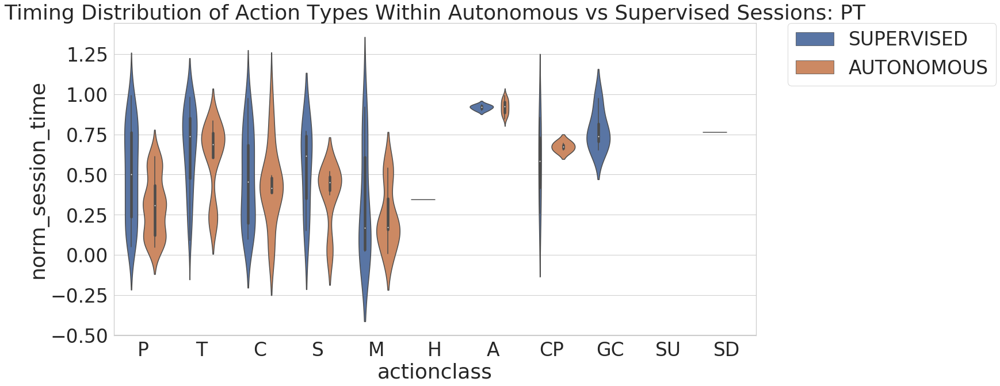

In [102]:
# for PT = auto 19,20,22 vs spvd 16,17,18
PT_action_timeline_df = pd.read_csv('PT_timeline_comp.csv', names=['user_id','session_number','session_time','norm_session_time','actionclass',\
	'style','validation','condition'])

# drop any refused actions, walks and runs
indexNames = PT_action_timeline_df[PT_action_timeline_df['actionclass'] == 'RUN' ].index
PT_action_timeline_df.drop(indexNames , inplace=True)

indexNames = PT_action_timeline_df[PT_action_timeline_df['actionclass'] == 'WALK' ].index
PT_action_timeline_df.drop(indexNames , inplace=True)

indexNames = PT_action_timeline_df[PT_action_timeline_df['validation'] == 'REFUSED' ].index
PT_action_timeline_df.drop(indexNames , inplace=True)

# shorten action names
PT_action_timeline_df['actionclass']=PT_action_timeline_df['actionclass'].apply(lambda x: "T" if x == "TIME" else ("P" if x == "PRAISE" else ("C" if x == "CHALLENGE" else ("M" if x == "MAINTAIN" else ("H" if x == "HUMOUR" else ("CP" if x == "CHECKPRE" else ("GC" if x == "GET_CLOSER" else ("SD" if x == "SPEEDDOWN" else ("S" if x == "SYMPATHISE" else ("A" if x == "ANIMATION" else ("SU" if x == "SPEEDUP" else "BO")))))))))))

ax = sns.violinplot(x="actionclass", y="norm_session_time", order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], hue ='condition', data=PT_action_timeline_df)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions: PT")

Text(0.5, 1.0, 'Timing Distribution of Action Types Within Autonomous vs Supervised Sessions (All Participants)')

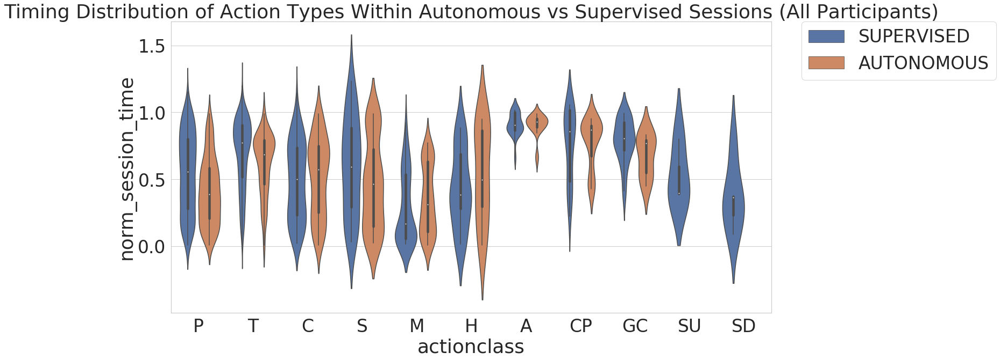

In [168]:
# all supervised versus autonomous comparisons

all_users_timeline=pd.concat([LB_action_timeline_df, FB_action_timeline_df, DB_action_timeline_df ,JF_action_timeline_df, MR_action_timeline_df ,DP_action_timeline_df , JW_action_timeline_df , GB_action_timeline_df, PT_action_timeline_df])
ax = sns.violinplot(x="actionclass", y="norm_session_time", order=['P','T','C','S','M','H','A','CP','GC','SU','SD'], hue ='condition', data=all_users_timeline)

ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax.set_title("Timing Distribution of Action Types Within Autonomous vs Supervised Sessions (All Participants)")

In [194]:
# clustering action styles and user personalities
all_users_timeline

for index, row in  all_users_timeline.iterrows():
    print(all_users_timeline.loc[index,'norm_session_time'])

0    0.016662
0    0.015831
0    0.026665
0    0.007637
0    0.055998
0    0.042360
Name: norm_session_time, dtype: float64
1    0.027995
1    0.015553
1    0.032665
1    0.153331
1    0.084027
Name: norm_session_time, dtype: float64
2    0.073995
2    0.073330
2    0.075331
2    0.054860
2    0.047998
2    0.155332
2    0.088193
Name: norm_session_time, dtype: float64
3    0.131328
3    0.075830
3    0.087331
3    0.082637
3    0.053998
3    0.241998
Name: norm_session_time, dtype: float64
4    0.181995
4    0.032776
4    0.086110
4    0.119998
4    0.245998
4    0.125693
Name: norm_session_time, dtype: float64
5    0.185329
5    0.116664
5    0.109027
5    0.121998
5    0.273998
Name: norm_session_time, dtype: float64
6    0.226662
6    0.048887
6    0.155831
6    0.128665
6    0.281998
6    0.067999
6    0.149999
Name: norm_session_time, dtype: float64
9    0.279329
9    0.271998
9    0.419998
9    0.174305
Name: norm_session_time, dtype: float64
12    0.315995
12    0.094442
12    

Name: norm_session_time, dtype: float64
385    0.732827
385    0.753029
385    0.732826
385    0.561665
Name: norm_session_time, dtype: float64
386    0.753029
386    0.773231
386    0.753028
386    0.583888
Name: norm_session_time, dtype: float64
387    0.773231
387    0.793433
387    0.773230
387    0.606110
Name: norm_session_time, dtype: float64
388    0.793433
388    0.813635
388    0.793432
388    0.628332
Name: norm_session_time, dtype: float64
389    0.813635
389    0.833837
389    0.813634
389    0.650555
Name: norm_session_time, dtype: float64
390    0.833837
390    0.833836
390    0.672776
Name: norm_session_time, dtype: float64
392    0.867675
392    0.887878
392    0.867674
392    0.717221
Name: norm_session_time, dtype: float64
393    0.887878
393    0.908080
393    0.887877
393    0.739443
Name: norm_session_time, dtype: float64
394    0.908080
394    0.928282
394    0.908079
394    0.761666
Name: norm_session_time, dtype: float64
395    0.928282
395    0.948483
395    0

Name: norm_session_time, dtype: float64
185    0.755796
185    0.416664
185    0.652856
185    0.652008
185    0.449999
Name: norm_session_time, dtype: float64
188    0.737777
188    0.816665
188    0.447220
188    0.709999
188    0.712614
188    0.510604
188    0.446110
Name: norm_session_time, dtype: float64
189    0.745554
189    0.321665
189    0.819563
189    0.729046
189    0.732816
189    0.530807
Name: norm_session_time, dtype: float64
193    0.881158
193    0.805237
193    0.813624
193    0.611615
Name: norm_session_time, dtype: float64
194    0.884056
194    0.748331
194    0.507775
194    0.824284
194    0.833826
194    0.631817
194    0.487777
Name: norm_session_time, dtype: float64
195    0.774999
195    0.888404
195    0.507775
195    0.843332
195    0.652019
Name: norm_session_time, dtype: float64
196    0.776110
196    0.902896
196    0.516664
196    0.867664
196    0.672220
Name: norm_session_time, dtype: float64
197    0.784443
197    0.905795
197    0.776109
197    0

Name: norm_session_time, dtype: float64
84    0.617776
84    0.146526
84    1.007998
84    0.090576
84    0.279705
Name: norm_session_time, dtype: float64
85    0.066666
85    0.619442
85    0.148609
85    1.027331
85    0.119562
85    0.333332
85    0.284778
Name: norm_session_time, dtype: float64
86    0.171525
86    1.103998
86    0.315331
86    0.299270
Name: norm_session_time, dtype: float64
89    0.219443
89    1.140665
89    0.199997
89    0.342928
89    0.895997
89    0.349272
Name: norm_session_time, dtype: float64
91    0.116666
91    1.166665
91    0.238402
91    0.375998
91    0.386951
Name: norm_session_time, dtype: float64
96    0.361109
96    0.013331
96    0.307242
Name: norm_session_time, dtype: float64
98    0.167221
98    0.717775
98    0.406248
98    0.031109
98    0.480665
98    0.529705
Name: norm_session_time, dtype: float64
99    0.718887
99    0.437498
99    0.034442
99    0.356518
99    0.435857
99    0.964663
Name: norm_session_time, dtype: float64
102    0.1

Name: norm_session_time, dtype: float64
404    0.106564
404    0.126767
404    0.100475
404    0.968332
Name: norm_session_time, dtype: float64
405    0.126766
405    0.146968
405    0.119523
405    0.990555
Name: norm_session_time, dtype: float64
406    0.146968
406    0.167171
406    0.138570
406    0.005554
Name: norm_session_time, dtype: float64
407    0.167170
407    0.187373
407    0.157618
407    0.025756
Name: norm_session_time, dtype: float64
408    0.187372
408    0.207575
408    0.176666
408    0.045958
Name: norm_session_time, dtype: float64
409    0.207574
409    0.227777
409    0.195713
409    0.066160
Name: norm_session_time, dtype: float64
410    0.227777
410    0.247979
410    0.214761
410    0.086362
Name: norm_session_time, dtype: float64
411    0.247978
411    0.268181
411    0.233808
411    0.106564
Name: norm_session_time, dtype: float64
412    0.268181
412    0.288383
412    0.252856
412    0.126766
Name: norm_session_time, dtype: float64
413    0.288382
413    0

218    0.139442
218    0.023230
218    0.762220
218    0.271904
218    0.308585
218    0.100475
218    0.658332
Name: norm_session_time, dtype: float64
219    0.049987
219    0.161665
219    0.042927
219    0.782219
219    0.290951
219    0.328787
219    0.119523
Name: norm_session_time, dtype: float64
220    0.183887
220    0.060604
220    0.783886
220    0.309999
220    0.348989
220    0.138570
Name: norm_session_time, dtype: float64
221    0.080794
221    0.566110
221    0.206109
221    0.080806
221    0.793886
221    0.329047
221    0.369191
221    0.157618
Name: norm_session_time, dtype: float64
222    0.085340
222    0.567221
222    0.228331
222    0.087877
222    0.794441
222    0.348094
222    0.389393
222    0.176666
Name: norm_session_time, dtype: float64
224    0.272776
224    0.811108
224    0.386190
224    0.429796
224    0.214761
224    0.689443
Name: norm_session_time, dtype: float64
225    0.138370
225    0.294998
225    0.822775
225    0.405237
225    0.449999
225    0

80    0.032221
80    0.989331
80    0.036953
80    0.204665
80    0.809330
80    0.096371
Name: norm_session_time, dtype: float64
82    0.602776
82    0.089582
82    0.060866
82    0.240665
82    0.198545
Name: norm_session_time, dtype: float64
83    0.120137
83    1.005331
83    0.277332
83    0.843997
83    0.225357
Name: norm_session_time, dtype: float64
86    0.171525
86    1.103998
86    0.315331
86    0.299270
Name: norm_session_time, dtype: float64
87    0.082777
87    0.177776
87    0.317998
87    0.335352
87    0.325357
Name: norm_session_time, dtype: float64
90    0.223609
90    0.367998
90    0.900663
90    0.370284
Name: norm_session_time, dtype: float64
91    0.116666
91    1.166665
91    0.238402
91    0.375998
91    0.386951
Name: norm_session_time, dtype: float64
92    0.118888
92    0.681109
92    0.249998
92    0.241301
92    0.399998
92    0.903997
92    0.410140
Name: norm_session_time, dtype: float64
94    0.428665
94    0.375252
94    0.932663
94    0.439851
Name:

128    0.947915
128    0.846373
128    0.727776
128    0.613332
128    0.969560
Name: norm_session_time, dtype: float64
129    0.381110
129    0.857220
129    0.964581
129    0.849997
129    0.909332
129    0.767676
129    0.616665
129    0.981879
Name: norm_session_time, dtype: float64
131    0.385554
131    0.864998
131    0.979165
131    0.302220
131    0.892026
131    0.920665
131    0.769696
131    0.651999
Name: norm_session_time, dtype: float64
132    0.870553
132    0.986109
132    0.773231
132    0.752665
Name: norm_session_time, dtype: float64
134    0.916663
134    0.783332
134    0.021110
Name: norm_session_time, dtype: float64
137    0.039129
137    0.936953
137    0.802524
137    0.797332
137    0.048888
Name: norm_session_time, dtype: float64
138    0.058694
138    0.961998
138    0.803030
138    0.050554
Name: norm_session_time, dtype: float64
141    0.933887
141    0.971011
141    0.980665
141    0.821716
Name: norm_session_time, dtype: float64
142    0.465554
142    0

157    0.351448
157    0.119523
157    0.086351
157    1.005332
157    0.215554
Name: norm_session_time, dtype: float64
159    0.564999
159    0.365216
159    0.505553
159    0.154442
159    0.157618
159    0.126755
159    1.014665
Name: norm_session_time, dtype: float64
160    0.382607
160    0.507220
160    0.155553
160    0.176665
160    0.146957
160    1.015999
Name: norm_session_time, dtype: float64
161    0.384056
161    0.195713
161    0.167159
161    1.051332
Name: norm_session_time, dtype: float64
163    0.583888
163    0.417390
163    0.191664
163    0.233808
163    0.207563
163    0.005554
Name: norm_session_time, dtype: float64
164    0.154999
164    0.418114
164    0.252856
164    0.227765
164    0.025756
164    0.252221
Name: norm_session_time, dtype: float64
165    0.159444
165    0.216664
165    0.271904
165    0.247967
165    0.045958
Name: norm_session_time, dtype: float64
166    0.457245
166    0.549998
166    0.232220
166    0.290951
166    0.268170
166    0.066160


Name: norm_session_time, dtype: float64
88    0.171736
88    0.346372
Name: norm_session_time, dtype: float64
89    0.219443
89    1.140665
89    0.199997
89    0.342928
89    0.895997
89    0.349272
Name: norm_session_time, dtype: float64
90    0.223609
90    0.367998
90    0.900663
90    0.370284
Name: norm_session_time, dtype: float64
91    0.116666
91    1.166665
91    0.238402
91    0.375998
91    0.386951
Name: norm_session_time, dtype: float64
92    0.118888
92    0.681109
92    0.249998
92    0.241301
92    0.399998
92    0.903997
92    0.410140
Name: norm_session_time, dtype: float64
94    0.428665
94    0.375252
94    0.932663
94    0.439851
Name: norm_session_time, dtype: float64
95    0.343748
95    0.302170
95    0.447096
Name: norm_session_time, dtype: float64
97    0.384720
97    0.954663
97    0.473908
Name: norm_session_time, dtype: float64
98    0.167221
98    0.717775
98    0.406248
98    0.031109
98    0.480665
98    0.529705
Name: norm_session_time, dtype: float64


Name: norm_session_time, dtype: float64
387    0.773231
387    0.793433
387    0.773230
387    0.606110
Name: norm_session_time, dtype: float64
388    0.793433
388    0.813635
388    0.793432
388    0.628332
Name: norm_session_time, dtype: float64
389    0.813635
389    0.833837
389    0.813634
389    0.650555
Name: norm_session_time, dtype: float64
390    0.833837
390    0.833836
390    0.672776
Name: norm_session_time, dtype: float64
391    0.867676
391    0.694999
Name: norm_session_time, dtype: float64
392    0.867675
392    0.887878
392    0.867674
392    0.717221
Name: norm_session_time, dtype: float64
393    0.887878
393    0.908080
393    0.887877
393    0.739443
Name: norm_session_time, dtype: float64
394    0.908080
394    0.928282
394    0.908079
394    0.761666
Name: norm_session_time, dtype: float64
395    0.928282
395    0.948483
395    0.928281
395    0.783888
Name: norm_session_time, dtype: float64
396    0.948483
396    0.968686
396    0.948483
396    0.806110
Name: no

In [192]:
# average, cumulative sum of action types through a normalised session length (across all participants, supervised versus autonomus)
spvd_count=pd.DataFrame()
auto_count=pd.DataFrame()

spvd_count['0.25_praise_count'] = 0
spvd_count['0.25_time_count'] = 0
spvd_count['0.25_challenge_count'] = 0
spvd_count['0.25_sympathise_count'] = 0
spvd_count['0.25_maintain_count'] = 0
spvd_count['0.25_humour_count'] = 0
spvd_count['0.25_animation_count'] = 0
spvd_count['0.25_checkpre_count'] = 0
spvd_count['0.25_getcloser_count'] = 0
spvd_count['0.25_speedup_count'] = 0
spvd_count['0.25_speeddown_count'] = 0
spvd_count['0.25_backoff_count'] = 0

auto_count['0.25_praise_count'] = 0
auto_count['0.25_time_count'] = 0
auto_count['0.25_challenge_count'] = 0
auto_count['0.25_sympathise_count'] = 0
auto_count['0.25_maintain_count'] = 0
auto_count['0.25_humour_count'] = 0
auto_count['0.25_animation_count'] = 0
auto_count['0.25_checkpre_count'] = 0
auto_count['0.25_getcloser_count'] = 0
auto_count['0.25_speedup_count'] = 0
auto_count['0.25_speeddown_count'] = 0
auto_count['0.25_backoff_count'] = 0

spvd_count['0.5_praise_count'] = 0
spvd_count['0.5_time_count'] = 0
spvd_count['0.5_challenge_count'] = 0
spvd_count['0.5_sympathise_count'] = 0
spvd_count['0.5_maintain_count'] = 0
spvd_count['0.5_humour_count'] = 0
spvd_count['0.5_animation_count'] = 0
spvd_count['0.5_checkpre_count'] = 0
spvd_count['0.5_getcloser_count'] = 0
spvd_count['0.5_speedup_count'] = 0
spvd_count['0.5_speeddown_count'] = 0
spvd_count['0.5_backoff_count'] = 0

auto_count['0.5_praise_count'] = 0
auto_count['0.5_time_count'] = 0
auto_count['0.5_challenge_count'] = 0
auto_count['0.5_sympathise_count'] = 0
auto_count['0.5_maintain_count'] = 0
auto_count['0.5_humour_count'] = 0
auto_count['0.5_animation_count'] = 0
auto_count['0.5_checkpre_count'] = 0
auto_count['0.5_getcloser_count'] = 0
auto_count['0.5_speedup_count'] = 0
auto_count['0.5_speeddown_count'] = 0
auto_count['0.5_backoff_count'] = 0

spvd_count['0.75_praise_count'] = 0
spvd_count['0.75_time_count'] = 0
spvd_count['0.75_challenge_count'] = 0
spvd_count['0.75_sympathise_count'] = 0
spvd_count['0.75_maintain_count'] = 0
spvd_count['0.75_humour_count'] = 0
spvd_count['0.75_animation_count'] = 0
spvd_count['0.75_checkpre_count'] = 0
spvd_count['0.75_getcloser_count'] = 0
spvd_count['0.75_speedup_count'] = 0
spvd_count['0.75_speeddown_count'] = 0
spvd_count['0.75_backoff_count'] = 0

auto_count['0.75_praise_count'] = 0
auto_count['0.75_time_count'] = 0
auto_count['0.75_challenge_count'] = 0
auto_count['0.75_sympathise_count'] = 0
auto_count['0.75_maintain_count'] = 0
auto_count['0.75_humour_count'] = 0
auto_count['0.75_animation_count'] = 0
auto_count['0.75_checkpre_count'] = 0
auto_count['0.75_getcloser_count'] = 0
auto_count['0.75_speedup_count'] = 0
auto_count['0.75_speeddown_count'] = 0
auto_count['0.75_backoff_count'] = 0

spvd_count['1_praise_count'] = 0
spvd_count['1_time_count'] = 0
spvd_count['1_challenge_count'] = 0
spvd_count['1_sympathise_count'] = 0
spvd_count['1_maintain_count'] = 0
spvd_count['1_humour_count'] = 0
spvd_count['1_animation_count'] = 0
spvd_count['1_checkpre_count'] = 0
spvd_count['1_getcloser_count'] = 0
spvd_count['1_speedup_count'] = 0
spvd_count['1_speeddown_count'] = 0
spvd_count['1_backoff_count'] = 0

auto_count['1_praise_count'] = 0
auto_count['1_time_count'] = 0
auto_count['1_challenge_count'] = 0
auto_count['1_sympathise_count'] = 0
auto_count['1_maintain_count'] = 0
auto_count['1_humour_count'] = 0
auto_count['1_animation_count'] = 0
auto_count['1_checkpre_count'] = 0
auto_count['1_getcloser_count'] = 0
auto_count['1_speedup_count'] = 0
auto_count['1_speeddown_count'] = 0
auto_count['1_backoff_count'] = 0


for index, row in  all_users_timeline.iterrows():
    if all_users_timeline.loc[index,'norm_session_time'] <= 0.25:
        if all_users_timeline.loc[index,'condition'] == 'SUPERVISED':
            if all_users_timeline.loc[index,'action'] == 'PRAISE':
                spvd_count['0.25_praise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'TIME':
                spvd_count['0.25_time_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHALLENGE':
                spvd_count['0.25_challenge_count'] = 0
            elif all_users_timeline.loc[index,'action'] == 'SYMPATHISE':
                spvd_count['0.25_sympathise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'MAINTAIN':
                spvd_count['0.25_maintain_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'HUMOUR':
                spvd_count['0.25_humour_count'] += 0
            elif all_users_timeline.loc[index,'action'] == 'ANIMATION':          
                spvd_count['0.25_animation_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHECKPRE':
                spvd_count['0.25_checkpre_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'GET_CLOSER':
                spvd_count['0.25_getcloser_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDUP':
                spvd_count['0.25_speedup_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDDOWN':    
                spvd_count['0.25_speeddown_count'] += 1
            else:
                spvd_count['0.25_backoff_count'] += 1
        else:
            if all_users_timeline.loc[index,'action'] == 'PRAISE':
                auto_count['0.25_praise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'TIME':
                auto_count['0.25_time_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHALLENGE':
                auto_count['0.25_challenge_count'] = 0
            elif all_users_timeline.loc[index,'action'] == 'SYMPATHISE':
                auto_count['0.25_sympathise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'MAINTAIN':
                auto_count['0.25_maintain_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'HUMOUR':
                auto_count['0.25_humour_count'] += 0
            elif all_users_timeline.loc[index,'action'] == 'ANIMATION':          
                auto_count['0.25_animation_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHECKPRE':
                auto_count['0.25_checkpre_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'GET_CLOSER':
                auto_count['0.25_getcloser_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDUP':
                auto_count['0.25_speedup_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDDOWN':    
                auto_count['0.25_speeddown_count'] += 1
            else:
                auto_count['0.25_backoff_count'] += 1
                
spvd_count['0.5_praise_count'] = spvd_count['0.25_praise_count'] 
spvd_count['0.5_time_count'] = spvd_count['0.25_time_count']
spvd_count['0.5_challenge_count'] = spvd_count['0.25_challenge_count']
spvd_count['0.5_sympathise_count'] = spvd_count['0.25_sympathise_count']
spvd_count['0.5_maintain_count'] = spvd_count['0.25_maintain_count']
spvd_count['0.5_humour_count'] = spvd_count['0.25_humour_count']
spvd_count['0.5_animation_count'] = spvd_count['0.25_animation_count'] 
spvd_count['0.5_checkpre_count'] = spvd_count['0.25_checkpre_count']
spvd_count['0.5_getcloser_count'] = spvd_count['0.25_getcloser_count']
spvd_count['0.5_speedup_count'] = spvd_count['0.25_speedup_count']
spvd_count['0.5_speeddown_count'] = spvd_count['0.25_speeddown_count']
spvd_count['0.5_backoff_count'] = spvd_count['0.25_backoff_count']

auto_count['0.5_praise_count'] = auto_count['0.25_praise_count'] 
auto_count['0.5_time_count'] = auto_count['0.25_time_count'] 
auto_count['0.5_challenge_count'] = auto_count['0.25_challenge_count']
auto_count['0.5_sympathise_count'] = auto_count['0.25_sympathise_count'] 
auto_count['0.5_maintain_count'] = auto_count['0.25_maintain_count']
auto_count['0.5_humour_count'] = auto_count['0.25_humour_count']
auto_count['0.5_animation_count'] = auto_count['0.25_animation_count']
auto_count['0.5_checkpre_count'] = auto_count['0.25_checkpre_count'] 
auto_count['0.5_getcloser_count'] = auto_count['0.25_getcloser_count']
auto_count['0.5_speedup_count'] = auto_count['0.25_speedup_count']
auto_count['0.5_speeddown_count'] = auto_count['0.25_speeddown_count']
auto_count['0.5_backoff_count'] = auto_count['0.25_backoff_count']

                
for index, row in  all_users_timeline.iterrows():          
    if 0.25 < all_users_timeline.loc[index,'norm_session_time'] <= 0.5:
        if all_users_timeline.loc[index,'condition'] == 'SUPERVISED':
            if all_users_timeline.loc[index,'action'] == 'PRAISE':
                spvd_count['0.5_praise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'TIME':
                spvd_count['0.5_time_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHALLENGE':
                spvd_count['0.5_challenge_count'] = 0
            elif all_users_timeline.loc[index,'action'] == 'SYMPATHISE':
                spvd_count['0.5_sympathise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'MAINTAIN':
                spvd_count['0.5_maintain_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'HUMOUR':
                spvd_count['0.5_humour_count'] += 0
            elif all_users_timeline.loc[index,'action'] == 'ANIMATION':          
                spvd_count['0.5_animation_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHECKPRE':
                spvd_count['0.5_checkpre_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'GET_CLOSER':
                spvd_count['0.5_getcloser_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDUP':
                spvd_count['0.5_speedup_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDDOWN':    
                spvd_count['0.5_speeddown_count'] += 1
            else:
                spvd_count['0.5_backoff_count'] += 1
        else:
            if all_users_timeline.loc[index,'action'] == 'PRAISE':
                auto_count['0.5_praise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'TIME':
                auto_count['0.5_time_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHALLENGE':
                auto_count['0.5_challenge_count'] = 0
            elif all_users_timeline.loc[index,'action'] == 'SYMPATHISE':
                auto_count['0.5_sympathise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'MAINTAIN':
                auto_count['0.5_maintain_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'HUMOUR':
                auto_count['0.5_humour_count'] += 0
            elif all_users_timeline.loc[index,'action'] == 'ANIMATION':          
                auto_count['0.5_animation_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHECKPRE':
                auto_count['0.5_checkpre_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'GET_CLOSER':
                auto_count['0.5_getcloser_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDUP':
                auto_count['0.5_speedup_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDDOWN':    
                auto_count['0.5_speeddown_count'] += 1
            else:
                auto_count['0.5_backoff_count'] += 1

spvd_count['0.75_praise_count'] = spvd_count['0.5_praise_count'] 
spvd_count['0.75_time_count'] = spvd_count['0.5_time_count']
spvd_count['0.75_challenge_count'] = spvd_count['0.5_challenge_count']
spvd_count['0.75_sympathise_count'] = spvd_count['0.5_sympathise_count']
spvd_count['0.75_maintain_count'] = spvd_count['0.5_maintain_count']
spvd_count['0.75_humour_count'] = spvd_count['0.5_humour_count']
spvd_count['0.75_animation_count'] = spvd_count['0.5_animation_count'] 
spvd_count['0.75_checkpre_count'] = spvd_count['0.5_checkpre_count']
spvd_count['0.75_getcloser_count'] = spvd_count['0.5_getcloser_count']
spvd_count['0.75_speedup_count'] = spvd_count['0.5_speedup_count']
spvd_count['0.75_speeddown_count'] = spvd_count['0.5_speeddown_count']
spvd_count['0.75_backoff_count'] = spvd_count['0.5_backoff_count']

auto_count['0.75_praise_count'] = auto_count['0.5_praise_count'] 
auto_count['0.75_time_count'] = auto_count['0.5_time_count'] 
auto_count['0.75_challenge_count'] = auto_count['0.5_challenge_count']
auto_count['0.75_sympathise_count'] = auto_count['0.5_sympathise_count'] 
auto_count['0.75_maintain_count'] = auto_count['0.5_maintain_count']
auto_count['0.75_humour_count'] = auto_count['0.5_humour_count']
auto_count['0.75_animation_count'] = auto_count['0.5_animation_count']
auto_count['0.75_checkpre_count'] = auto_count['0.5_checkpre_count'] 
auto_count['0.75_getcloser_count'] = auto_count['0.5_getcloser_count']
auto_count['0.75_speedup_count'] = auto_count['0.5_speedup_count']
auto_count['0.75_speeddown_count'] = auto_count['0.5_speeddown_count']
auto_count['0.75_backoff_count'] = auto_count['0.5_backoff_count']      

for index, row in  all_users_timeline.iterrows():          
    if 0.5 < all_users_timeline.loc[index,'norm_session_time'] <= 0.75:
        if all_users_timeline.loc[index,'condition'] == 'SUPERVISED':
            if all_users_timeline.loc[index,'action'] == 'PRAISE':
                spvd_count['0.75_praise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'TIME':
                spvd_count['0.75_time_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHALLENGE':
                spvd_count['0.75_challenge_count'] = 0
            elif all_users_timeline.loc[index,'action'] == 'SYMPATHISE':
                spvd_count['0.75_sympathise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'MAINTAIN':
                spvd_count['0.75_maintain_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'HUMOUR':
                spvd_count['0.75_humour_count'] += 0
            elif all_users_timeline.loc[index,'action'] == 'ANIMATION':          
                spvd_count['0.75_animation_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHECKPRE':
                spvd_count['0.75_checkpre_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'GET_CLOSER':
                spvd_count['0.75_getcloser_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDUP':
                spvd_count['0.75_speedup_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDDOWN':    
                spvd_count['0.75_speeddown_count'] += 1
            else:
                spvd_count['0.75_backoff_count'] += 1
        else:
            if all_users_timeline.loc[index,'action'] == 'PRAISE':
                auto_count['0.75_praise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'TIME':
                auto_count['0.75_time_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHALLENGE':
                auto_count['0.75_challenge_count'] = 0
            elif all_users_timeline.loc[index,'action'] == 'SYMPATHISE':
                auto_count['0.75_sympathise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'MAINTAIN':
                auto_count['0.75_maintain_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'HUMOUR':
                auto_count['0.75_humour_count'] += 0
            elif all_users_timeline.loc[index,'action'] == 'ANIMATION':          
                auto_count['0.75_animation_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHECKPRE':
                auto_count['0.75_checkpre_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'GET_CLOSER':
                auto_count['0.75_getcloser_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDUP':
                auto_count['0.75_speedup_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDDOWN':    
                auto_count['0.75_speeddown_count'] += 1
            else:
                auto_count['0.75_backoff_count'] += 1

spvd_count['1_praise_count'] = spvd_count['0.75_praise_count'] 
spvd_count['1_time_count'] = spvd_count['0.75_time_count']
spvd_count['1_challenge_count'] = spvd_count['0.75_challenge_count']
spvd_count['1_sympathise_count'] = spvd_count['0.75_sympathise_count']
spvd_count['1_maintain_count'] = spvd_count['0.75_maintain_count']
spvd_count['1_humour_count'] = spvd_count['0.75_humour_count']
spvd_count['1_animation_count'] = spvd_count['0.75_animation_count'] 
spvd_count['1_checkpre_count'] = spvd_count['0.75_checkpre_count']
spvd_count['1_getcloser_count'] = spvd_count['0.75_getcloser_count']
spvd_count['1_speedup_count'] = spvd_count['0.75_speedup_count']
spvd_count['1_speeddown_count'] = spvd_count['0.75_speeddown_count']
spvd_count['1_backoff_count'] = spvd_count['0.75_backoff_count']

auto_count['1_praise_count'] = auto_count['07.5_praise_count'] 
auto_count['1_time_count'] = auto_count['0.75_time_count'] 
auto_count['1_challenge_count'] = auto_count['0.75_challenge_count']
auto_count['1_sympathise_count'] = auto_count['0.75_sympathise_count'] 
auto_count['1_maintain_count'] = auto_count['0.75_maintain_count']
auto_count['1_humour_count'] = auto_count['0.75_humour_count']
auto_count['1_animation_count'] = auto_count['0.75_animation_count']
auto_count['1_checkpre_count'] = auto_count['0.75_checkpre_count'] 
auto_count['1_getcloser_count'] = auto_count['0.75_getcloser_count']
auto_count['1_speedup_count'] = auto_count['0.75_speedup_count']
auto_count['1_speeddown_count'] = auto_count['0.75_speeddown_count']
auto_count['1_backoff_count'] = auto_count['0.75_backoff_count']       

for index, row in  all_users_timeline.iterrows():          
    if 0.75 < all_users_timeline.loc[index,'norm_session_time']:
        if all_users_timeline.loc[index,'condition'] == 'SUPERVISED':
            if all_users_timeline.loc[index,'action'] == 'PRAISE':
                spvd_count['1_praise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'TIME':
                spvd_count['1_time_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHALLENGE':
                spvd_count['1_challenge_count'] = 0
            elif all_users_timeline.loc[index,'action'] == 'SYMPATHISE':
                spvd_count['1_sympathise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'MAINTAIN':
                spvd_count['1_maintain_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'HUMOUR':
                spvd_count['1_humour_count'] += 0
            elif all_users_timeline.loc[index,'action'] == 'ANIMATION':          
                spvd_count['1_animation_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHECKPRE':
                spvd_count['1_checkpre_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'GET_CLOSER':
                spvd_count['1_getcloser_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDUP':
                spvd_count['1_speedup_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDDOWN':    
                spvd_count['1_speeddown_count'] += 1
            else:
                spvd_count['1_backoff_count'] += 1
        else:
            if all_users_timeline.loc[index,'action'] == 'PRAISE':
                auto_count['1_praise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'TIME':
                auto_count['1_time_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHALLENGE':
                auto_count['1_challenge_count'] = 0
            elif all_users_timeline.loc[index,'action'] == 'SYMPATHISE':
                auto_count['1_sympathise_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'MAINTAIN':
                auto_count['1_maintain_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'HUMOUR':
                auto_count['1_humour_count'] += 0
            elif all_users_timeline.loc[index,'action'] == 'ANIMATION':          
                auto_count['1_animation_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'CHECKPRE':
                auto_count['1_checkpre_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'GET_CLOSER':
                auto_count['1_getcloser_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDUP':
                auto_count['1_speedup_count'] += 1
            elif all_users_timeline.loc[index,'action'] == 'SPEEDDOWN':    
                auto_count['1_speeddown_count'] += 1
            else:
                auto_count['1_backoff_count'] += 1

/usr/lib/python3/dist-packages/ipykernel_launcher.py:111: FutureWarning: `item` has been deprecated and will be removed in a future version


ValueError: can only convert an array of size 1 to a Python scalar

[[0.43153567 0.31079767 0.25766667]
 [0.5842705  0.3319485  0.0837815 ]
 [0.46515875 0.3719065  0.16293475]]
[0 1 2 1 2 2 0 0 2]


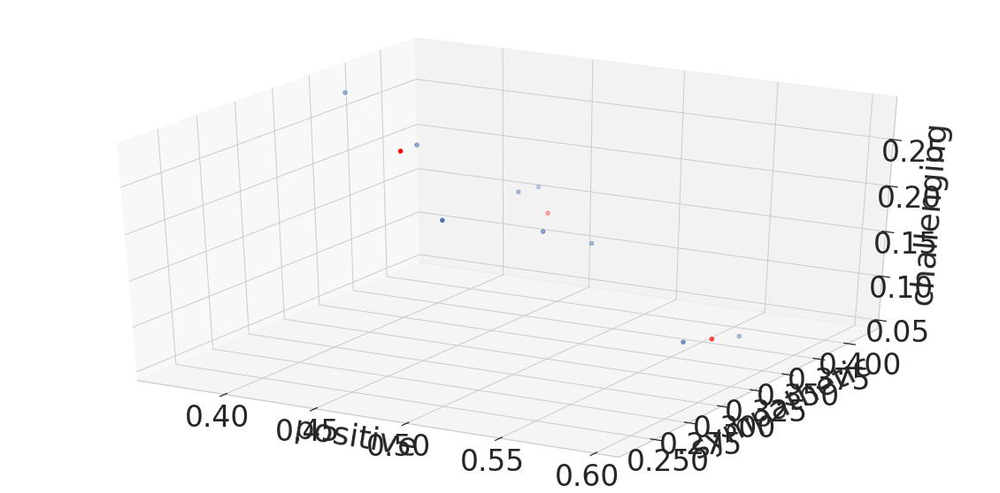

    0
0  DB
1  DP
2  FB
1  GB
2  JF
2  JW
0  LB
0  MR
2  PT


In [12]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

spvd_comp_log_df.groupby(["user_id"])["style"].value_counts(normalize=True)
Data = {'user': ['DB','DP','FB','GB','JF','JW','LB','MR','PT'],
        'positive': [0.367347,0.572581,0.492958,0.595960,0.492647,0.429825,0.511111,0.416149,0.445205],
        'sympathetic': [0.353741,0.370968,0.330986,0.292929,0.367647,0.412281,0.237037,0.341615,0.376712],
        'challenging': [0.278912,0.056452,0.176056,0.111111,0.139706,0.157895,0.251852,0.242236,0.178082]
       }

df = pd.DataFrame(Data,columns=['positive','sympathetic','challenging'])

kmeans = KMeans(n_clusters=3).fit(df)
centroids = kmeans.cluster_centers_
spvd_labels = kmeans.labels_

print(centroids)
print(spvd_labels)
user_result=pd.DataFrame(Data['user'],spvd_labels)

threedee = plt.figure().gca(projection='3d')
threedee.scatter(df['positive'], df['sympathetic'] ,df['challenging'])
threedee.set_xlabel('positive')
threedee.set_ylabel('sympathetic')
threedee.set_zlabel('challenging')

threedee.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c='red')

plt.show()
print(user_result)


In [43]:
pd.set_option('display.max_rows', None)
#drop walks
indexNames = spvd_comp_log_df[spvd_comp_log_df['action'] == 'WALK'].index
spvd_comp_log_df.drop(indexNames , inplace=True)

indexNames = spvd_comp_log_df[spvd_comp_log_df['action'] == 'RUN'].index
spvd_comp_log_df.drop(indexNames , inplace=True)

spvd_comp_log_df.groupby(["user_id"])["action"].value_counts(normalize=True)

Data = {'user': ['DB','DP','FB','GB','JF','JW','LB','MR','PT'],
        'praise': [0.307143,0.487603,0.395683,0.479167,0.383459,0.387387,0.325758,0.350649,0.338129],
        'challenge': [0.178571,0.099174,0.151079,0.104167,0.157895,0.198198,0.212121,0.188312,0.158273],
        'time': [0.271429,0.239669,0.187050,0.218750,0.150376,0.207207,0.166667,0.220779,0.280576],
        'maintain': [0.050000,0.074380,0.115108,0.093750,0.127820,0.090090,0.098485,0.116883,0.071942],
        'sympathise': [0.050000,0.016529,0.035971,0.010417,0.067669, 0.027027, 0.030303,0.025974,0.043165],
        'checkpre': [0.028571,0.033058,0.021583,0.041667,0.037594,0.036036,0.030303,0.025974,0.028777],
        'animation': [0.007143,0.016529,0.043165,0.031250,0.007519,0.027027, 0.022727,0.019481,0.028777],
        'get_closer': [0.057143,0.008264,0.035971,0.010417,0.037594,0.027027,0.045455,0.032468,0.035971],
        'humour': [0.042857,0.024793,0.014388,0.010417,0.030075,0,0.045455,0,0.007194],
        'speeddown': [0.007143,0,0,0,0,0,0,0.019481,0.007194],
        'speedup': [0,0,0,0,0,0, 0.022727,0,0]
       }

df = pd.DataFrame(Data,columns=['praise','challenge','time','maintain','sympathise','checkpre','animation','get_closer','humour'])

kmeans = KMeans(n_clusters=3).fit(df)
centroids = kmeans.cluster_centers_
spvd_labels = kmeans.labels_

print(centroids)
print(spvd_labels)
user_result=pd.DataFrame(Data['user'],spvd_labels)

print(user_result)


[[0.3685872 0.181521  0.1864158 0.1096772 0.0373888 0.030298  0.0239838
  0.035703  0.0179836]
 [0.322636  0.168422  0.2760025 0.060971  0.0465825 0.028674  0.01796
  0.046557  0.0250255]
 [0.483385  0.1016705 0.2292095 0.084065  0.013473  0.0373625 0.0238895
  0.0093405 0.017605 ]]
[1 2 0 2 0 0 0 0 1]
    0
1  DB
2  DP
0  FB
2  GB
0  JF
0  JW
0  LB
0  MR
1  PT


In [16]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

all_auto_df.groupby(["user_id"])["style"].value_counts(normalize=True)

Data = {'user': ['DB','DP','FB','GB','JF','JW','LB','MR','PT'],
        'positive': [0.521127,0.632075,0.597087,0.666667,0.436893,0.440000,0.587379,0.528169,0.736559],
        'sympathetic': [0.330986,0.235849,0.359223,0.294872,0.436893,0.440000,0.237864,0.429577,0.241935],
        'challenging': [0.140845,0.132075,0.043689,0.038462,0.058252,0.120000,0.174757,0.042254,0.021505]
       }

df = pd.DataFrame(Data,columns=['positive','sympathetic','challenging'])

kmeans = KMeans(n_clusters=3).fit(df)
centroids = kmeans.cluster_centers_
auto_labels = kmeans.labels_
print(centroids)
user_result=pd.DataFrame(Data['user'],auto_labels)

print(user_result)

#lame...

# threedee = plt.figure().gca(projection='3d')
# threedee.scatter(df['positive'], df['sympathetic'] ,df['challenging'])
# threedee.set_xlabel('positive')
# threedee.set_ylabel('sympathetic')
# threedee.set_zlabel('challenging')

# threedee.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c='red')

# plt.show()

# print(user_result)

[[0.666771   0.29867667 0.034552  ]
 [0.468354   0.43549    0.073502  ]
 [0.58019367 0.268233   0.14922567]]
    0
2  DB
2  DP
0  FB
0  GB
1  JF
1  JW
2  LB
1  MR
0  PT


In [35]:
pd.set_option('display.max_rows', None)

#drop walks
indexNames = all_auto_df[all_auto_df['action'] == 'WALK'].index
all_auto_df.drop(indexNames , inplace=True)

all_auto_df.groupby(["user_id"])["action"].value_counts(normalize=True)

Data = {'user': ['DB','DP','FB','GB','JF','JW','LB','MR','PT'],
        'praise': [0.309353,0.423077,0.470297,0.581699,0.381188,0.336735,0.371287,0.489209,0.295082],
        'challenge': [0.215827,0.125000,0.049505,0.058824,0.133663,0.183673,0.217822,0.115108,0.109290],
        'time': [0.187050,0.134615,0.118812,0.084967,0.059406,0.204082,0.108911,0.158273,0.273224],
        'maintain': [0.151079,0.105769,0.212871,0.143791,0.188119,0.102041,0.113861,0.057554,0.081967],
        'sympathise': [0.100719,0.067308,0,0.026144,0.148515,0.102041,0.089109,0.079137,0.081967],
        'checkpre': [0.035971,0, 0.024752,0.013072,0.049505,0.040816,0.024752,0.035971,0.010929],
        'animation': [0,0.105769,0.059406,0.078431,0,0.020408,0.019802,0.064748,0.147541],
        'get_closer': [0,0.019231,0,0.006536,0,0.010204,0.009901,0,0],
        'humour':[0,0.019231,0.034653,0.006536,0.029703,0,0.044554,0,0]
       }

df = pd.DataFrame(Data,columns=['praise','challenge','time','maintain','sympathise','checkpre','animation','get_closer','humour'])

kmeans = KMeans(n_clusters=3).fit(df)
centroids = kmeans.cluster_centers_
auto_labels = kmeans.labels_
print(centroids)
user_result=pd.DataFrame(Data['user'],auto_labels)

print(user_result)


[[0.295082   0.10929    0.273224   0.081967   0.081967   0.010929
  0.147541   0.         0.        ]
 [0.4910705  0.08710925 0.12416675 0.12999625 0.04314725 0.01844875
  0.0770885  0.00644175 0.015105  ]
 [0.34964075 0.18774625 0.13986225 0.138775   0.110096   0.037761
  0.0100525  0.00502625 0.01856425]]
    0
2  DB
1  DP
1  FB
1  GB
2  JF
2  JW
2  LB
1  MR
0  PT


In [28]:
user_data = {
        'user': ['GB','MR','JF','JW','DP','LB','FB','DB','PT'],
        'self_attitude': [0.8,0.87,0.93,1.0,0.67,1.0,0.8,0.87,1.0],
        'expert_attitude': [1.0,0.93,0.8,1.0,0.87,1.0,1.0,0.93,0.93],
        'extraversion': [0.78,0.86,0.79,0.71,0.71,0.93,0.5,0.93,0.86],
        'agreeableness': [0.85,0.64,0.71,0.86,0.71,0.93,0.86,0.43,0.64],
        'conscientiousness': [0.86,0.79,0.5,0.86,0.5,0.86,0.86,0.71,0.79],
        'emotional_stability': [0.92,0.86,1.0,0.79,0.64,0.79,1.0,1.0,0.57],
        'openness_experience': [0.93,0.93,0.86,0.93,0.14,1.0,0.79,0.57,1.0],
        'activity_level':[0.75,0.5,0.75,0.75,0.5,1.0,0.75,0.75,1.0],
    }

df = pd.DataFrame(user_data,columns=['self_attitude','expert_attitude','extraversion','agreeableness','conscientiousness','emotional_stability','openness_experience','activity_level'])

kmeans = KMeans(n_clusters=3).fit(df)
centroids = kmeans.cluster_centers_
all_data_labels = kmeans.labels_

print(centroids)
user_result=pd.DataFrame(user_data['user'],all_data_labels)

print(user_result)

[[0.89       0.88666667 0.86       0.59333333 0.66666667 0.95333333
  0.78666667 0.66666667]
 [0.67       0.87       0.71       0.71       0.5        0.64
  0.14       0.5       ]
 [0.92       0.986      0.756      0.828      0.846      0.814
  0.93       0.85      ]]
    0
2  GB
0  MR
0  JF
2  JW
1  DP
2  LB
2  FB
0  DB
2  PT


In [26]:
user_personality_only = {
        'user': ['GB','MR','JF','JW','DP','LB','FB','DB','PT'],
        'extraversion': [0.78,0.86,0.79,0.71,0.71,0.93,0.5,0.93,0.86],
        'agreeableness': [0.85,0.64,0.71,0.86,0.71,0.93,0.86,0.43,0.64],
        'conscientiousness': [0.86,0.79,0.5,0.86,0.5,0.86,0.86,0.71,0.79],
        'emotional_stability': [0.92,0.86,1.0,0.79,0.64,0.79,1.0,1.0,0.57],
        'openness_experience': [0.93,0.93,0.86,0.93,0.14,1.0,0.79,0.57,1.0],
    }

df = pd.DataFrame(user_personality_only,columns=['extraversion','agreeableness','conscientiousness','emotional_stability','openness_experience'])

kmeans = KMeans(n_clusters=3).fit(df)
centroids = kmeans.cluster_centers_
personality_labels = kmeans.labels_

print(centroids)
user_result=pd.DataFrame(user_personality_only['user'],personality_labels)

print(user_result)

[[0.77333333 0.79666667 0.83666667 0.82166667 0.93      ]
 [0.86       0.57       0.605      1.         0.715     ]
 [0.71       0.71       0.5        0.64       0.14      ]]
    0
0  GB
0  MR
1  JF
0  JW
2  DP
0  LB
0  FB
1  DB
0  PT
